# Overview

This notebook generates exposure/adoption vs change scatter plots for numeric fields and skill category families.
It only saves plots (no tables) and shows correlation metrics below each chart.


# Setup & Assumptions

- Assumes existing objects: df, df_skill, WEIGHT, YEARS, PERIODS, _period_label, noga_label_col,
  soski_mentions, ict_mentions, exp_mentions.
- Uses occupation exposure for ISCO2 and industry exposure for NOGA.
- Adoption share defaults to late period (2020-2024) weighted mean of the adoption indicator.


In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import json as _json
import bz2 as _bz2
from collections import defaultdict


def _find_root():
    if '__file__' in globals():
        return Path(__file__).resolve().parents[2]
    cwd = Path.cwd().resolve()
    for p in [cwd] + list(cwd.parents):
        if (p / 'Results Datasets' / 'final_analysis_dataset.parquet').exists():
            return p
    return cwd


# --- Bootstrap missing globals (load from disk if needed)
if 'df' not in globals():
    ROOT = globals().get('ROOT', _find_root())
    DATA_PATH = ROOT / 'Results Datasets' / 'final_analysis_dataset.parquet'
    if not DATA_PATH.exists():
        raise RuntimeError(f'Missing dataset: {DATA_PATH}')
    df = pd.read_parquet(DATA_PATH)
    if 'adve_time_year' in df.columns:
        df = df[(df['adve_time_year'] >= 2010) & (df['adve_time_year'] <= 2024)].copy()

if 'WEIGHT' not in globals():
    WEIGHT = 'srvy_wght_tru2'

if WEIGHT not in df.columns:
    raise RuntimeError(f'Missing weight column in df: {WEIGHT}')

if 'YEARS' not in globals():
    YEARS = sorted(df['adve_time_year'].dropna().astype(int).unique())
    YEARS = [y for y in YEARS if 2010 <= y <= 2024]

if 'PERIODS' not in globals():
    PERIODS = [(2010, 2014, '2010-2014'), (2015, 2019, '2015-2019'), (2020, 2024, '2020-2024')]

if '_period_label' not in globals():
    def _period_label(y):
        for a, b, lbl in PERIODS:
            if a <= y <= b:
                return lbl
        return None

if 'noga_label_col' not in globals():
    if 'industry_section_label' in df.columns:
        noga_label_col = 'industry_section_label'
    elif 'noga_section_label' in df.columns:
        noga_label_col = 'noga_section_label'
    else:
        raise RuntimeError('Missing NOGA label column (industry_section_label or noga_section_label).')

if 'df_skill' not in globals():
    skill_cols = ['adve_iden_adve', 'adve_time_year', WEIGHT, 'occupation_exposure', 'industry_exposure_weighted', 'occu_isco2_label']
    if noga_label_col in df.columns:
        skill_cols.append(noga_label_col)
    df_skill = df[skill_cols].copy()


# --- Drop non-standard/missing-exposure groups globally
_exclude_isco2 = {'Non-commissioned armed forces officers'}
_exclude_noga = {'Activities of extraterritorial organisations', 'Activities of households as employers'}
if 'occu_isco2_label' in df.columns:
    df = df[~df['occu_isco2_label'].isin(_exclude_isco2)].copy()
if noga_label_col in df.columns:
    df = df[~df[noga_label_col].isin(_exclude_noga)].copy()
if 'df_skill' in globals():
    if 'occu_isco2_label' in df_skill.columns:
        df_skill = df_skill[~df_skill['occu_isco2_label'].isin(_exclude_isco2)].copy()
    if noga_label_col in df_skill.columns:
        df_skill = df_skill[~df_skill[noga_label_col].isin(_exclude_noga)].copy()

# --- Skill mentions bootstrap
if 'soski_mentions' not in globals() or 'ict_mentions' not in globals() or 'exp_mentions' not in globals():
    ROOT = globals().get('ROOT', _find_root())
    SKILL_BASE = ROOT / 'Base Dataset' / 'Data' / '699_SJMM_Data_TextualData_v10.0' / 'sjmm_suf_standoff'
    SOSKI_DIR = SKILL_BASE / 'soski-de'
    ICT_DIR = SKILL_BASE / 'ict-de'
    EXP_DIR = SKILL_BASE / 'edu_exp_lng-de'

    if not SKILL_BASE.exists():
        raise RuntimeError(f'Missing skill base directory: {SKILL_BASE}')

    def _find_year_file(folder, prefix, year):
        for suffix in ['.jsonl.bz2', '.jsonl']:
            path = folder / f'{prefix}-{year}{suffix}'
            if path.exists():
                return path
        return None

    def _iter_jsonl(path):
        opener = _bz2.open if path.suffix == '.bz2' else open
        with opener(path, 'rt', encoding='utf-8') as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                yield _json.loads(line)

    def _best_label_from_mappings(mappings, target_ontology=None, allow_fallback=False):
        if mappings:
            for mapping in mappings:
                if target_ontology and mapping.get('ontology') != target_ontology:
                    continue
                classes = mapping.get('classes') or []
                if classes:
                    best = max(classes, key=lambda c: c.get('score', 0))
                    return best.get('label')
        if allow_fallback and mappings:
            for mapping in mappings:
                classes = mapping.get('classes') or []
                if classes:
                    best = max(classes, key=lambda c: c.get('score', 0))
                    return best.get('label')
        return None

    def _extract_soski_l2(obj):
        cats = set()
        for span in obj.get('spans', []) or []:
            label = _best_label_from_mappings(span.get('mappings', []), 'skillprofiler-L2')
            if label:
                cats.add(label)
        return cats

    def _extract_ict_l2(obj):
        cats = set()
        for span in obj.get('spans', []) or []:
            label = _best_label_from_mappings(span.get('mappings', []), 'onetSMM-L2')
            if label:
                cats.add(label)
        return cats

    def _extract_exp_skill(obj):
        cats = set()
        for span in obj.get('spans', []) or []:
            if span.get('label') != 'EXP':
                continue
            for sub in span.get('subspans', []) or []:
                if sub.get('label') not in ('SKILL', 'SkillContainer'):
                    continue
                label = _best_label_from_mappings(sub.get('mappings', []), 'ESCO', allow_fallback=True)
                if label:
                    cats.add(label)
        return cats

    def _collect_categories(folder, prefix, years, id_set, extractor, family_tag):
        ad_to_cats = defaultdict(set)
        for y in years:
            path = _find_year_file(folder, prefix, y)
            if path is None:
                print(f'Missing {family_tag} file for {y}')
                continue
            print(f'Loading {family_tag} {y}...')
            for obj in _iter_jsonl(path):
                adve = obj.get('adve_iden_adve')
                if adve not in id_set:
                    continue
                cats = extractor(obj)
                if cats:
                    ad_to_cats[adve].update(cats)
        rows = [{'adve_iden_adve': adve, 'category': cat} for adve, cats in ad_to_cats.items() for cat in cats]
        return pd.DataFrame(rows)

    ADVE_IDS = set(df_skill['adve_iden_adve'].dropna().unique())
    if 'soski_mentions' not in globals():
        soski_mentions = _collect_categories(SOSKI_DIR, 'soski-catg-de', YEARS, ADVE_IDS, _extract_soski_l2, 'soski')
    if 'ict_mentions' not in globals():
        ict_mentions = _collect_categories(ICT_DIR, 'ict-catg-de', YEARS, ADVE_IDS, _extract_ict_l2, 'ict')
    if 'exp_mentions' not in globals():
        exp_mentions = _collect_categories(EXP_DIR, 'edu_exp_lng-catg-de', YEARS, ADVE_IDS, _extract_exp_skill, 'exp')

# --- Fail fast if required objects are missing
_required_globals = ['df', 'df_skill', 'WEIGHT', 'YEARS', 'PERIODS', '_period_label', 'noga_label_col', 'soski_mentions', 'ict_mentions', 'exp_mentions']
_missing = [name for name in _required_globals if name not in globals()]
if _missing:
    raise RuntimeError(f"Missing required globals: {', '.join(_missing)}")

# --- Basic column checks
_required_df_cols = ['adve_iden_adve', 'adve_time_year', 'occu_isco2_label', 'occupation_exposure', 'industry_exposure_weighted']
for _col in _required_df_cols:
    if _col not in df.columns:
        raise RuntimeError(f'Missing required column in df: {_col}')

if noga_label_col not in df.columns:
    raise RuntimeError(f'Missing NOGA label column in df: {noga_label_col}')

_required_skill_cols = ['adve_iden_adve', 'adve_time_year', WEIGHT]
for _col in _required_skill_cols:
    if _col not in df_skill.columns:
        raise RuntimeError(f'Missing required column in df_skill: {_col}')

# Numeric/value fields expected in df
# Numeric/value fields expected in df
_mgmt_col = 'vaca_posi_mana_clean' if 'vaca_posi_mana_clean' in df.columns else 'vaca_posi_mana'
_resp_col = 'vaca_posi_resp_clean' if 'vaca_posi_resp_clean' in df.columns else 'vaca_posi_resp'
_numeric_fields = {
    'educ_years': 'incu_educ_yrsm',
    'management_pos': _mgmt_col,
    'responsibility_pos': _resp_col,
}
for _tag, _col in _numeric_fields.items():
    if _col not in df.columns:
        raise RuntimeError(f'Missing numeric field in df: {_col}')
# Adoption indicator
if 'adoption_col' in globals():
    _adoption_col = adoption_col
elif 'ai_requirement' in df.columns:
    _adoption_col = 'ai_requirement'
elif 'ai_adoption' in df.columns:
    _adoption_col = 'ai_adoption'
else:
    raise RuntimeError('Missing adoption indicator column (adoption_col, ai_requirement, or ai_adoption).')

# Output directory
if 'OUT_VIS' in globals():
    OUT_PLOTS = Path(OUT_VIS)
else:
    OUT_PLOTS = Path.cwd() / 'Results Datasets' / 'analysis' / 'exposure_adoption_vs_change' / 'visuals'
OUT_PLOTS.mkdir(parents=True, exist_ok=True)

print('Using output directory:', OUT_PLOTS)


Loading soski 2010...
Loading soski 2011...
Loading soski 2012...
Loading soski 2013...
Loading soski 2014...
Loading soski 2015...
Loading soski 2016...
Loading soski 2017...
Loading soski 2018...
Loading soski 2019...
Loading soski 2020...
Loading soski 2021...
Loading soski 2022...
Loading soski 2023...
Loading soski 2024...
Loading ict 2010...
Loading ict 2011...
Loading ict 2012...
Loading ict 2013...
Loading ict 2014...
Loading ict 2015...
Loading ict 2016...
Loading ict 2017...
Loading ict 2018...
Loading ict 2019...
Loading ict 2020...
Loading ict 2021...
Loading ict 2022...
Loading ict 2023...
Loading ict 2024...
Loading exp 2010...
Loading exp 2011...
Loading exp 2012...
Loading exp 2013...
Loading exp 2014...
Loading exp 2015...
Loading exp 2016...
Loading exp 2017...
Loading exp 2018...
Loading exp 2019...
Loading exp 2020...
Loading exp 2021...
Loading exp 2022...
Loading exp 2023...
Loading exp 2024...
Using output directory: /Users/miguel/Documents/Master Thesis/Thesis/s

# Shared Utilities

Helpers for weighted means, group-year aggregation, axis values, and plotting with correlations.


In [2]:
def _to_indicator(series):
    if pd.api.types.is_bool_dtype(series):
        return series.astype(float)
    if pd.api.types.is_numeric_dtype(series):
        return pd.to_numeric(series, errors='coerce')
    s = series.astype(str).str.lower()
    return s.isin(['true', '1', 'yes']).astype(float)


def _weighted_mean(series, weights):
    s = pd.to_numeric(series, errors='coerce')
    w = pd.to_numeric(weights, errors='coerce')
    mask = s.notna() & w.notna()
    if not mask.any():
        return np.nan
    return np.average(s[mask], weights=w[mask])


def _group_year_weighted_mean(base_df, group_col, value_col):
    tmp = base_df[[group_col, 'adve_time_year', WEIGHT, value_col]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    out = (
        tmp.groupby([group_col, 'adve_time_year'])
           .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
           .rename('value')
           .reset_index()
           .rename(columns={group_col: 'group'})
    )
    return out


def _group_weighted_mean(base_df, group_col, value_col, year_filter=None):
    tmp = base_df[[group_col, 'adve_time_year', WEIGHT, value_col]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    if year_filter is not None:
        tmp = tmp[tmp['adve_time_year'].isin(year_filter)]
    out = (
        tmp.groupby(group_col)
           .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
           .rename('value')
           .reset_index()
           .rename(columns={group_col: 'group'})
    )
    return out


def _group_demand_last(base_df, group_col, last_year):
    tmp = base_df[[group_col, 'adve_time_year', WEIGHT]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    tmp = tmp[tmp['adve_time_year'] == last_year]
    out = (
        tmp.groupby(group_col)[WEIGHT]
           .sum()
           .rename('demand_last')
           .reset_index()
           .rename(columns={group_col: 'group'})
    )
    return out



def _scatter_with_corr_below(df_in, x_col, y_col, title, x_label, y_label, out_path, size_col=None):
    df_plot = df_in[['group', x_col, y_col]].copy()
    if size_col is not None and size_col in df_in.columns:
        df_plot[size_col] = df_in[size_col]

    valid = df_plot.dropna(subset=[x_col, y_col])
    n = len(valid)

    if n >= 2:
        try:
            pr, pp = stats.pearsonr(valid[x_col], valid[y_col])
        except Exception:
            pr, pp = np.nan, np.nan
        try:
            sr, sp = stats.spearmanr(valid[x_col], valid[y_col])
        except Exception:
            sr, sp = np.nan, np.nan
    else:
        pr = pp = sr = sp = np.nan

    fig, ax = plt.subplots(figsize=(6, 4))
    if size_col is not None and size_col in valid.columns and valid[size_col].notna().any():
        sizes = 20 + 180 * (valid[size_col] / valid[size_col].max())
        ax.scatter(valid[x_col], valid[y_col], s=sizes, alpha=0.7)
    else:
        ax.scatter(valid[x_col], valid[y_col], alpha=0.7)


    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)

    corr_text = (
        f"Pearson r={pr:.3f}, p={pp:.3g} | "
        f"Spearman rho={sr:.3f}, p={sp:.3g} | N={n}"
    )
    fig.subplots_adjust(bottom=0.22)
    fig.text(0.5, 0.02, corr_text, ha='center', va='bottom', fontsize=9)

    fig.tight_layout(rect=[0, 0.06, 1, 1])
    fig.savefig(out_path, dpi=150)
    plt.show()

    return {'pearson_r': pr, 'pearson_p': pp, 'spearman_r': sr, 'spearman_p': sp, 'n': n}


# --- Group configs and axes (computed once)
GROUP_CONFIGS = [
    {'group_tag': 'isco2', 'group_col': 'occu_isco2_label', 'exp_col': 'occupation_exposure', 'label': 'ISCO2'},
    {'group_tag': 'noga', 'group_col': noga_label_col, 'exp_col': 'industry_exposure_weighted', 'label': 'NOGA'},
]

ADOPTION_INDICATOR = _to_indicator(df[_adoption_col])
LATE_YEARS = [y for y in YEARS if 2020 <= y <= 2024]
LAST_YEAR = max(YEARS) if YEARS else None

GROUP_AXES = {}
for cfg in GROUP_CONFIGS:
    gcol = cfg['group_col']
    if gcol not in df.columns:
        raise RuntimeError(f"Missing group column in df: {gcol}")

    exp_df = _group_weighted_mean(df, gcol, cfg['exp_col'])
    exp_df = exp_df.rename(columns={'value': 'mean_exposure'})

    ad_tmp = df.copy()
    ad_tmp['_adoption'] = ADOPTION_INDICATOR
    adoption_df = _group_weighted_mean(ad_tmp, gcol, '_adoption', year_filter=LATE_YEARS)
    adoption_df = adoption_df.rename(columns={'value': 'adoption_share'})

    demand_df = _group_demand_last(df, gcol, LAST_YEAR)

    axes_df = exp_df.merge(adoption_df, on='group', how='left')
    axes_df = axes_df.merge(demand_df, on='group', how='left')
    GROUP_AXES[cfg['group_tag']] = axes_df

print('Prepared group-level axes for:', ', '.join(GROUP_AXES.keys()))


Prepared group-level axes for: isco2, noga


/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx

# Define Change Metrics

For numeric and count-based fields, we use:
- Period difference: mean(2020-2024) minus mean(2010-2014)
- Cumulative change: sum of absolute year-to-year changes
- Average annual change: mean of absolute year-to-year changes

For prevalence-shift, we use the union of categories and sum absolute differences.


In [3]:
EARLY_LABEL = '2010-2014'
LATE_LABEL = '2020-2024'


def _compute_change_metrics(value_df):
    rows = []
    for grp, g in value_df.groupby('group'):
        g = g.dropna(subset=['value'])
        if g.empty:
            rows.append({'group': grp, 'period_diff': np.nan, 'cumulative_change': np.nan, 'average_change': np.nan})
            continue

        g = g.sort_values('adve_time_year')
        vals = g['value'].to_numpy()

        diffs = np.diff(vals)
        cumulative = float(diffs.sum()) if len(diffs) else np.nan
        average = float(diffs.mean()) if len(diffs) else np.nan

        g = g.copy()
        g['period'] = g['adve_time_year'].map(_period_label)
        early_vals = g[g['period'] == EARLY_LABEL]['value']
        late_vals = g[g['period'] == LATE_LABEL]['value']
        if len(early_vals) and len(late_vals):
            period_diff = float(late_vals.mean() - early_vals.mean())
        else:
            period_diff = np.nan

        rows.append({
            'group': grp,
            'period_diff': period_diff,
            'cumulative_change': cumulative,
            'average_change': average,
        })

    return pd.DataFrame(rows)


def _build_prevalence_tables(mentions_df, base_df, group_col):
    base = base_df[['adve_iden_adve', group_col, 'adve_time_year', WEIGHT]].dropna(subset=[group_col, 'adve_time_year'])
    base['adve_time_year'] = base['adve_time_year'].astype(int)

    mention = mentions_df.merge(base, on='adve_iden_adve', how='inner')
    if mention.empty:
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

    mention_weight = (
        mention.groupby([group_col, 'adve_time_year', 'category'])[WEIGHT]
               .sum()
               .rename('mention_weight')
               .reset_index()
    )
    total_weight = (
        base.groupby([group_col, 'adve_time_year'])[WEIGHT]
            .sum()
            .rename('total_weight')
            .reset_index()
    )

    prevalence = mention_weight.merge(total_weight, on=[group_col, 'adve_time_year'], how='left')
    prevalence['f'] = prevalence['mention_weight'] / prevalence['total_weight']
    return prevalence, mention_weight, total_weight


def _prevalence_shift_metrics(prevalence_df, mention_weight_df, total_weight_df, group_col, min_total_weight=0, require_consecutive_years=True):
    rows = []
    for grp, g in prevalence_df.groupby(group_col):
        tw = total_weight_df[total_weight_df[group_col] == grp].copy()
        years = sorted(tw['adve_time_year'].unique()) if not tw.empty else []
        if len(years) < 2:
            rows.append({'group': grp, 'period_shift': np.nan, 'cumulative_shift': np.nan, 'average_shift': np.nan})
            continue

        year_series = {
            y: g[g['adve_time_year'] == y].set_index('category')['f']
            for y in years
        }

        shifts = []
        prev_y = None
        for y in years:
            if prev_y is None:
                prev_y = y
                continue
            if require_consecutive_years and y != prev_y + 1:
                prev_y = y
                continue

            prev_tw = tw.loc[tw['adve_time_year'] == prev_y, 'total_weight']
            curr_tw = tw.loc[tw['adve_time_year'] == y, 'total_weight']
            if prev_tw.empty or curr_tw.empty:
                prev_y = y
                continue
            if prev_tw.iloc[0] < min_total_weight or curr_tw.iloc[0] < min_total_weight:
                prev_y = y
                continue

            prev = year_series.get(prev_y, pd.Series(dtype=float))
            curr = year_series.get(y, pd.Series(dtype=float))
            all_cats = prev.index.union(curr.index)
            diff = (prev.reindex(all_cats, fill_value=0) - curr.reindex(all_cats, fill_value=0)).abs().sum()
            shifts.append(diff)
            prev_y = y

        cumulative = float(np.sum(shifts)) if shifts else np.nan
        average = float(np.mean(shifts)) if shifts else np.nan

        # Period shift: 2010-2014 vs 2020-2024
        period_shift = np.nan
        if not mention_weight_df.empty and not total_weight_df.empty:
            mw = mention_weight_df[mention_weight_df[group_col] == grp].copy()
            tw = total_weight_df[total_weight_df[group_col] == grp].copy()
            if not mw.empty and not tw.empty:
                mw['period'] = mw['adve_time_year'].map(_period_label)
                tw['period'] = tw['adve_time_year'].map(_period_label)

                mw = mw[mw['period'].isin([EARLY_LABEL, LATE_LABEL])]
                tw = tw[tw['period'].isin([EARLY_LABEL, LATE_LABEL])]

                mwp = (
                    mw.groupby(['period', 'category'])['mention_weight']
                      .sum()
                      .reset_index()
                )
                twp = (
                    tw.groupby('period')['total_weight']
                      .sum()
                      .reset_index()
                )

                period_f = mwp.merge(twp, on='period', how='left')
                period_f['f'] = period_f['mention_weight'] / period_f['total_weight']

                f_early = period_f[period_f['period'] == EARLY_LABEL].set_index('category')['f']
                f_late = period_f[period_f['period'] == LATE_LABEL].set_index('category')['f']

                early_years = tw[tw['period'] == EARLY_LABEL]['adve_time_year'].unique()
                late_years = tw[tw['period'] == LATE_LABEL]['adve_time_year'].unique()
                early_tw = twp.loc[twp['period'] == EARLY_LABEL, 'total_weight']
                late_tw = twp.loc[twp['period'] == LATE_LABEL, 'total_weight']

                if len(early_years) >= 2 and len(late_years) >= 2:
                    if (not early_tw.empty and not late_tw.empty and
                        early_tw.iloc[0] >= min_total_weight and late_tw.iloc[0] >= min_total_weight):
                        all_cats = f_early.index.union(f_late.index)
                        period_shift = (
                            f_early.reindex(all_cats, fill_value=0)
                            .sub(f_late.reindex(all_cats, fill_value=0))
                            .abs()
                            .sum()
                        )

        rows.append({
            'group': grp,
            'period_shift': period_shift,
            'cumulative_shift': cumulative,
            'average_shift': average,
        })

    return pd.DataFrame(rows)


# Numeric/Value Fields - Generate Plots

Fields: education years, management position, responsibility position.


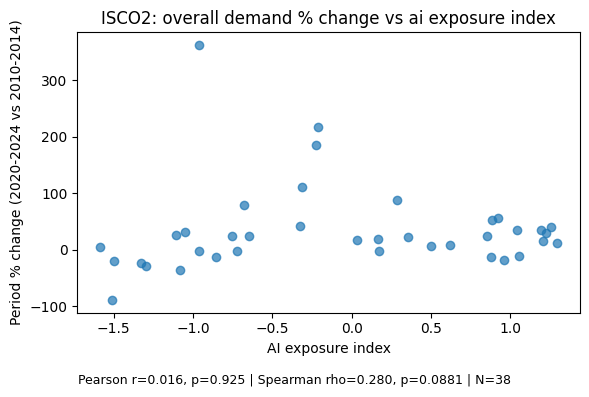

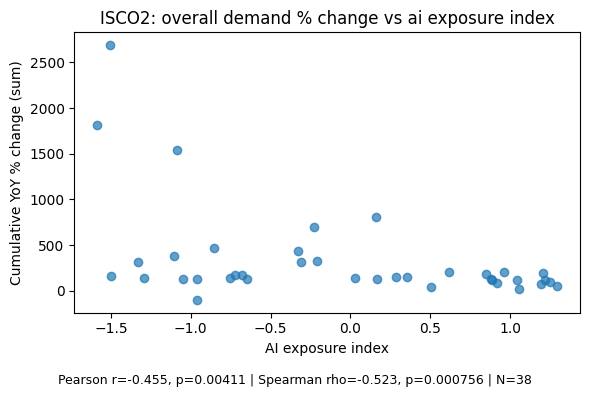

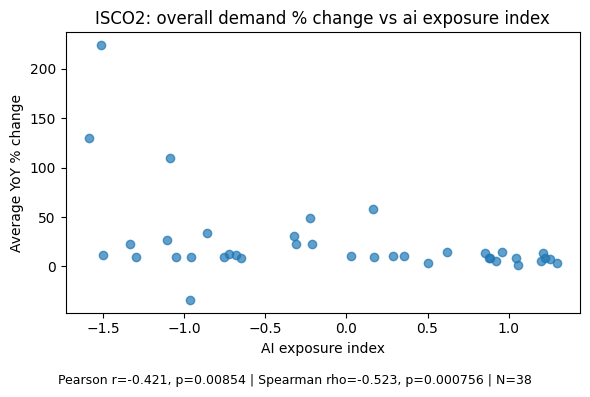

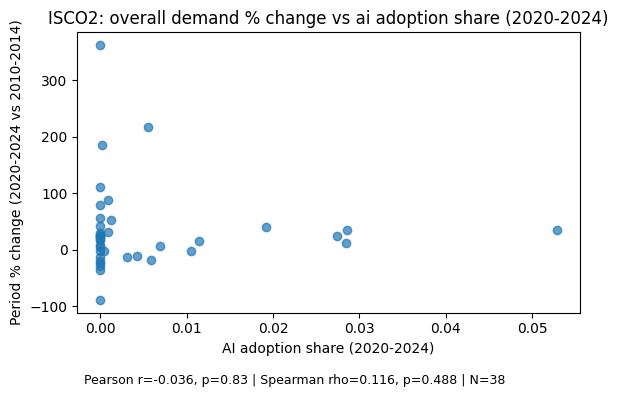

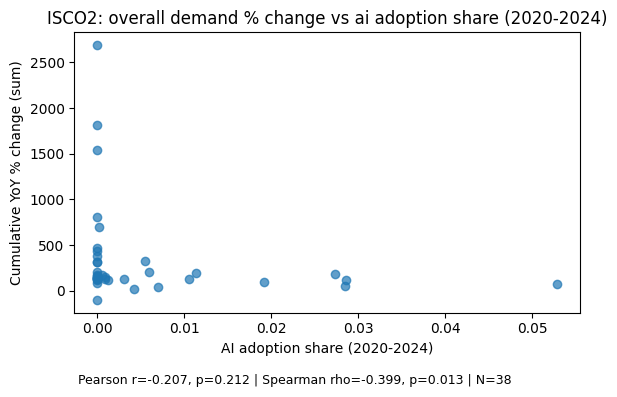

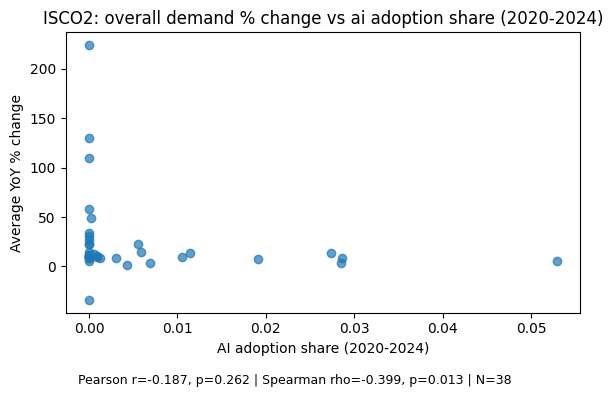

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/1767913291.py:58: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped.apply(lambda g: pd.Series({


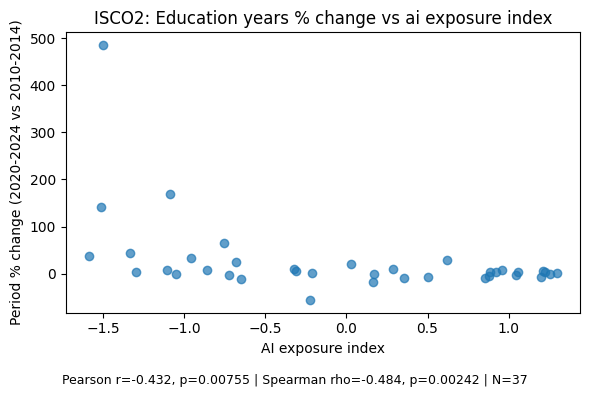

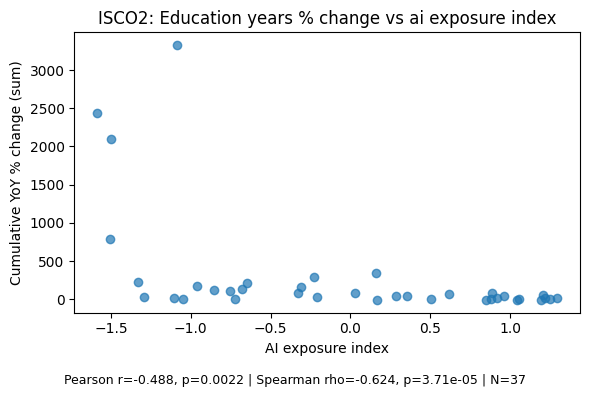

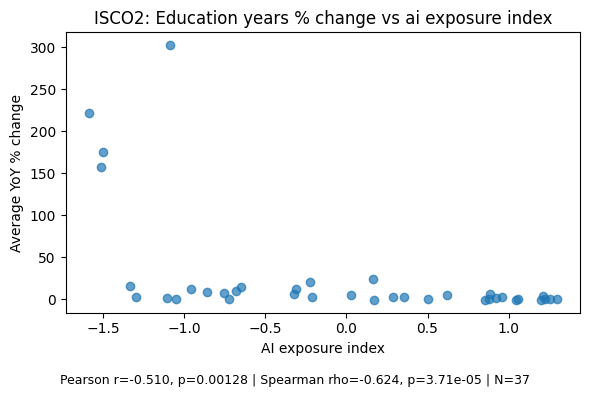

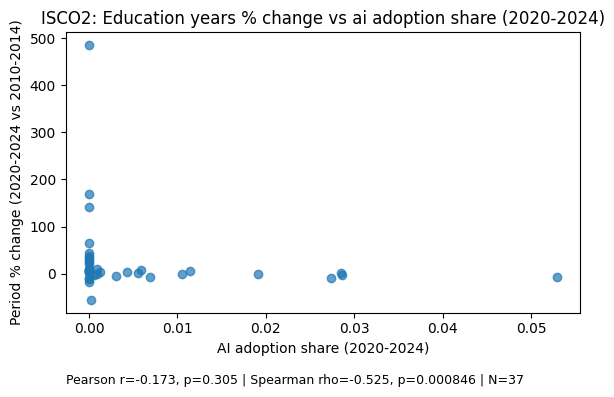

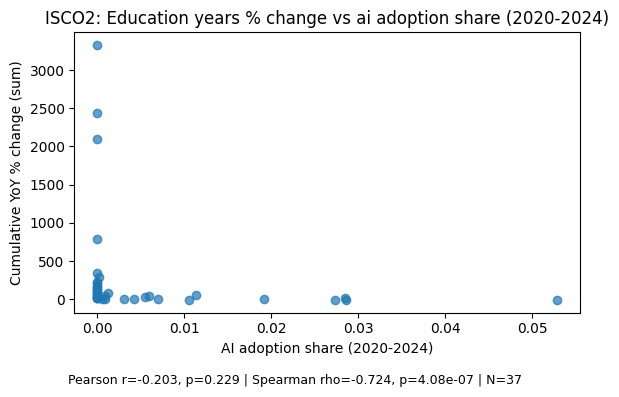

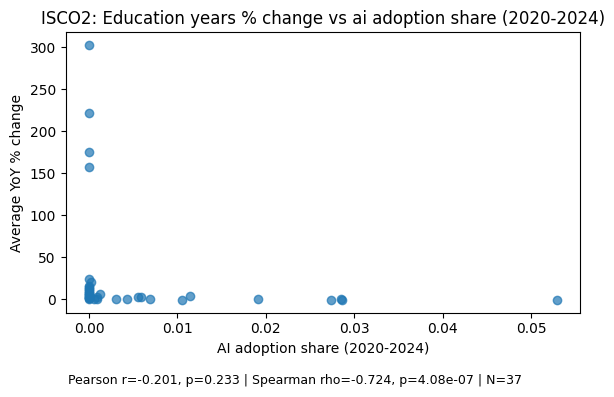

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/1767913291.py:80: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped.apply(lambda g: pd.Series({


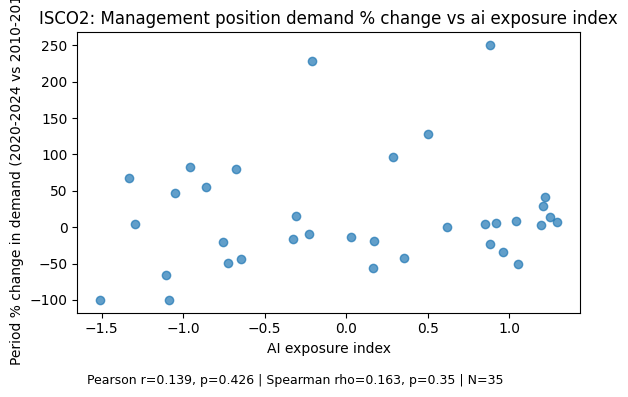

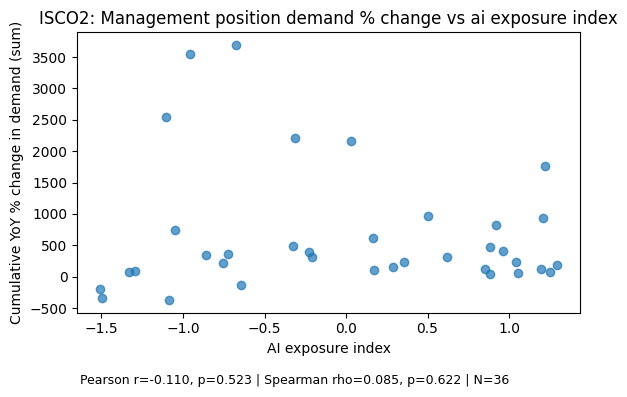

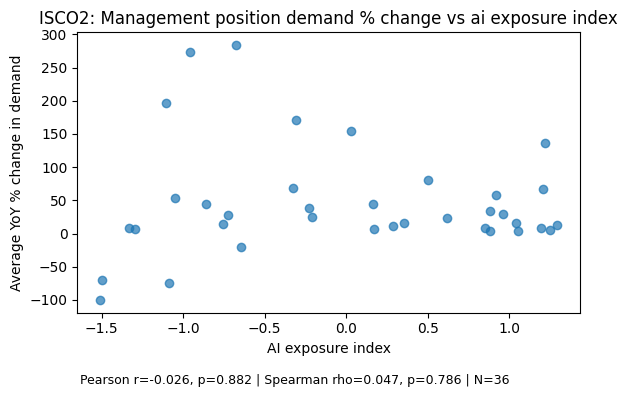

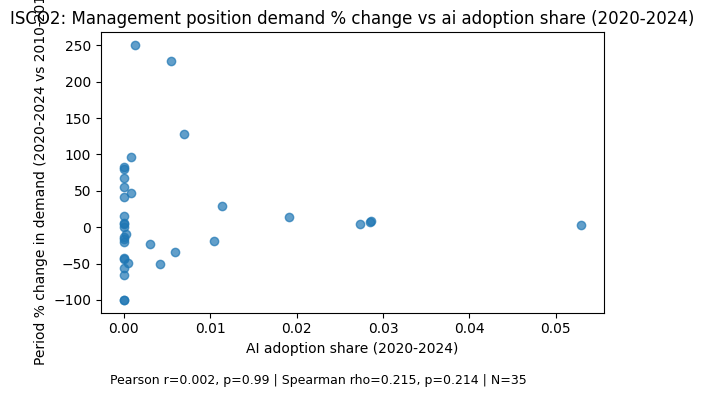

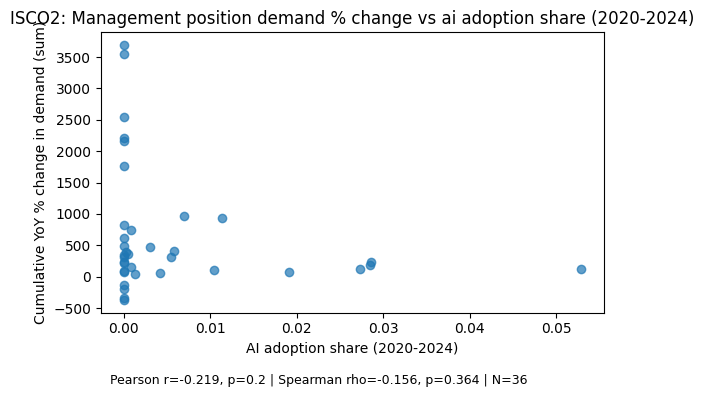

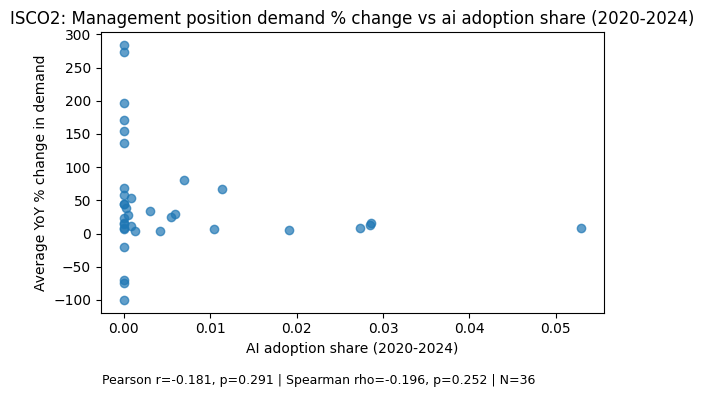

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/1767913291.py:80: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped.apply(lambda g: pd.Series({


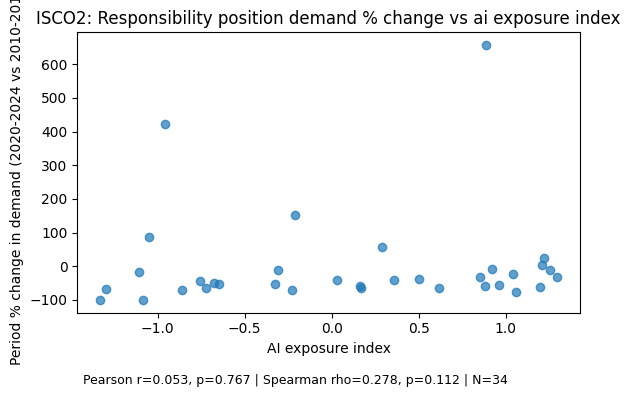

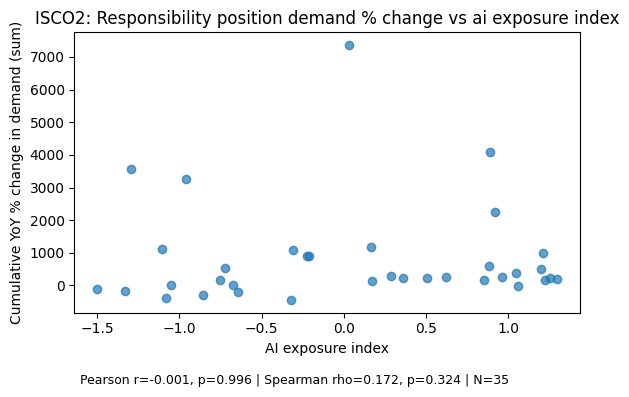

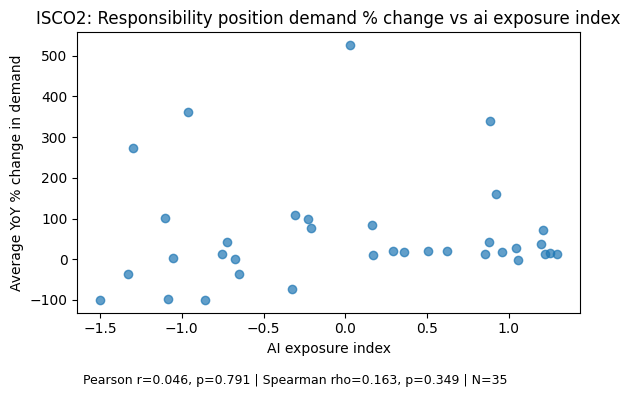

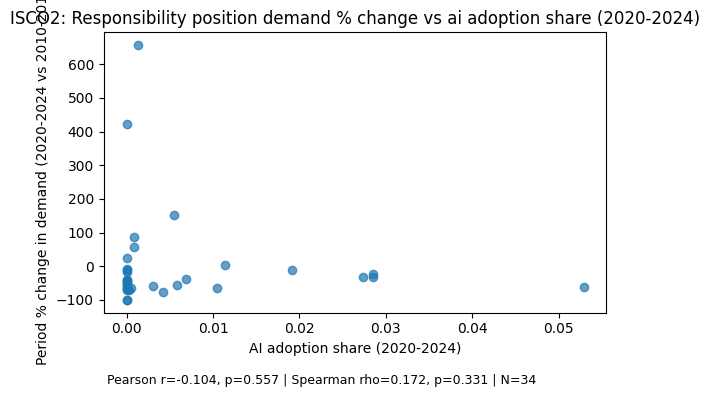

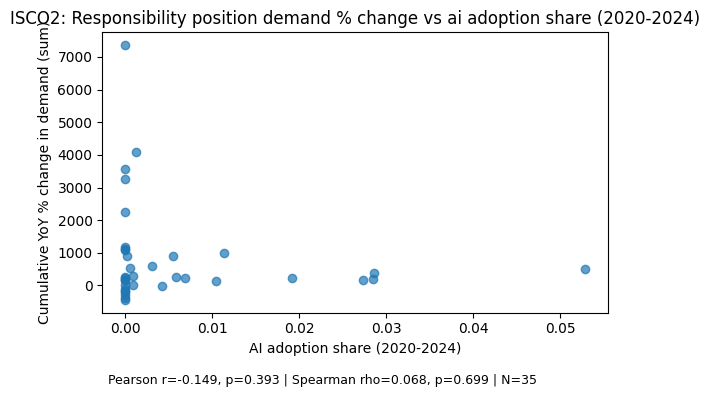

...

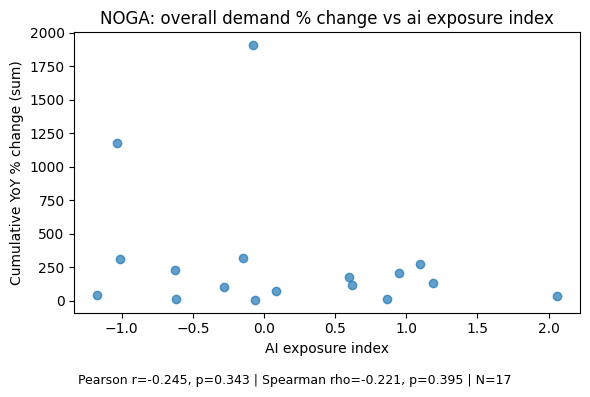

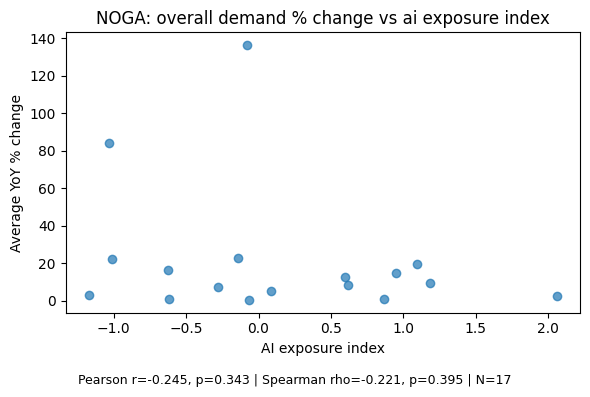

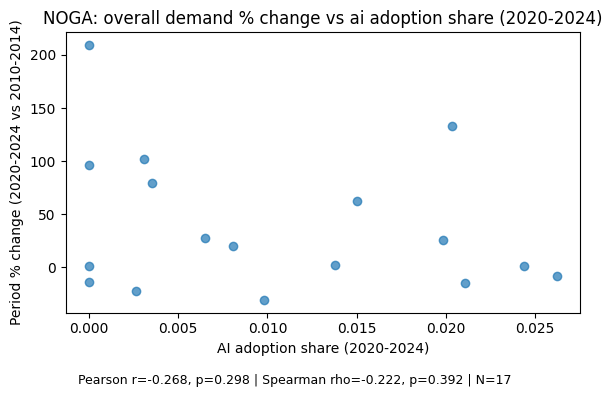

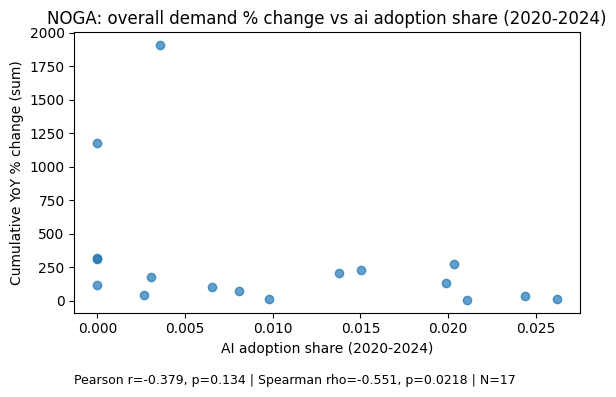

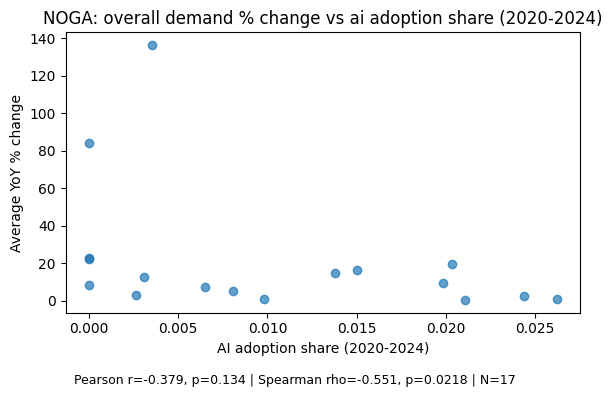

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/1767913291.py:58: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped.apply(lambda g: pd.Series({


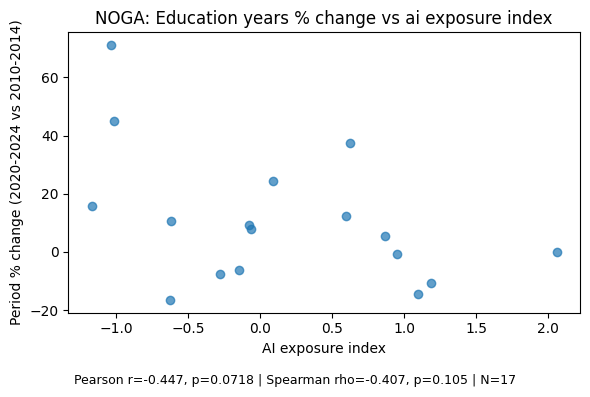

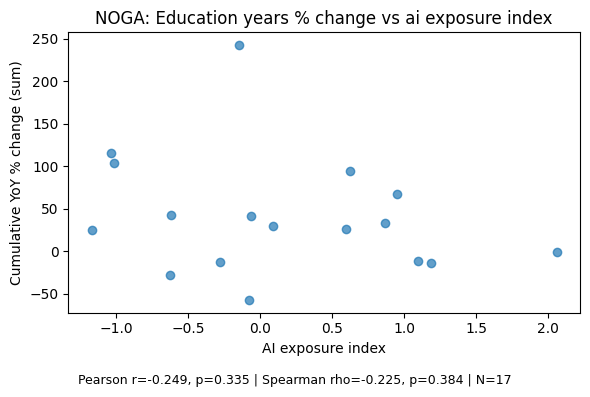

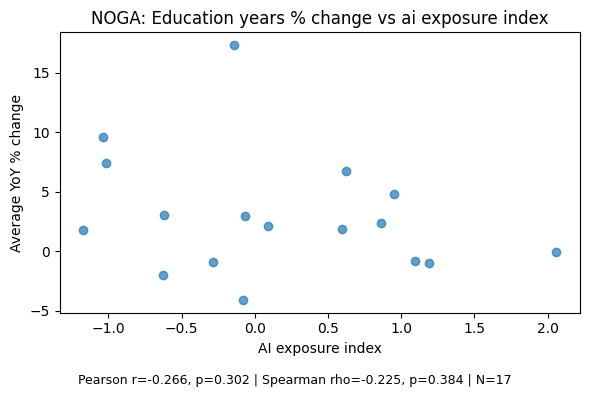

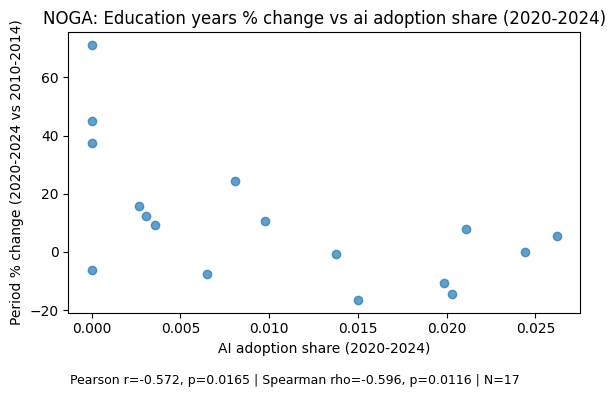

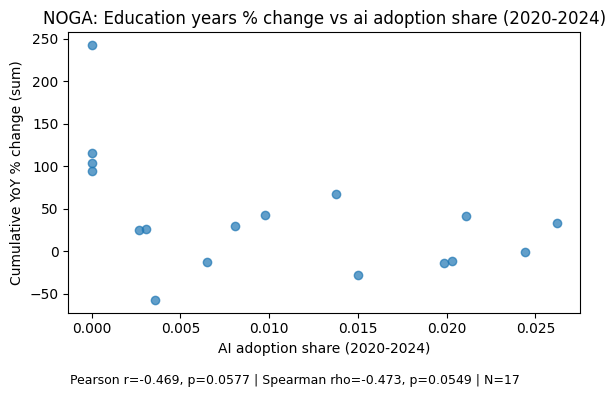

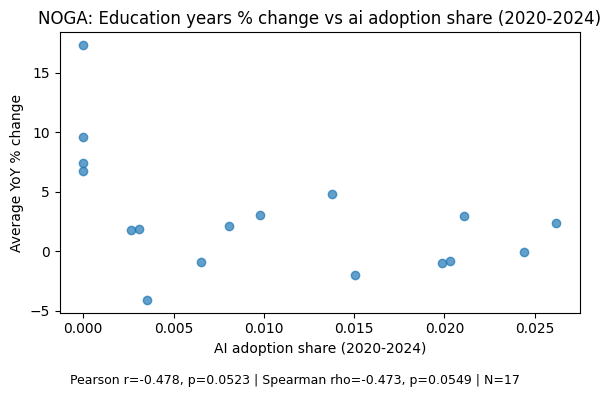

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/1767913291.py:80: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped.apply(lambda g: pd.Series({


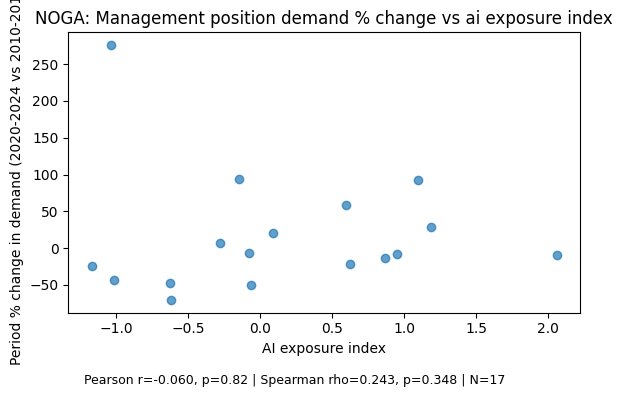

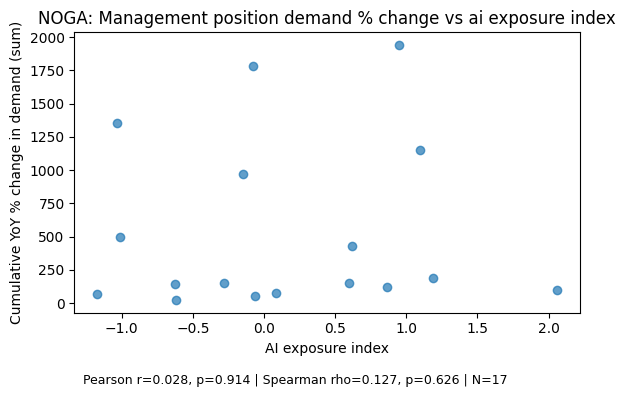

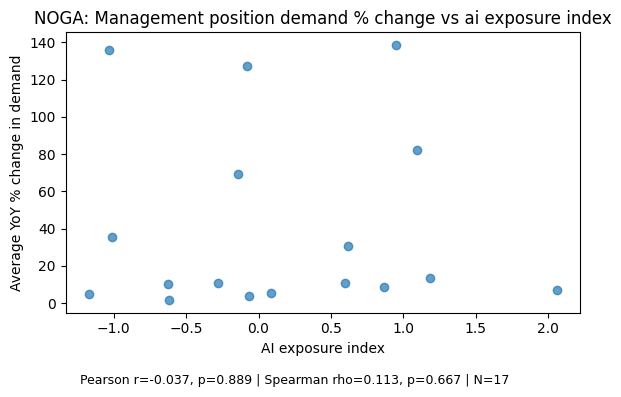

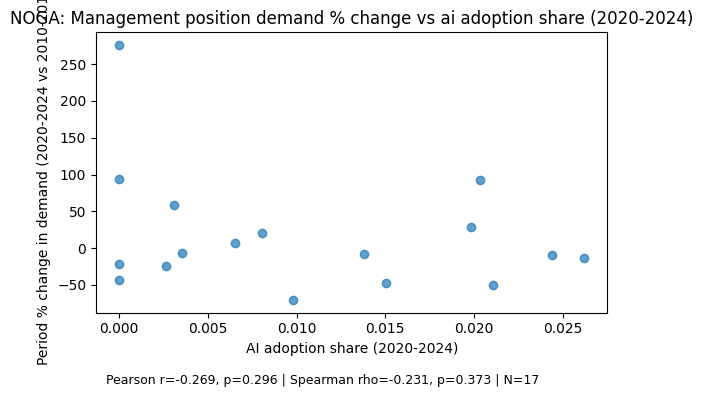

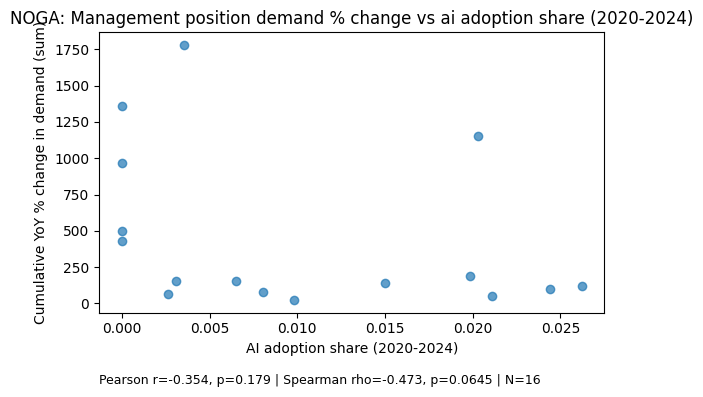

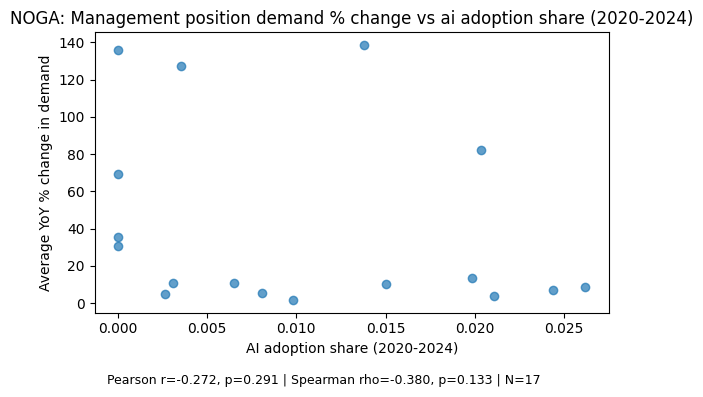

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/1767913291.py:80: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped.apply(lambda g: pd.Series({


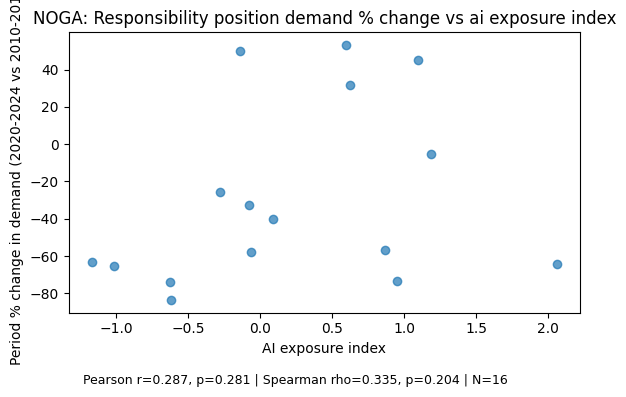

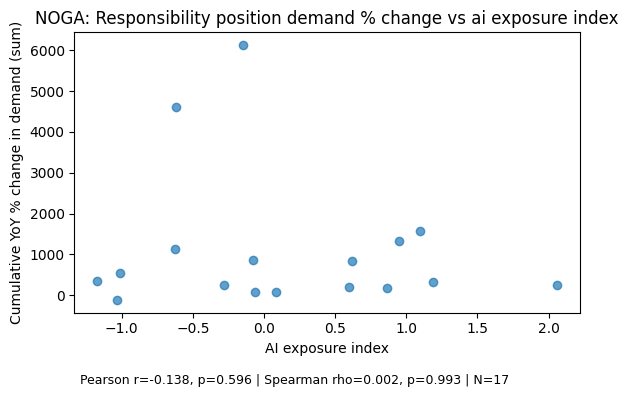

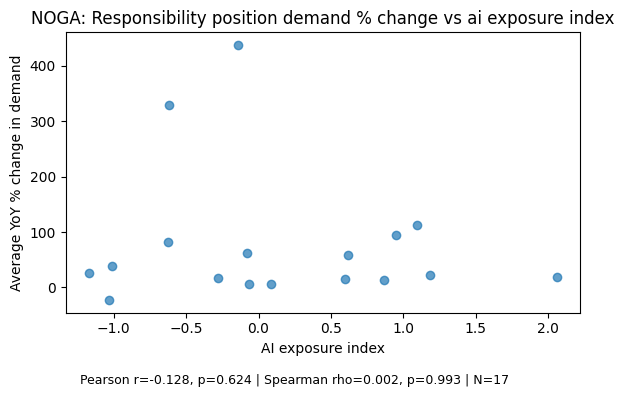

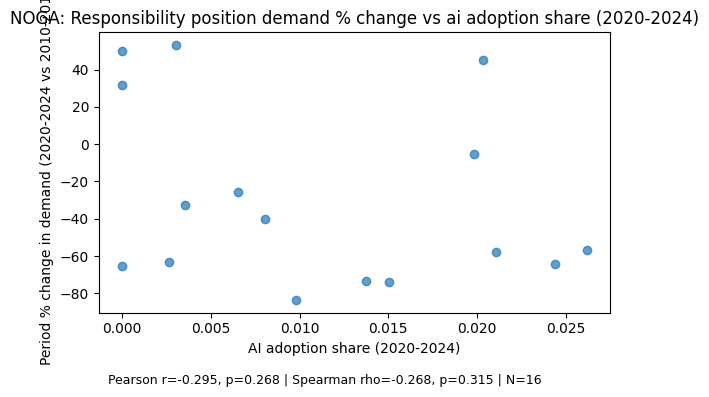

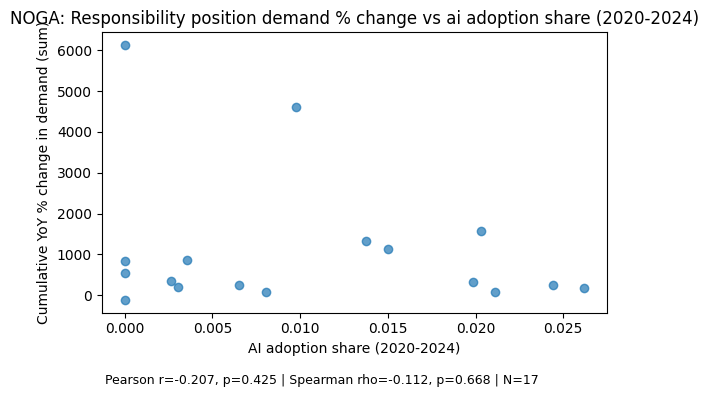

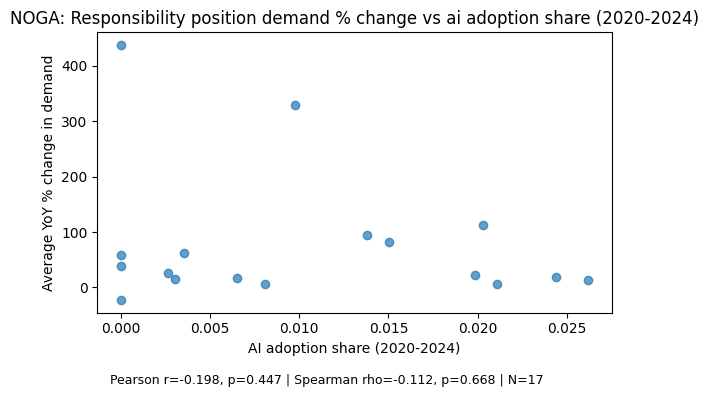

In [7]:
NUMERIC_FIELDS = [
    {'field_tag': 'educ_years', 'col': _numeric_fields['educ_years'], 'label': 'Education years'},
]

BINARY_DEMAND_FIELDS = [
    {'field_tag': 'management_pos', 'col': _numeric_fields['management_pos'], 'label': 'Management position'},
    {'field_tag': 'responsibility_pos', 'col': _numeric_fields['responsibility_pos'], 'label': 'Responsibility position'},
]

Y_METRICS_REL = [
    ('period_pct_change', 'Period % change (2020-2024 vs 2010-2014)'),
    ('cumulative_pct_change', 'Cumulative YoY % change (sum)'),
    ('average_pct_change', 'Average YoY % change'),
]

Y_METRICS_REL_DEMAND = [
    ('period_pct_change', 'Period % change in demand (2020-2024 vs 2010-2014)'),
    ('cumulative_pct_change', 'Cumulative YoY % change in demand (sum)'),
    ('average_pct_change', 'Average YoY % change in demand'),
]

X_AXES = [
    ('exposure', 'mean_exposure', 'AI exposure index'),
    ('adoption', 'adoption_share', 'AI adoption share (2020-2024)'),
]

THRESH_ISCO2 = 50
THRESH_NOGA = 100


def _threshold_for_group_tag(tag):
    return THRESH_ISCO2 if tag == 'isco2' else THRESH_NOGA


def _group_year_demand(base_df, group_col):
    tmp = base_df[[group_col, 'adve_time_year', WEIGHT]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    out = (
        tmp.groupby([group_col, 'adve_time_year'])[WEIGHT]
           .sum()
           .rename('value')
           .reset_index()
           .rename(columns={group_col: 'group'})
    )
    out['total_weight'] = out['value']
    return out


def _group_year_weighted_mean(base_df, group_col, value_col):
    tmp = base_df[[group_col, 'adve_time_year', WEIGHT, value_col]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    tmp[value_col] = pd.to_numeric(tmp[value_col].replace('NA', np.nan), errors='coerce')
    tmp = tmp[tmp[value_col].notna()]
    if tmp.empty:
        return pd.DataFrame(columns=['group', 'adve_time_year', 'value', 'total_weight'])
    grouped = tmp.groupby([group_col, 'adve_time_year'])
    out = (
        grouped.apply(lambda g: pd.Series({
            'value': _weighted_mean(g[value_col], g[WEIGHT]),
            'total_weight': g[WEIGHT].sum(),
        }))
        .reset_index()
        .rename(columns={group_col: 'group'})
    )
    return out


def _binary_demand_group_year(base_df, group_col, value_col):
    tmp = base_df[[group_col, 'adve_time_year', WEIGHT, value_col]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    vals = pd.to_numeric(tmp[value_col], errors='coerce')
    vals = vals.where(vals.isin([0, 1]))
    tmp['_val'] = vals
    tmp = tmp[tmp['_val'].notna()]
    if tmp.empty:
        return pd.DataFrame(columns=['group', 'adve_time_year', 'value', 'total_weight'])
    tmp['demand_val'] = np.where(tmp['_val'] == 1, tmp[WEIGHT], 0.0)
    grouped = tmp.groupby([group_col, 'adve_time_year'])
    out = (
        grouped.apply(lambda g: pd.Series({
            'value': g['demand_val'].sum(),
            'total_weight': g[WEIGHT].sum(),
        }))
        .reset_index()
        .rename(columns={group_col: 'group'})
    )
    return out


def _compute_relative_change_metrics(value_df, threshold):
    if value_df.empty:
        return pd.DataFrame(columns=['group', 'period_pct_change', 'cumulative_pct_change', 'average_pct_change'])

    value_df = value_df[value_df['total_weight'] >= threshold].copy()
    rows = []

    for grp, g in value_df.groupby('group'):
        g = g.dropna(subset=['value', 'total_weight'])
        if g.empty:
            rows.append({'group': grp, 'period_pct_change': np.nan, 'cumulative_pct_change': np.nan, 'average_pct_change': np.nan})
            continue

        g = g.sort_values('adve_time_year')
        g['prev_year'] = g['adve_time_year'].shift(1)
        g['prev'] = g['value'].shift(1)
        g['yoy_pct'] = np.where(
            (g['adve_time_year'] == (g['prev_year'] + 1)) & (g['prev'] > 0),
            g['value'] / g['prev'] - 1,
            np.nan,
        )

        valid_yoy = g['yoy_pct'].dropna()
        cumulative = float(valid_yoy.sum()) if len(valid_yoy) else np.nan
        average = float(valid_yoy.mean()) if len(valid_yoy) else np.nan

        g = g.copy()
        g['period'] = g['adve_time_year'].map(_period_label)
        early = g[g['period'] == EARLY_LABEL]
        late = g[g['period'] == LATE_LABEL]

        period_pct = np.nan
        if len(early) >= 2 and len(late) >= 2:
            early_tw = early['total_weight'].sum()
            late_tw = late['total_weight'].sum()
            if early_tw >= threshold and late_tw >= threshold:
                early_mean = np.average(early['value'], weights=early['total_weight'])
                late_mean = np.average(late['value'], weights=late['total_weight'])
                if early_mean > 0:
                    period_pct = late_mean / early_mean - 1

        rows.append({
            'group': grp,
            'period_pct_change': period_pct,
            'cumulative_pct_change': cumulative,
            'average_pct_change': average,
        })

    out = pd.DataFrame(rows)
    for col in ['period_pct_change', 'cumulative_pct_change', 'average_pct_change']:
        out[col] = out[col] * 100
    return out


for cfg in GROUP_CONFIGS:
    gtag = cfg['group_tag']
    gcol = cfg['group_col']
    axes_df = GROUP_AXES[gtag]
    threshold = _threshold_for_group_tag(gtag)

    # Overall demand (relative % change)
    demand_df = _group_year_demand(df, gcol)
    if gtag == 'noga':
        demand_df = demand_df[demand_df['group'] != 'Activities of households as employers']
    demand_metrics = _compute_relative_change_metrics(demand_df, 0)
    demand_plot = demand_metrics.merge(axes_df, on='group', how='left')

    for x_tag, x_col, x_label in X_AXES:
        for y_tag, y_label in Y_METRICS_REL:
            out_name = f"{gtag}__demand__rel_pct__x-{x_tag}__y-{y_tag}.png"
            out_path = OUT_PLOTS / out_name
            title = f"{cfg['label']}: overall demand % change vs {x_label.lower()}"
            _scatter_with_corr_below(
                demand_plot, x_col, y_tag, title, x_label, y_label, out_path
            )

    # Education years (relative % change)
    for field in NUMERIC_FIELDS:
        value_df = _group_year_weighted_mean(df, gcol, field['col'])
        metrics_df = _compute_relative_change_metrics(value_df, threshold)
        plot_df = metrics_df.merge(axes_df, on='group', how='left')

        for x_tag, x_col, x_label in X_AXES:
            for y_tag, y_label in Y_METRICS_REL:
                out_name = f"{gtag}__{field['field_tag']}__rel_pct__x-{x_tag}__y-{y_tag}.png"
                out_path = OUT_PLOTS / out_name
                title = f"{cfg['label']}: {field['label']} % change vs {x_label.lower()}"

                _scatter_with_corr_below(
                    plot_df, x_col, y_tag, title, x_label, y_label, out_path
                )

    # Management / Responsibility (relative % change in demand)
    for field in BINARY_DEMAND_FIELDS:
        value_df = _binary_demand_group_year(df, gcol, field['col'])
        metrics_df = _compute_relative_change_metrics(value_df, threshold)
        plot_df = metrics_df.merge(axes_df, on='group', how='left')

        for x_tag, x_col, x_label in X_AXES:
            for y_tag, y_label in Y_METRICS_REL_DEMAND:
                out_name = f"{gtag}__{field['field_tag']}__demand_rel_pct__x-{x_tag}__y-{y_tag}.png"
                out_path = OUT_PLOTS / out_name
                title = f"{cfg['label']}: {field['label']} demand % change vs {x_label.lower()}"

                plot_df_use = plot_df
                if gtag == 'noga' and field['field_tag'] == 'management_pos' and x_tag == 'adoption' and y_tag == 'cumulative_pct_change':
                    plot_df_use = plot_df_use[~plot_df_use['group'].isin([
                        'Activities of extraterritorial organisations',
                        'Real estate activities',
                    ])]

                _scatter_with_corr_below(
                    plot_df_use, x_col, y_tag, title, x_label, y_label, out_path
                )



# Category Fields - COUNT Variant - Generate Plots

For each family: compute per-ad category count, then weighted mean count per group-year.


/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/870649050.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g['cat_count'], g[WEIGHT]))


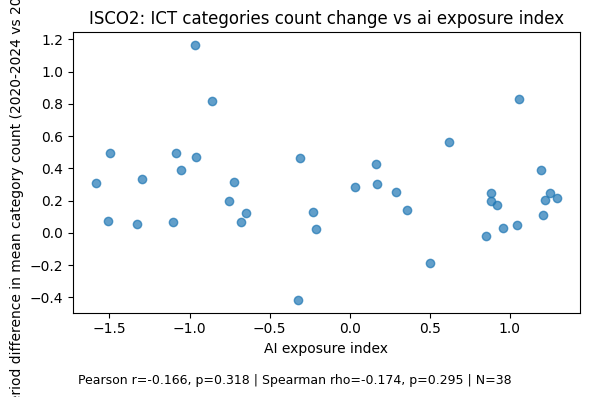

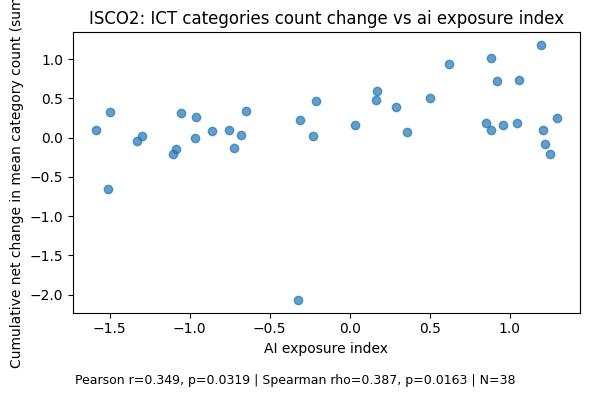

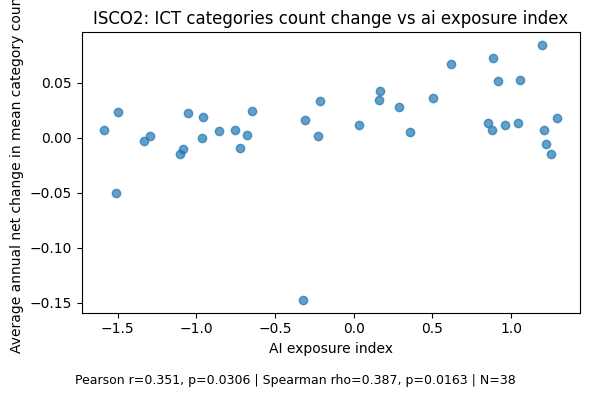

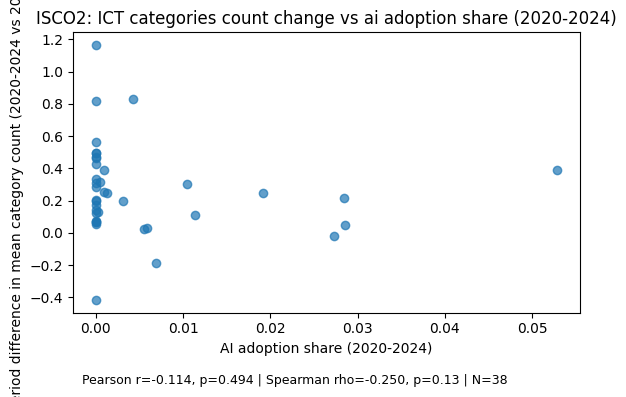

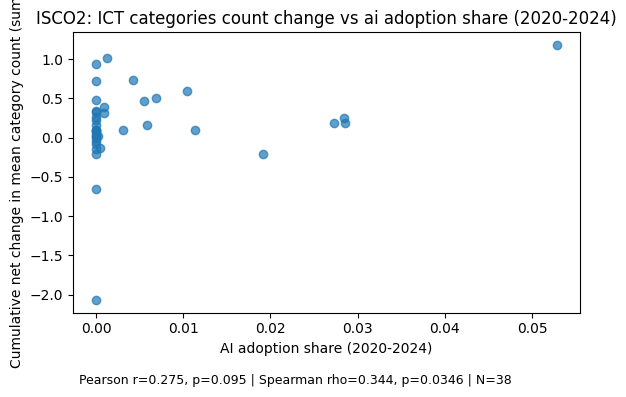

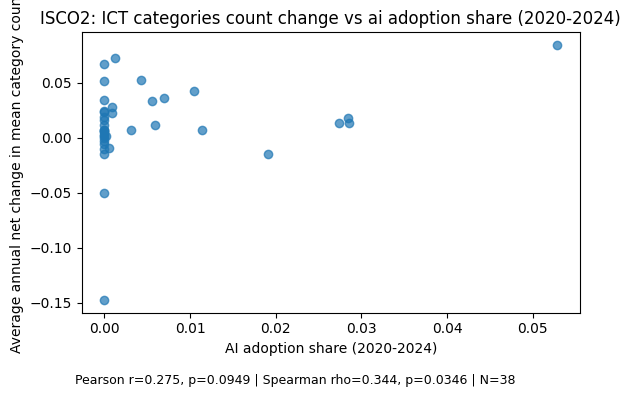

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/870649050.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g['cat_count'], g[WEIGHT]))


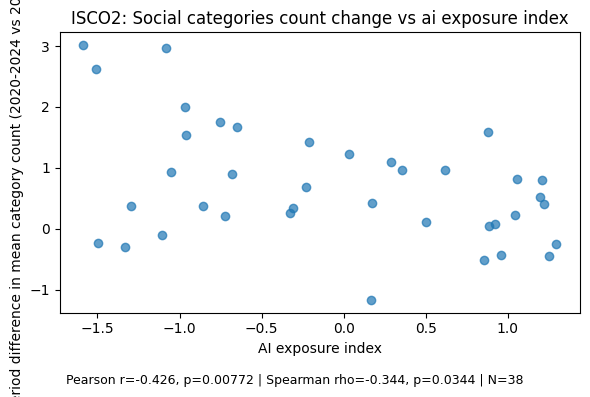

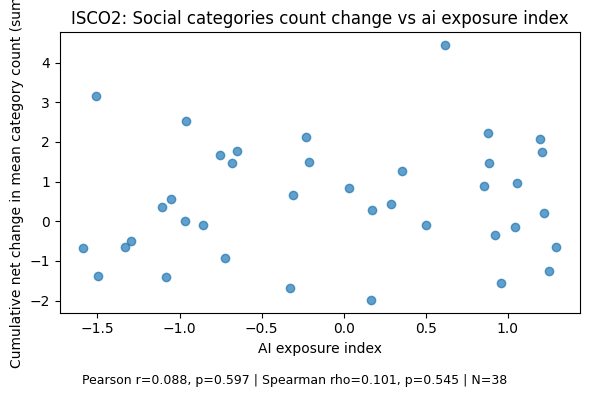

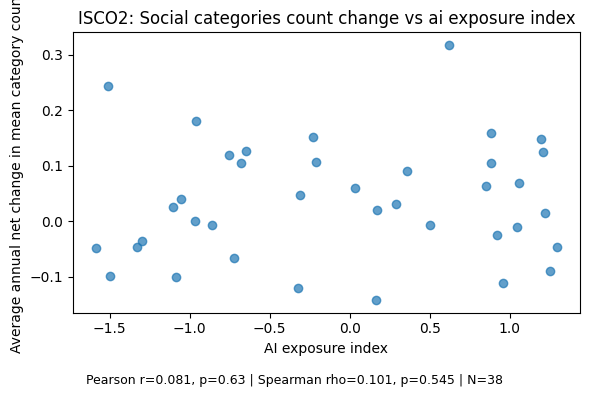

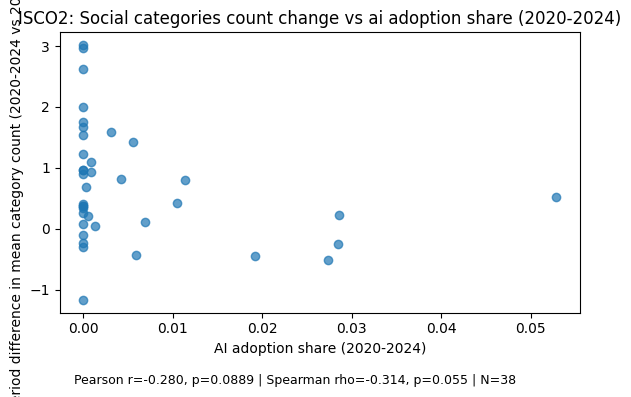

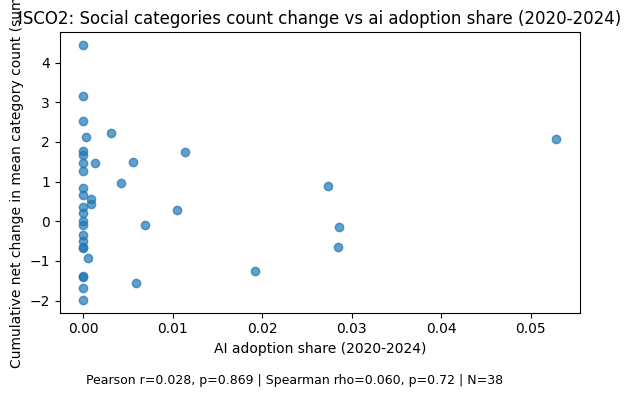

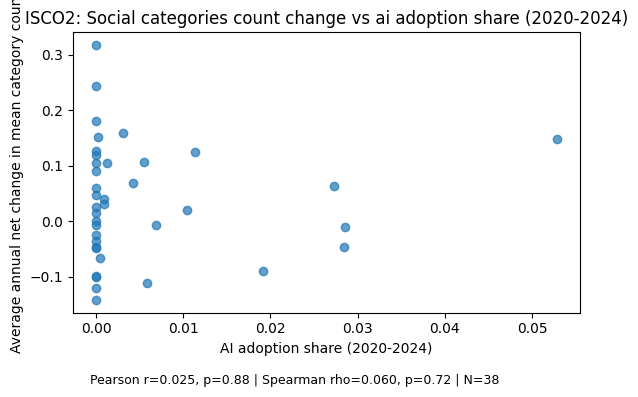

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/870649050.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g['cat_count'], g[WEIGHT]))


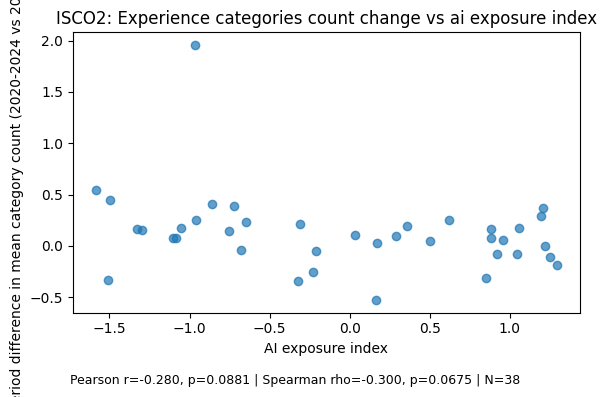

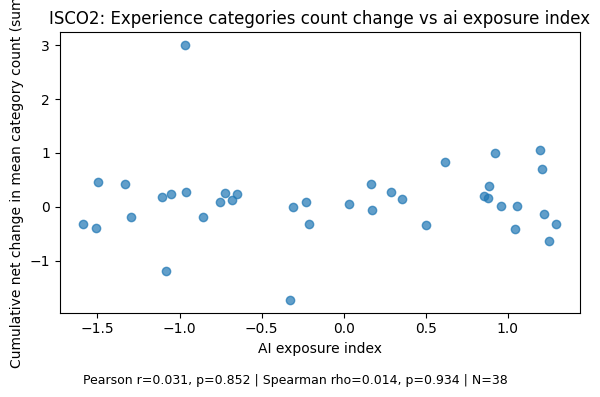

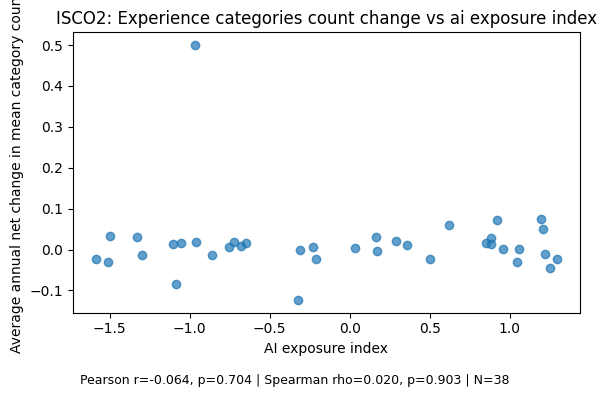

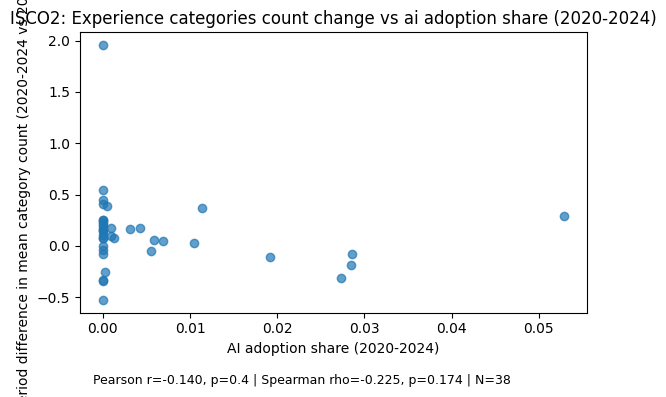

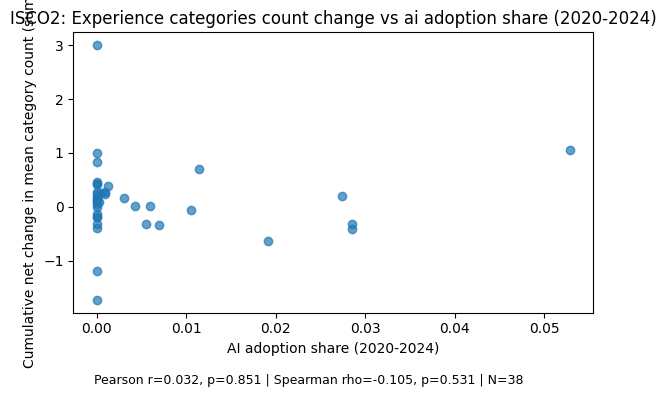

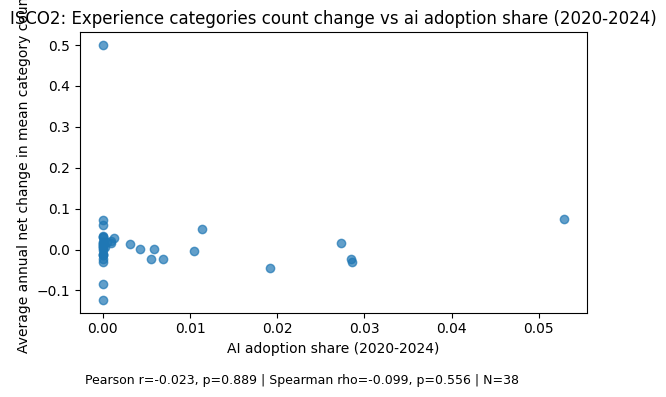

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/870649050.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g['cat_count'], g[WEIGHT]))


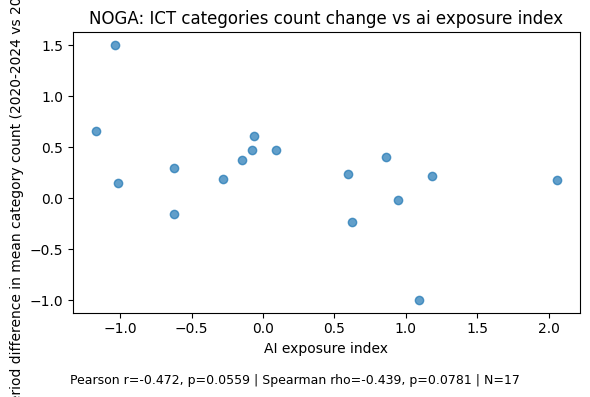

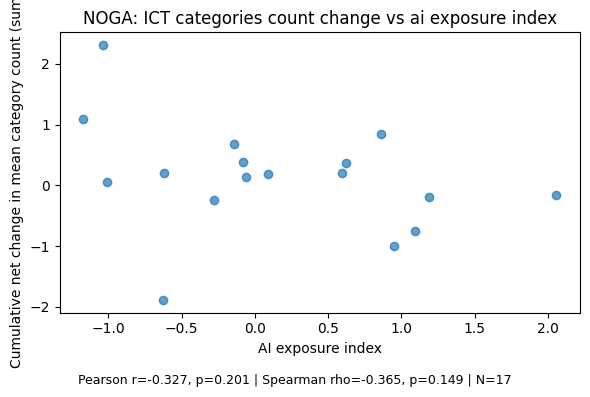

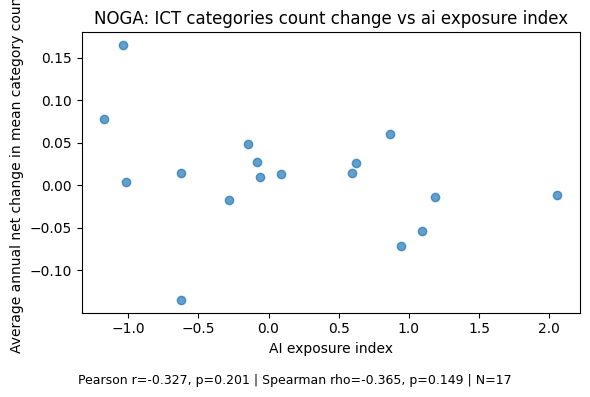

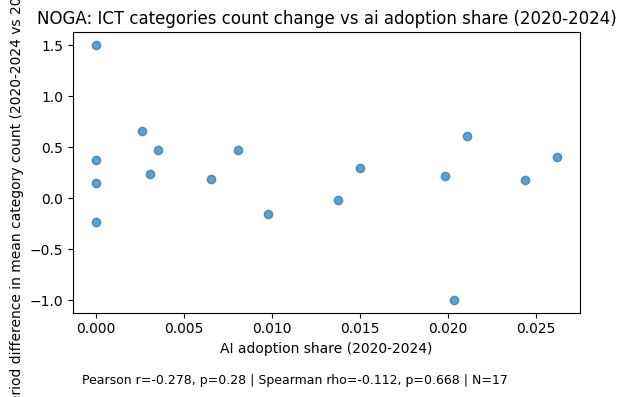

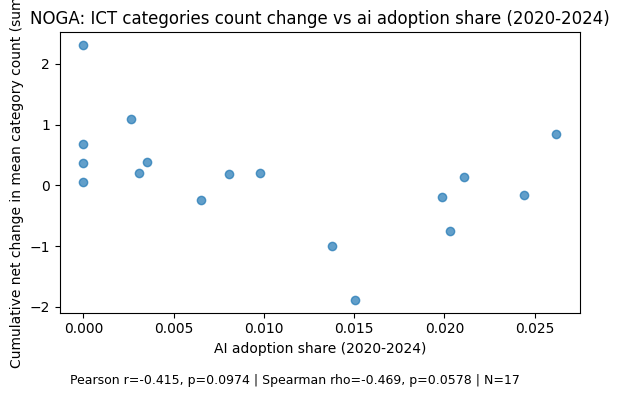

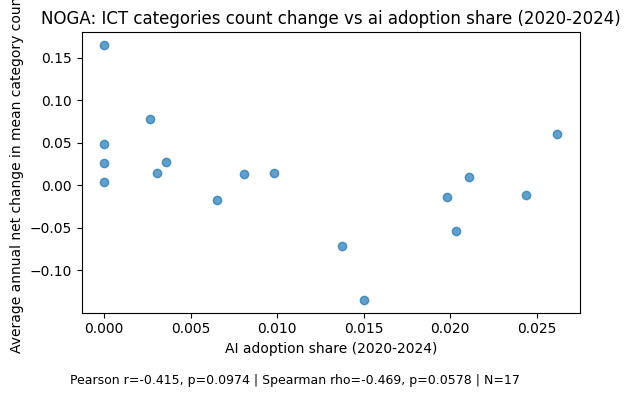

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/870649050.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g['cat_count'], g[WEIGHT]))


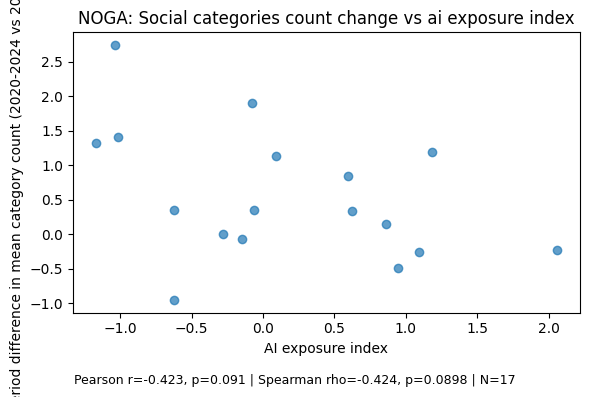

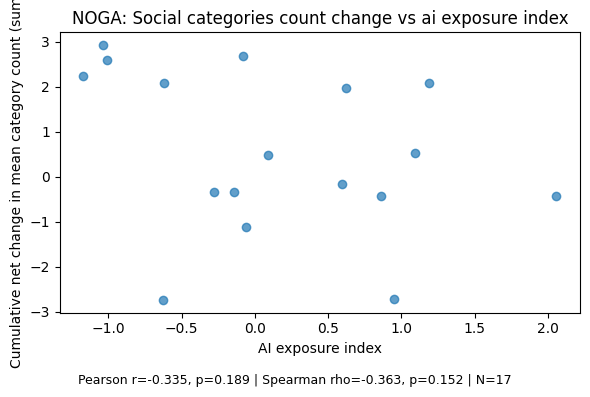

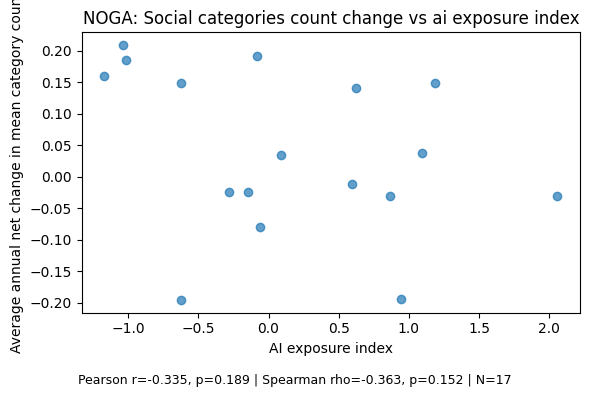

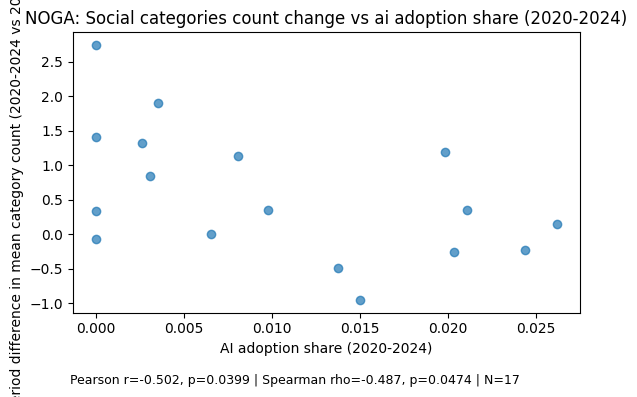

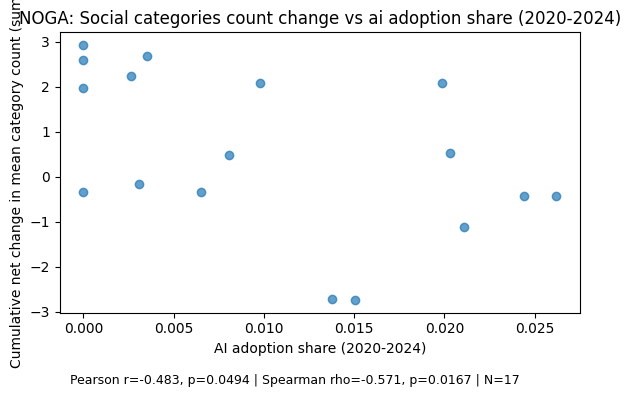

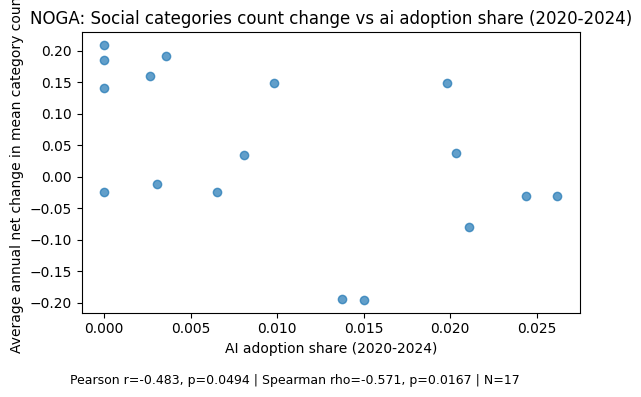

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/870649050.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g['cat_count'], g[WEIGHT]))


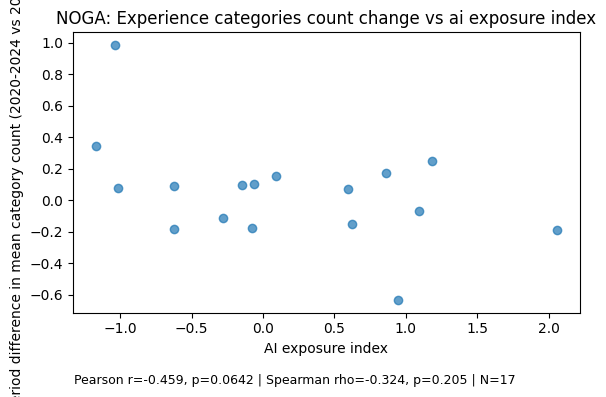

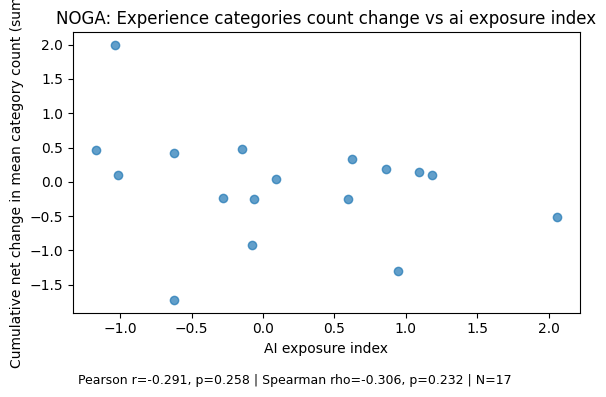

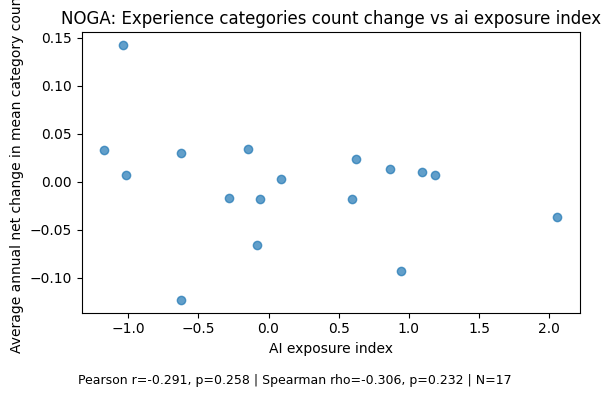

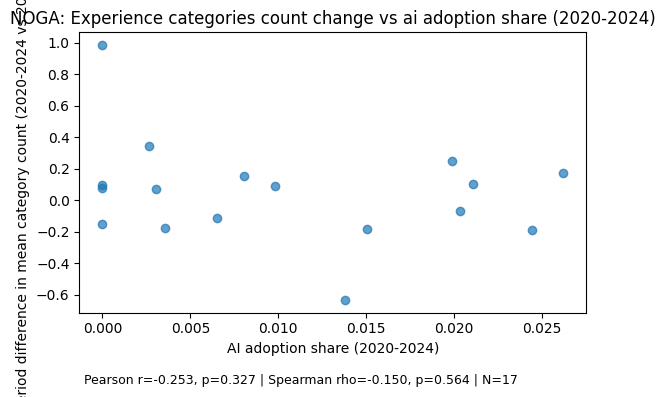

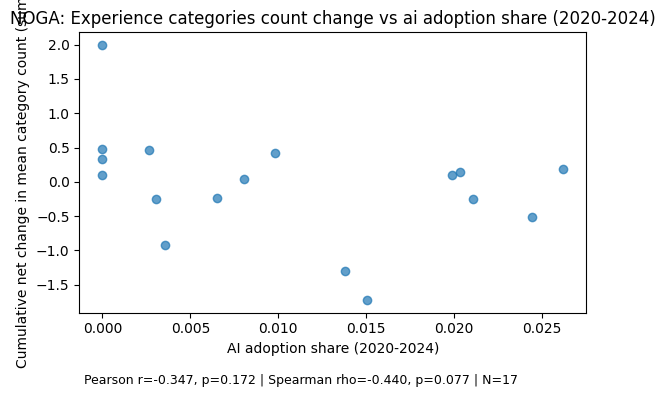

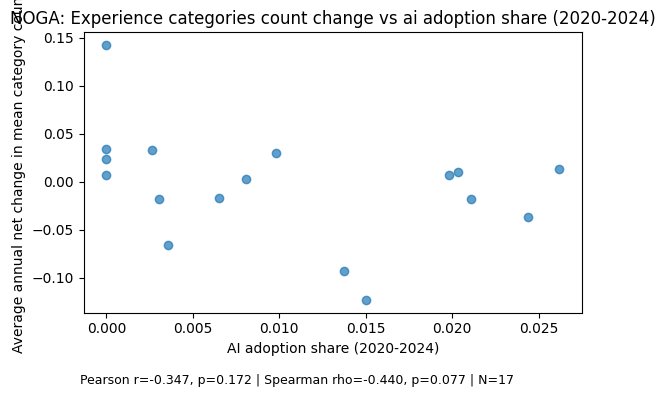

In [8]:
Y_METRICS = [
    ('period_diff', 'Period difference in mean category count (2020-2024 vs 2010-2014)'),
    ('cumulative_change', 'Cumulative net change in mean category count (sum Δ)'),
    ('average_change', 'Average annual net change in mean category count'),
]

FAMILIES = [
    {'tag': 'ict', 'label': 'ICT categories', 'mentions': ict_mentions},
    {'tag': 'soski', 'label': 'Social categories', 'mentions': soski_mentions},
    {'tag': 'exp', 'label': 'Experience categories', 'mentions': exp_mentions},
]

def _count_values_by_group_year(mentions_df, base_df, group_col):
    counts = mentions_df.groupby('adve_iden_adve')['category'].nunique().rename('cat_count')
    tmp = base_df[['adve_iden_adve', group_col, 'adve_time_year', WEIGHT]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    tmp = tmp.merge(counts, on='adve_iden_adve', how='left')
    tmp['cat_count'] = tmp['cat_count'].fillna(0)
    out = (
        tmp.groupby([group_col, 'adve_time_year'])
           .apply(lambda g: _weighted_mean(g['cat_count'], g[WEIGHT]))
           .rename('value')
           .reset_index()
           .rename(columns={group_col: 'group'})
    )
    return out

for cfg in GROUP_CONFIGS:
    gtag = cfg['group_tag']
    gcol = cfg['group_col']
    axes_df = GROUP_AXES[gtag]

    for fam in FAMILIES:
        value_df = _count_values_by_group_year(fam['mentions'], df_skill, gcol)
        metrics_df = _compute_change_metrics(value_df)
        plot_df = metrics_df.merge(axes_df, on='group', how='left')

        for x_tag, x_col, x_label in X_AXES:
            for y_tag, y_label in Y_METRICS:
                out_name = f"{gtag}__{fam['tag']}__count__x-{x_tag}__y-{y_tag}.png"
                out_path = OUT_PLOTS / out_name
                title = f"{cfg['label']}: {fam['label']} count change vs {x_label.lower()}"

                _scatter_with_corr_below(
                    plot_df, x_col, y_tag, title, x_label, y_label, out_path
                )


/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


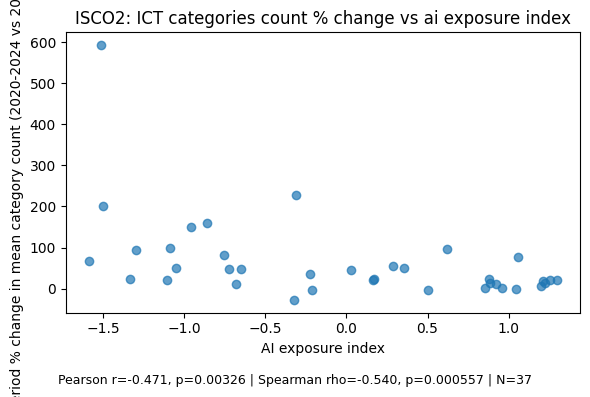

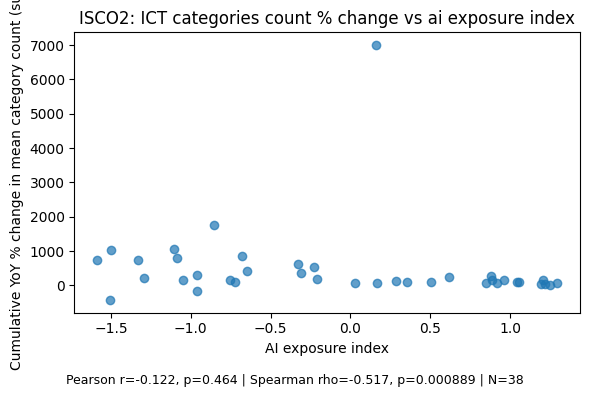

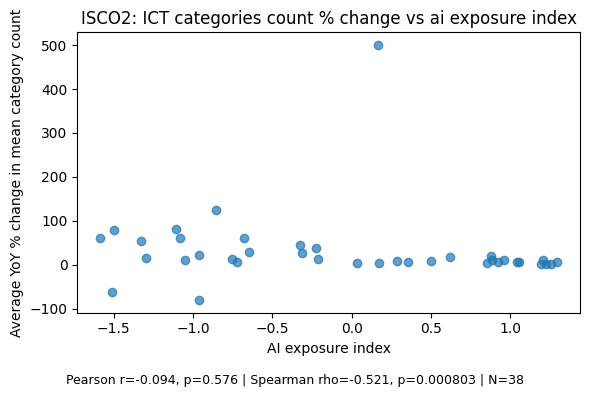

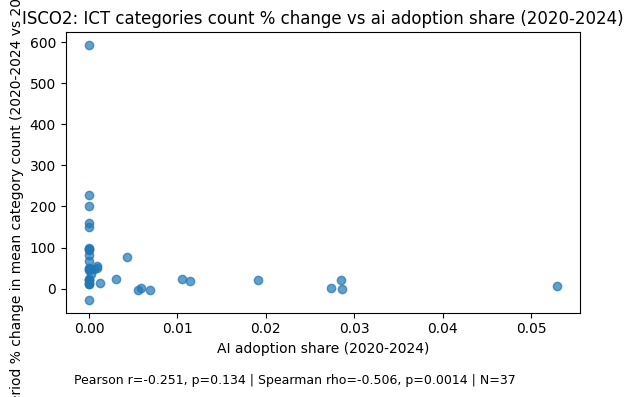

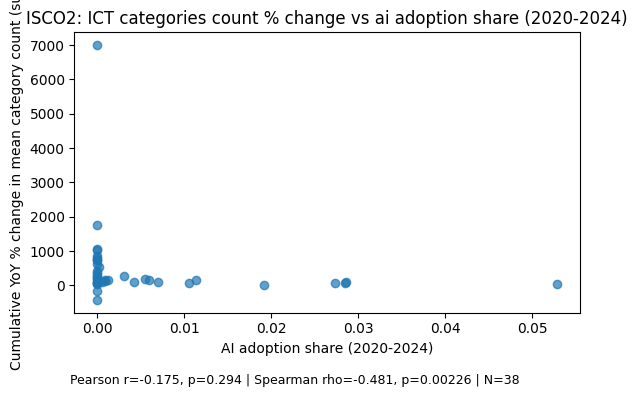

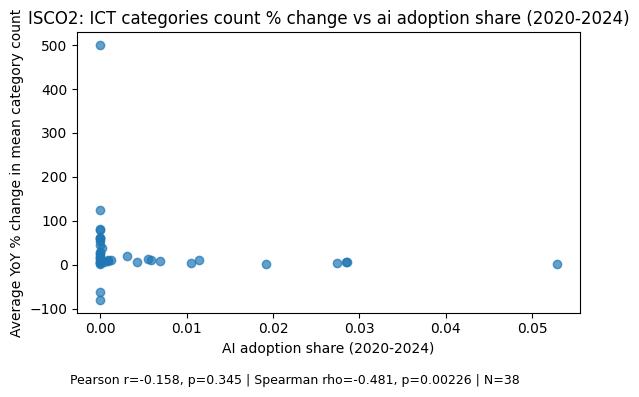

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


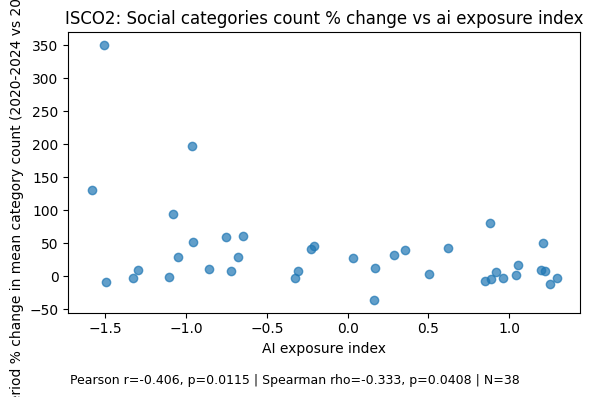

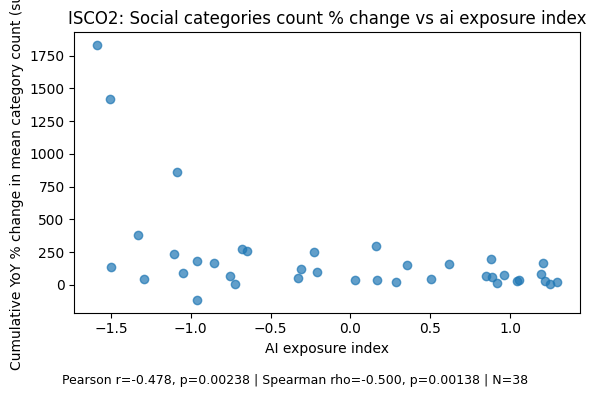

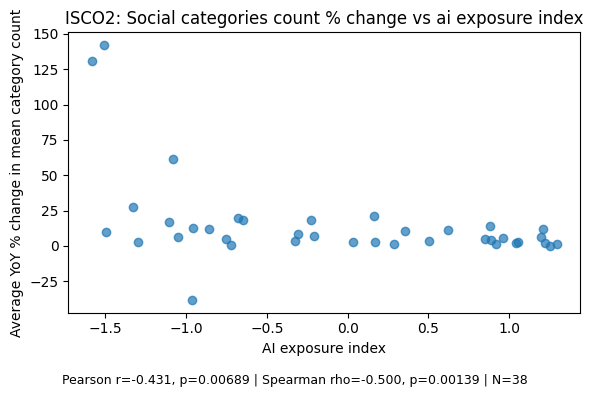

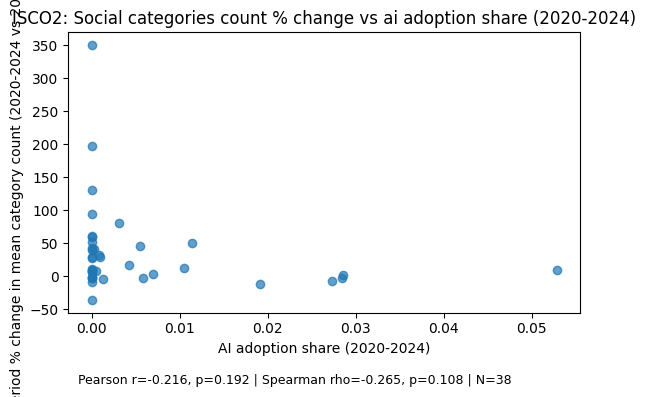

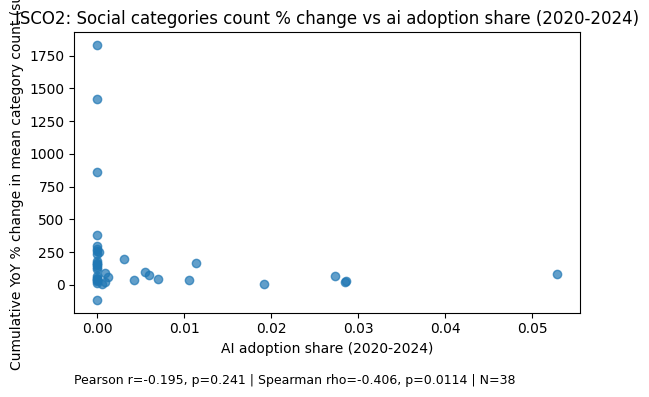

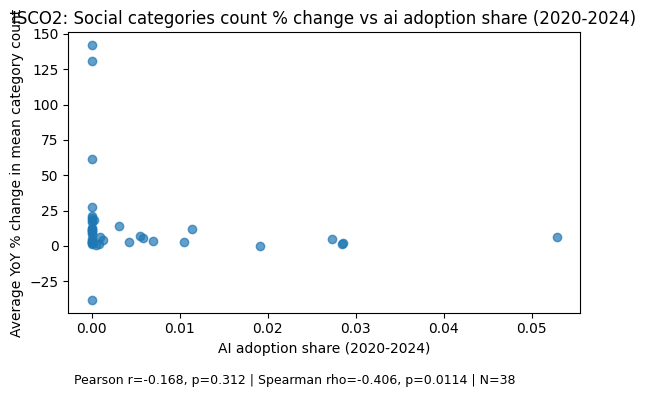

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


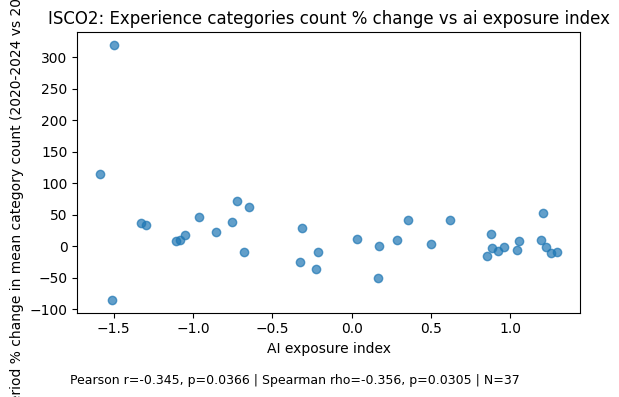

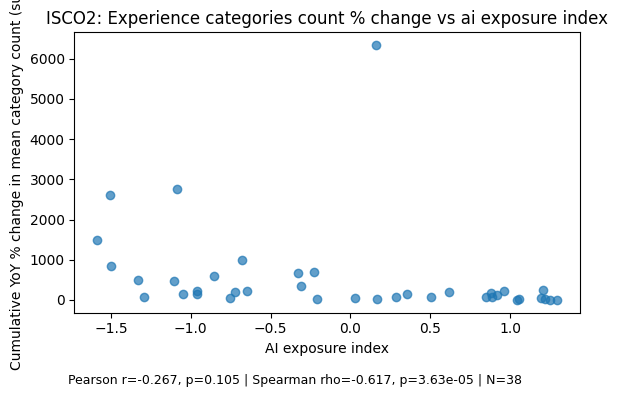

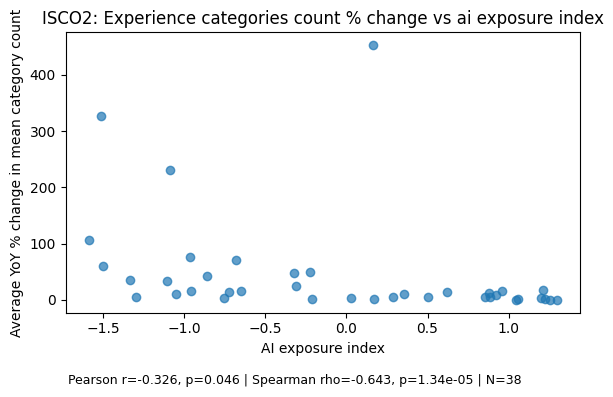

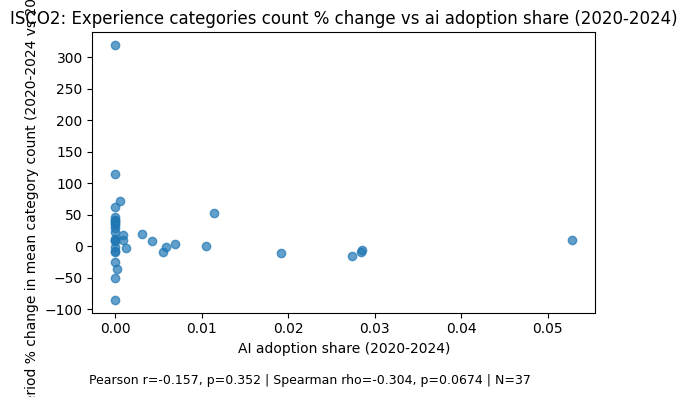

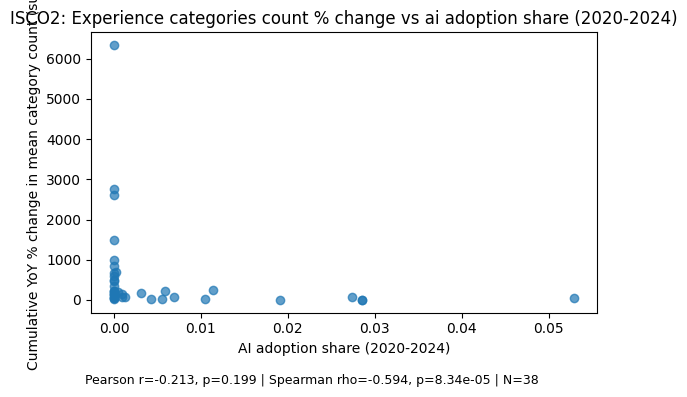

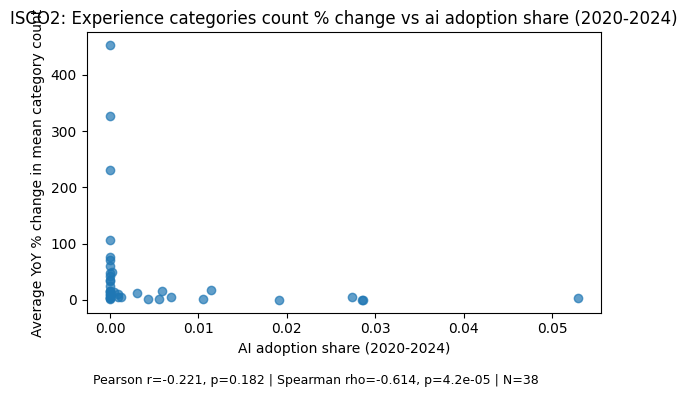

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


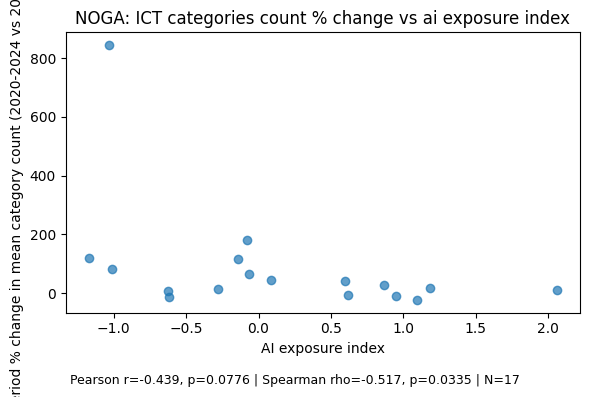

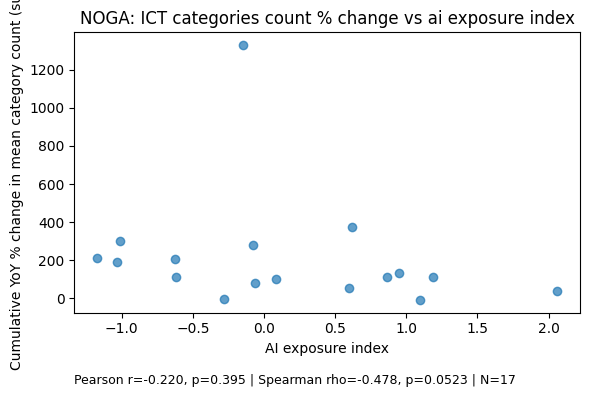

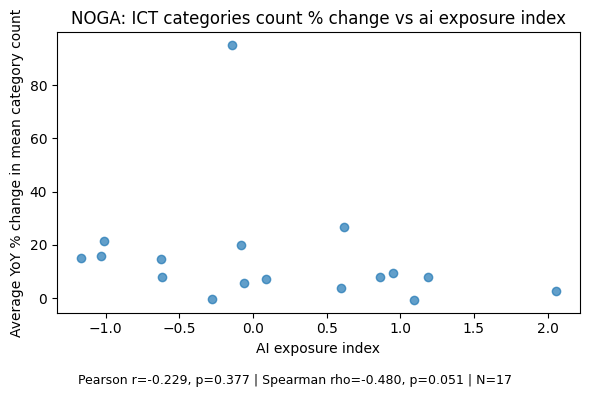

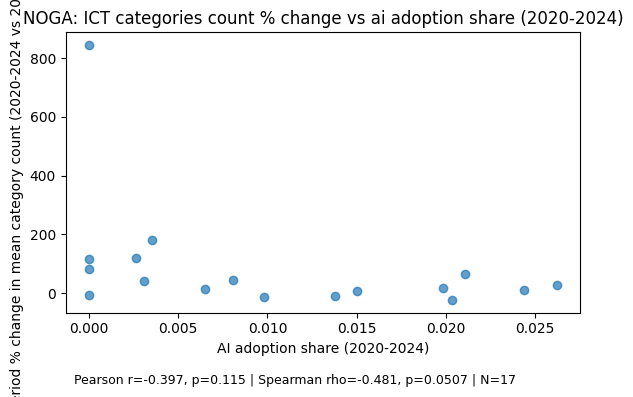

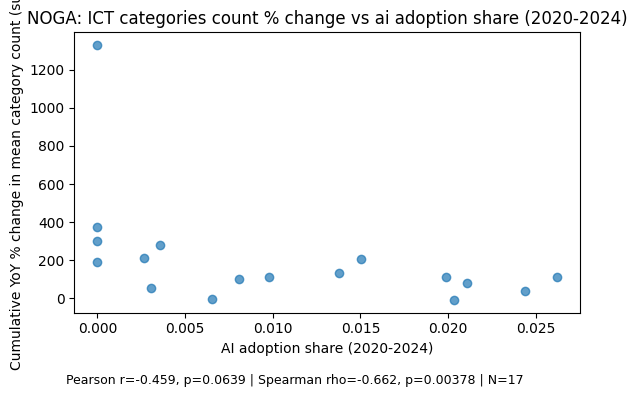

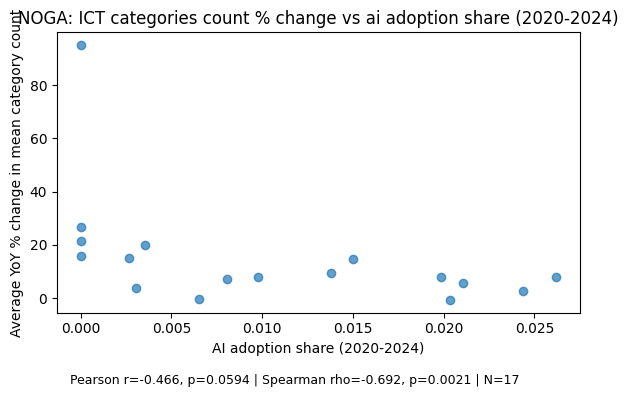

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


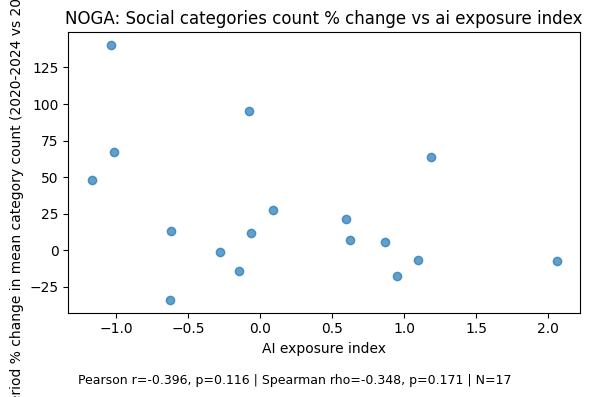

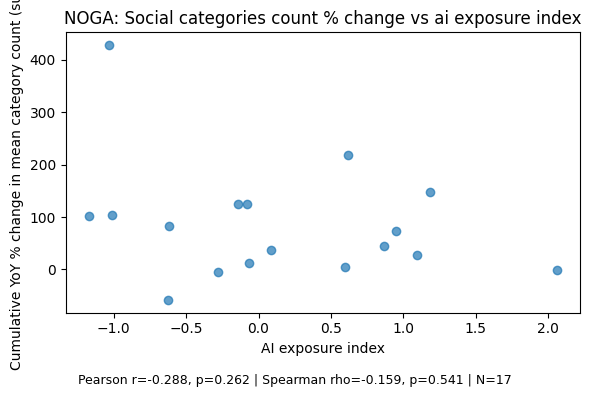

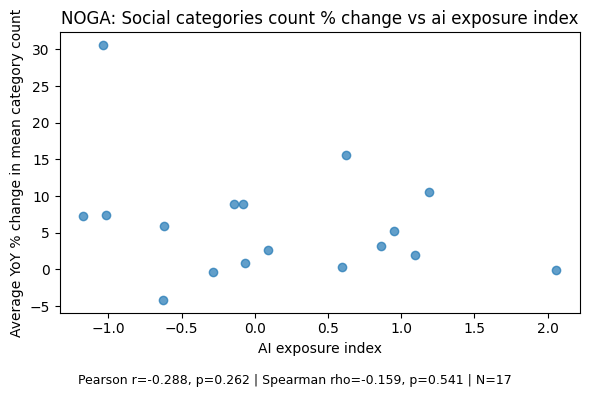

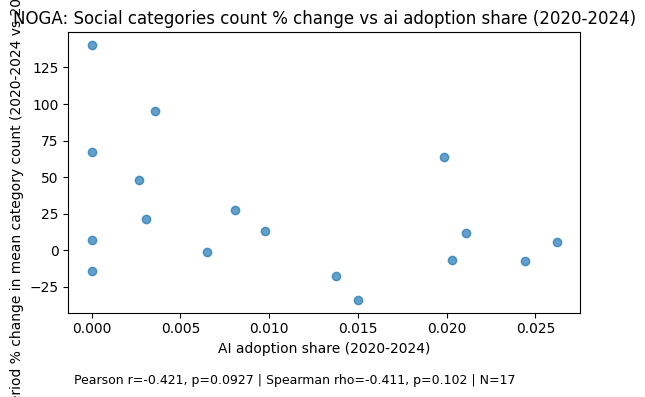

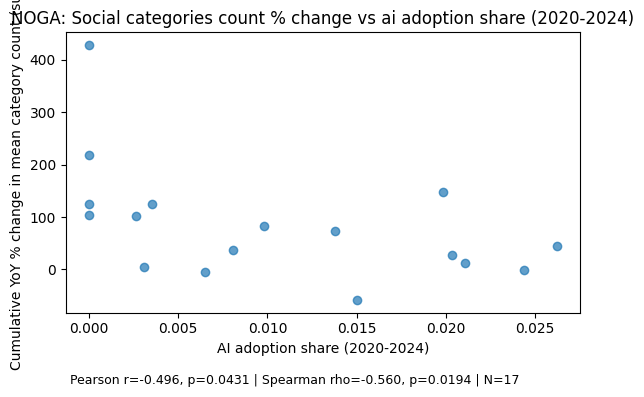

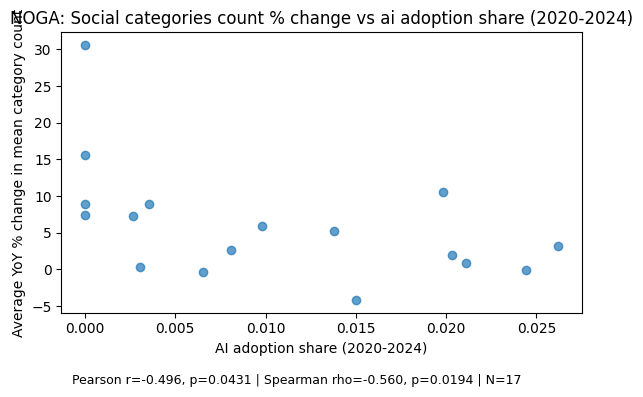

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


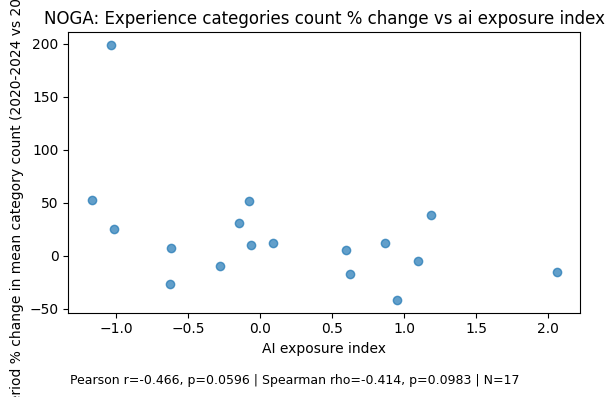

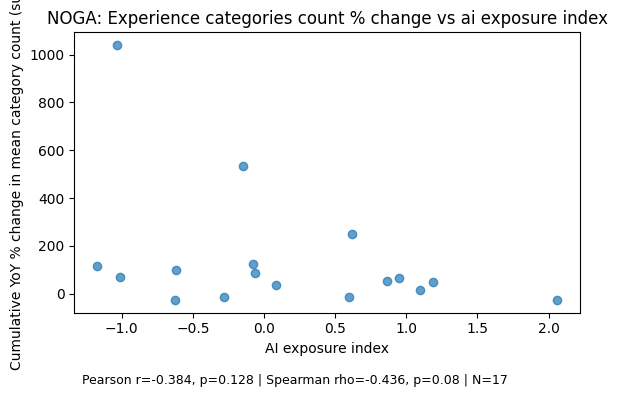

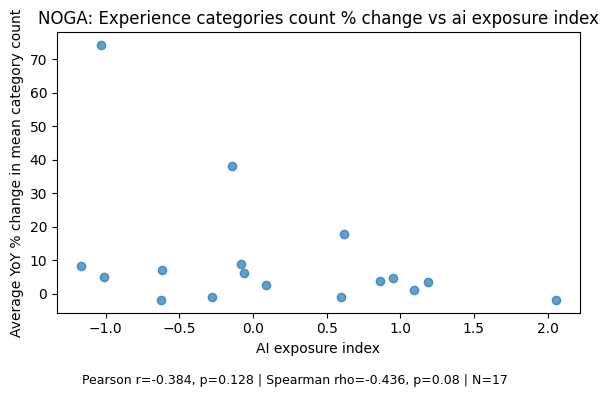

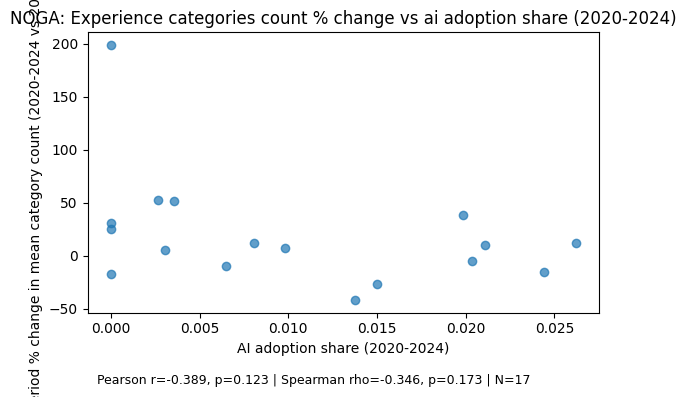

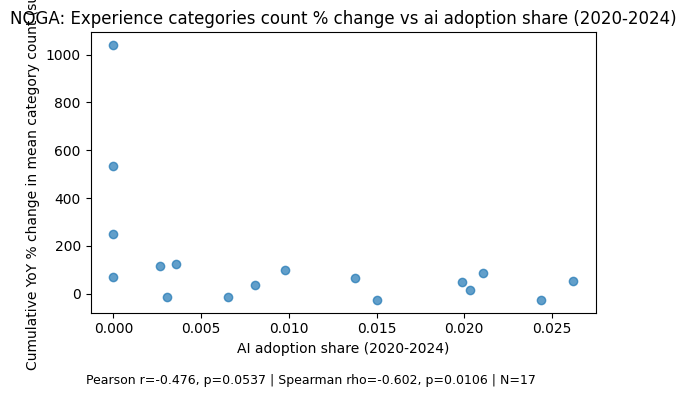

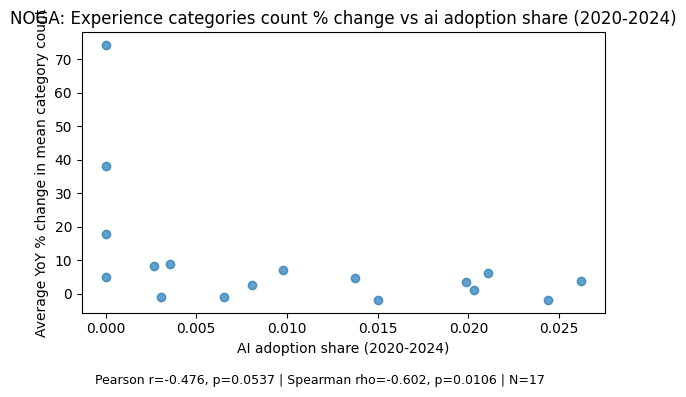

In [14]:
# --- Category count variant (relative % change)

def _count_values_by_group_year_with_weight(mentions_df, base_df, group_col):
    counts = mentions_df.groupby('adve_iden_adve')['category'].nunique().rename('cat_count')
    tmp = base_df[['adve_iden_adve', group_col, 'adve_time_year', WEIGHT]].dropna(subset=[group_col, 'adve_time_year'])
    tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
    tmp = tmp.merge(counts, on='adve_iden_adve', how='left')
    tmp['cat_count'] = tmp['cat_count'].fillna(0)
    out = (
        tmp.groupby([group_col, 'adve_time_year'])
           .apply(lambda g: pd.Series({
               'value': _weighted_mean(g['cat_count'], g[WEIGHT]),
               'total_weight': g[WEIGHT].sum(),
           }))
           .reset_index()
           .rename(columns={group_col: 'group'})
    )
    return out


def _compute_relative_change_metrics(value_df):
    if value_df.empty:
        return pd.DataFrame(columns=['group', 'period_pct_change', 'cumulative_pct_change', 'average_pct_change'])

    rows = []
    for grp, g in value_df.groupby('group'):
        g = g.dropna(subset=['value', 'total_weight'])
        if g.empty:
            rows.append({'group': grp, 'period_pct_change': np.nan, 'cumulative_pct_change': np.nan, 'average_pct_change': np.nan})
            continue

        g = g.sort_values('adve_time_year')
        g['prev_year'] = g['adve_time_year'].shift(1)
        g['prev'] = g['value'].shift(1)
        g['yoy_pct'] = np.where(
            (g['adve_time_year'] == (g['prev_year'] + 1)) & (g['prev'] > 0),
            g['value'] / g['prev'] - 1,
            np.nan,
        )

        valid_yoy = g['yoy_pct'].dropna()
        cumulative = float(valid_yoy.sum()) if len(valid_yoy) else np.nan
        average = float(valid_yoy.mean()) if len(valid_yoy) else np.nan

        g = g.copy()
        g['period'] = g['adve_time_year'].map(_period_label)
        early = g[g['period'] == EARLY_LABEL]
        late = g[g['period'] == LATE_LABEL]

        period_pct = np.nan
        if len(early) and len(late):
            early_mean = np.average(early['value'], weights=early['total_weight'])
            late_mean = np.average(late['value'], weights=late['total_weight'])
            if early_mean > 0:
                period_pct = late_mean / early_mean - 1

        rows.append({
            'group': grp,
            'period_pct_change': period_pct,
            'cumulative_pct_change': cumulative,
            'average_pct_change': average,
        })

    out = pd.DataFrame(rows)
    for col in ['period_pct_change', 'cumulative_pct_change', 'average_pct_change']:
        out[col] = out[col] * 100
    return out


Y_METRICS_COUNT_REL = [
    ('period_pct_change', 'Period % change in mean category count (2020-2024 vs 2010-2014)'),
    ('cumulative_pct_change', 'Cumulative YoY % change in mean category count (sum)'),
    ('average_pct_change', 'Average YoY % change in mean category count'),
]

for cfg in GROUP_CONFIGS:
    gtag = cfg['group_tag']
    gcol = cfg['group_col']
    axes_df = GROUP_AXES[gtag]

    for fam in FAMILIES:
        value_df = _count_values_by_group_year_with_weight(fam['mentions'], df_skill, gcol)
        metrics_df = _compute_relative_change_metrics(value_df)
        plot_df = metrics_df.merge(axes_df, on='group', how='left')

        for x_tag, x_col, x_label in X_AXES:
            for y_tag, y_label in Y_METRICS_COUNT_REL:
                out_name = f"{gtag}__{fam['tag']}__count__rel_pct__x-{x_tag}__y-{y_tag}.png"
                out_path = OUT_PLOTS / out_name
                title = f"{cfg['label']}: {fam['label']} count % change vs {x_label.lower()}"

                _scatter_with_corr_below(
                    plot_df, x_col, y_tag, title, x_label, y_label, out_path
                )


# Category Fields - PREVALENCE-SHIFT Variant - Generate Plots

Prevalence f(g,y,c) is the weighted share of postings mentioning category c.
Shift is the sum of absolute differences across categories.


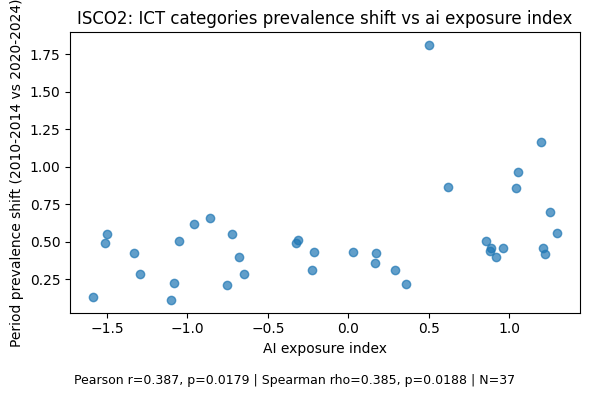

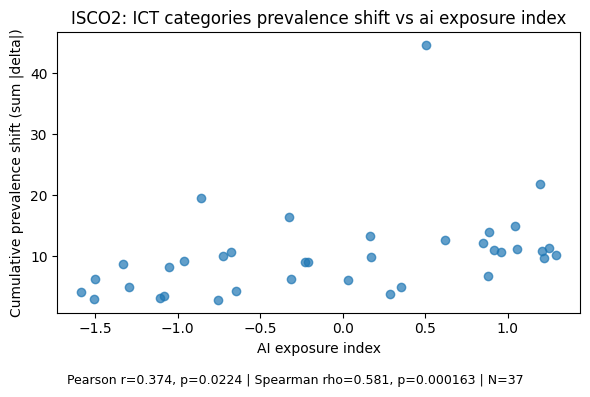

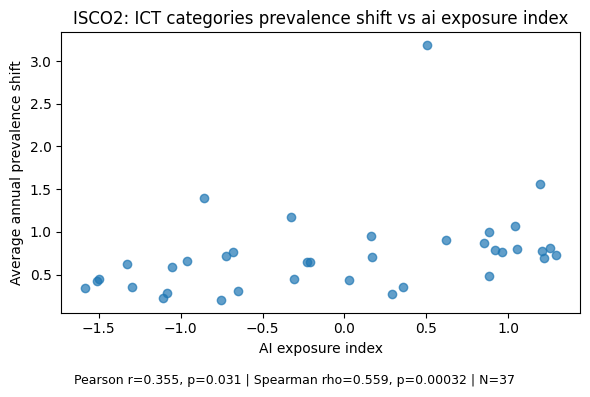

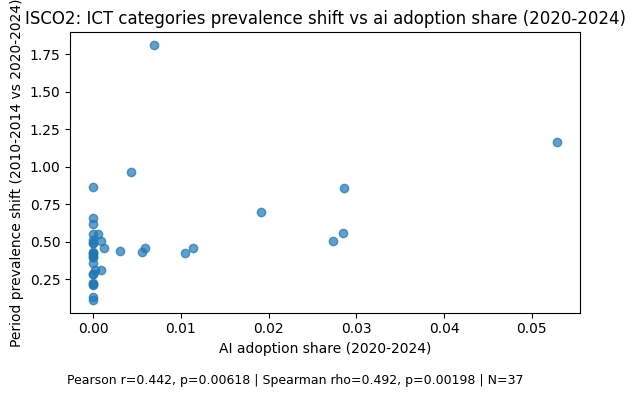

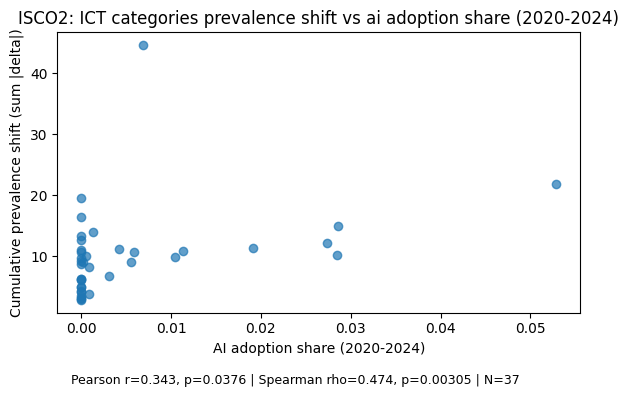

...

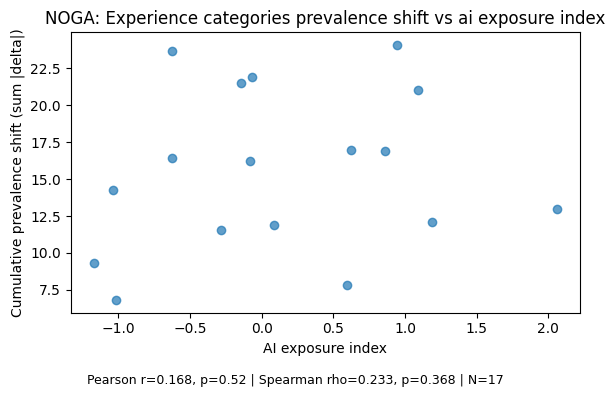

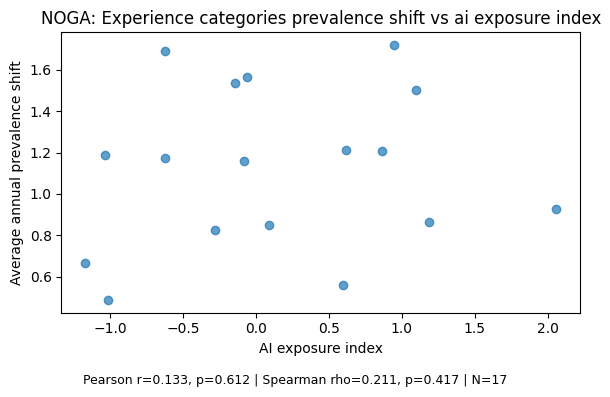

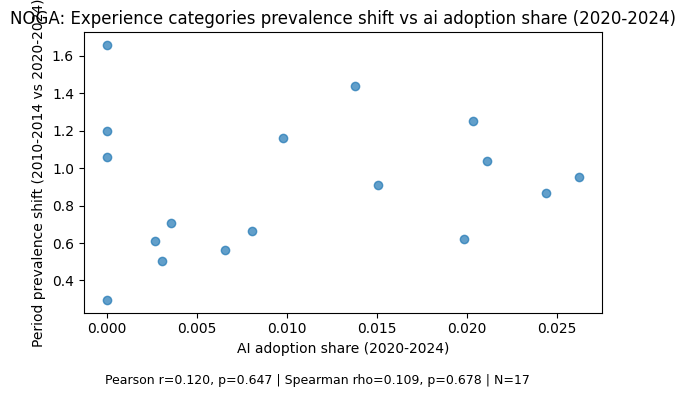

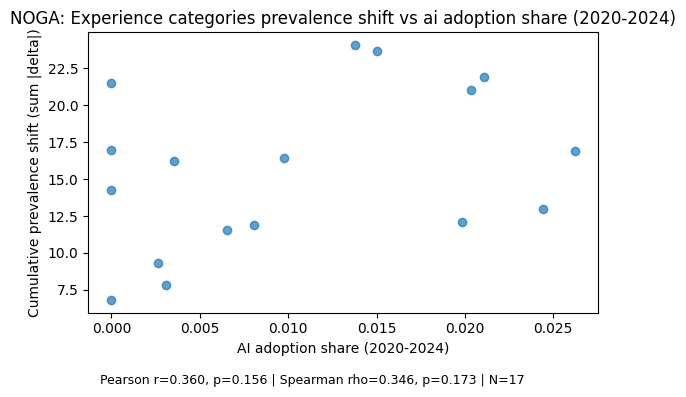

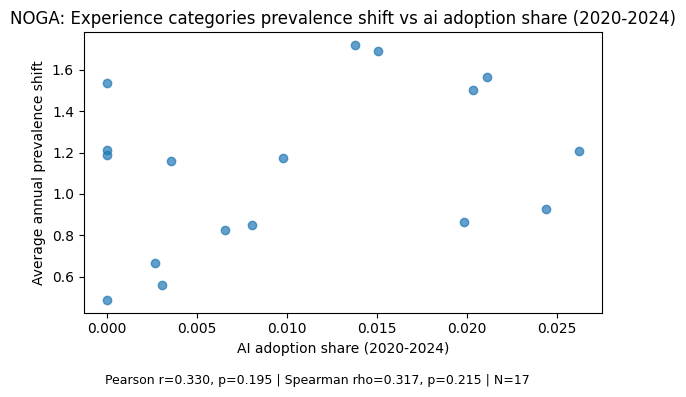

In [11]:
PREV_Y_METRICS = [
    ('period_shift', 'Period prevalence shift (2010-2014 vs 2020-2024)'),
    ('cumulative_shift', 'Cumulative prevalence shift (sum |delta|)'),
    ('average_shift', 'Average annual prevalence shift'),
]

def _threshold_for_group_tag(tag):
    return THRESH_ISCO2 if tag == 'isco2' else THRESH_NOGA

for cfg in GROUP_CONFIGS:
    gtag = cfg['group_tag']
    gcol = cfg['group_col']
    axes_df = GROUP_AXES[gtag]
    threshold = _threshold_for_group_tag(gtag)

    for fam in FAMILIES:
        prevalence_df, mention_weight_df, total_weight_df = _build_prevalence_tables(fam['mentions'], df_skill, gcol)
        if prevalence_df.empty:
            continue

        metrics_df = _prevalence_shift_metrics(prevalence_df, mention_weight_df, total_weight_df, gcol, min_total_weight=threshold, require_consecutive_years=True)
        plot_df = metrics_df.merge(axes_df, on='group', how='left')

        for x_tag, x_col, x_label in X_AXES:
            for y_tag, y_label in PREV_Y_METRICS:
                out_name = f"{gtag}__{fam['tag']}__prevalence_shift__x-{x_tag}__y-{y_tag}.png"
                out_path = OUT_PLOTS / out_name
                title = f"{cfg['label']}: {fam['label']} prevalence shift vs {x_label.lower()}"

                _scatter_with_corr_below(
                    plot_df, x_col, y_tag, title, x_label, y_label, out_path
                )


/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


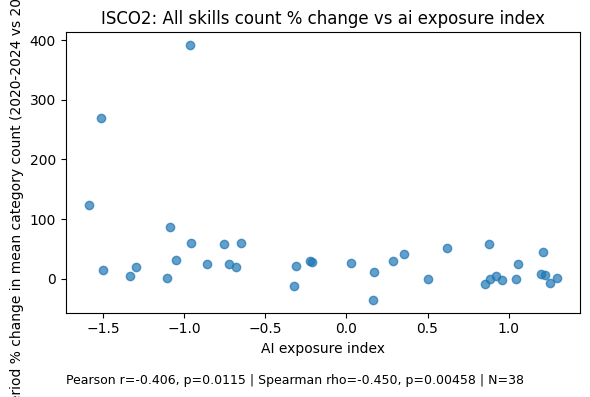

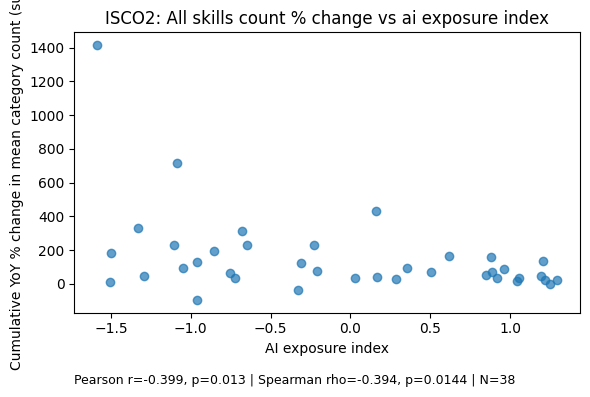

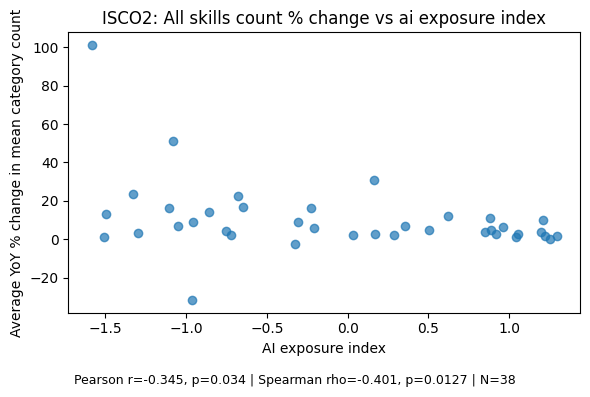

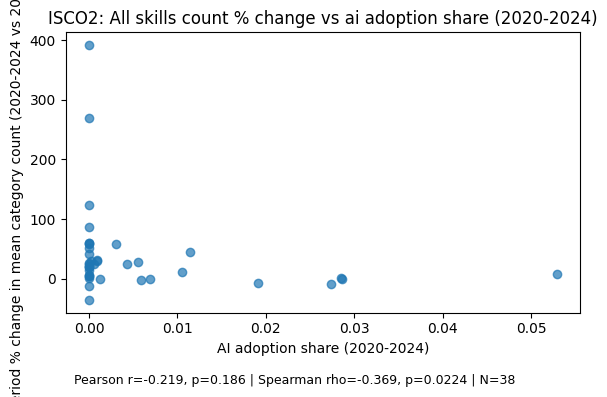

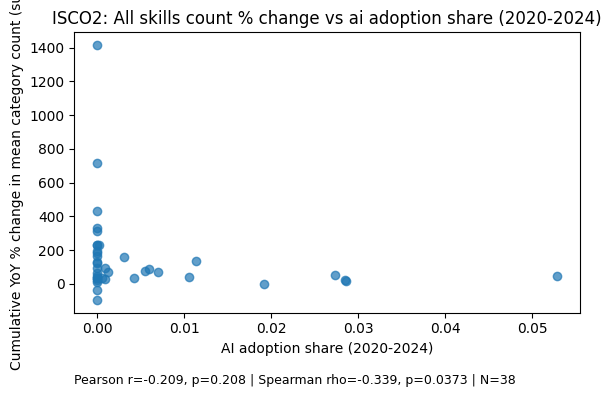

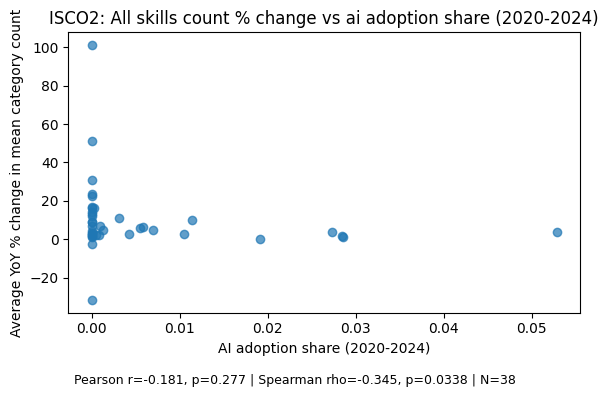

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


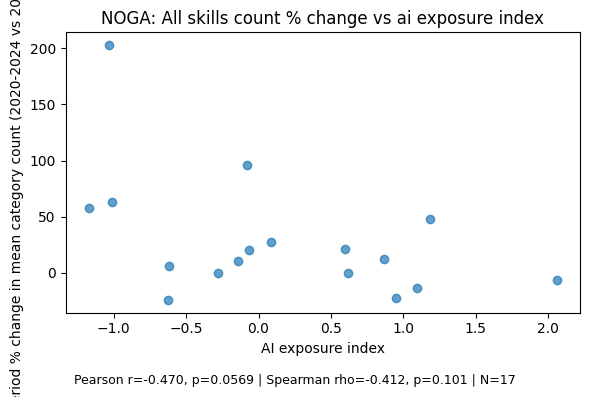

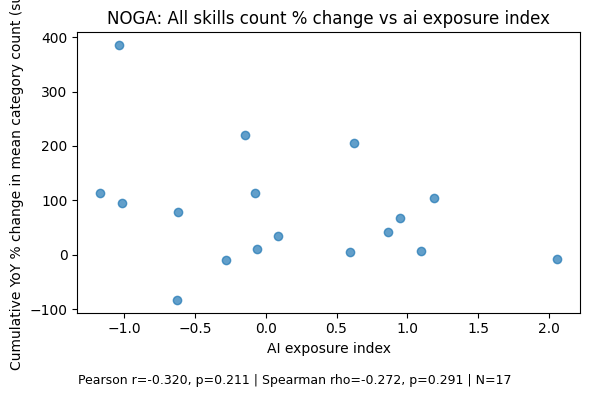

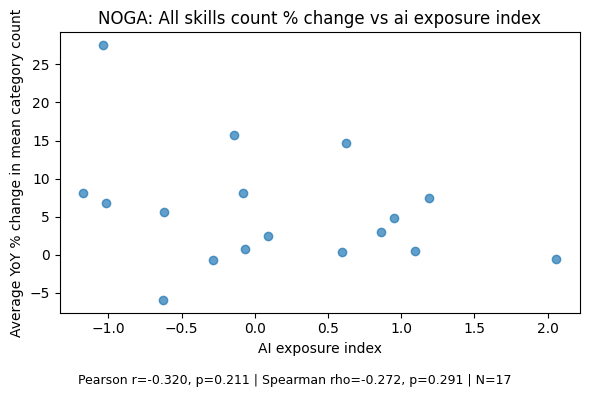

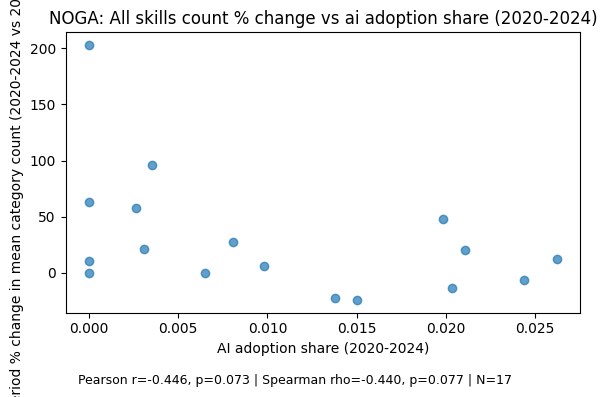

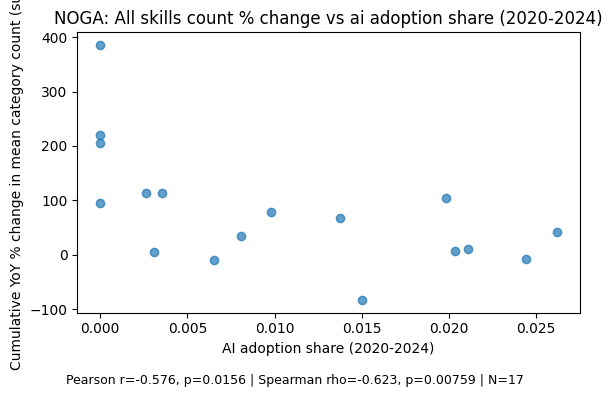

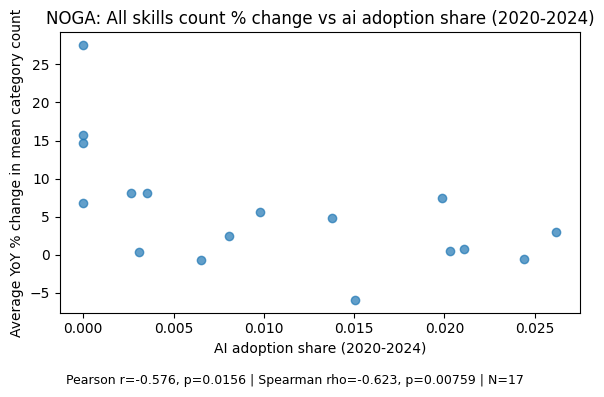

In [15]:
# --- All skills combined: count variant (relative % change)

all_mentions = pd.concat([soski_mentions, ict_mentions, exp_mentions], ignore_index=True)
all_mentions = all_mentions.drop_duplicates(subset=['adve_iden_adve', 'category'])

for cfg in GROUP_CONFIGS:
    gtag = cfg['group_tag']
    gcol = cfg['group_col']
    axes_df = GROUP_AXES[gtag]

    value_df = _count_values_by_group_year_with_weight(all_mentions, df_skill, gcol)
    metrics_df = _compute_relative_change_metrics(value_df)
    plot_df = metrics_df.merge(axes_df, on='group', how='left')

    for x_tag, x_col, x_label in X_AXES:
        for y_tag, y_label in Y_METRICS_COUNT_REL:
            out_name = f"{gtag}__allskills__count__rel_pct__x-{x_tag}__y-{y_tag}.png"
            out_path = OUT_PLOTS / out_name
            title = f"{cfg['label']}: All skills count % change vs {x_label.lower()}"

            _scatter_with_corr_below(
                plot_df, x_col, y_tag, title, x_label, y_label, out_path
            )


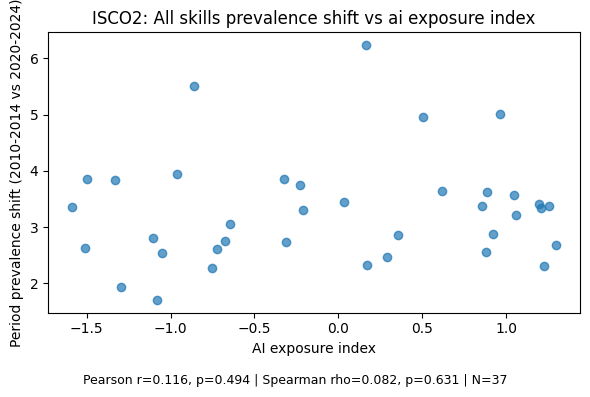

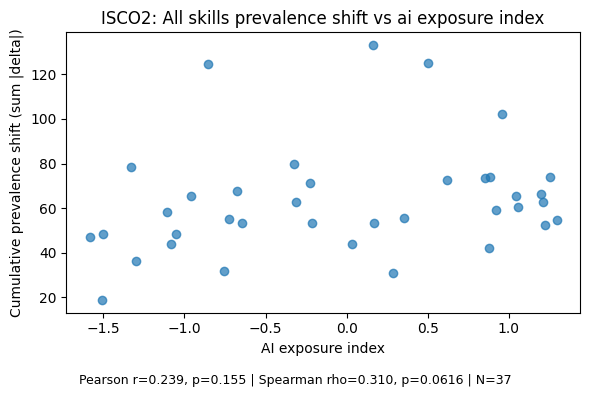

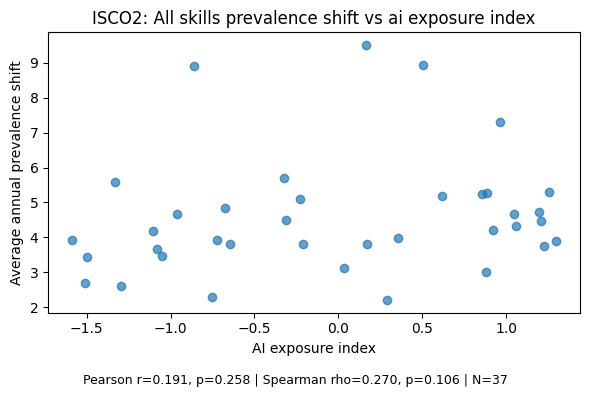

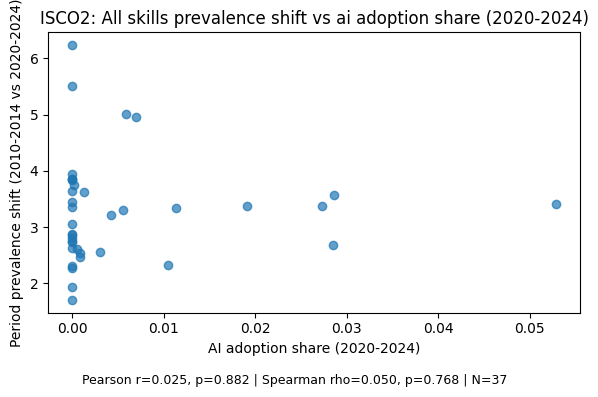

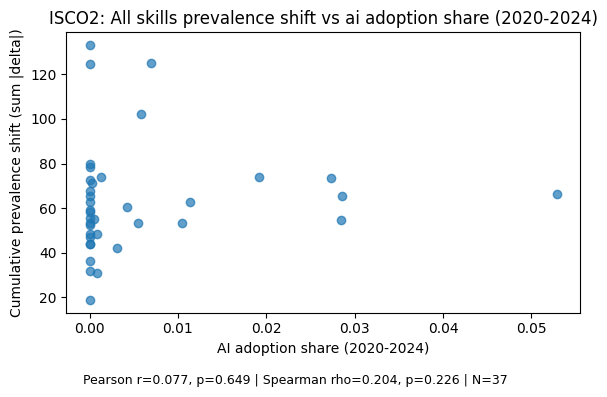

...

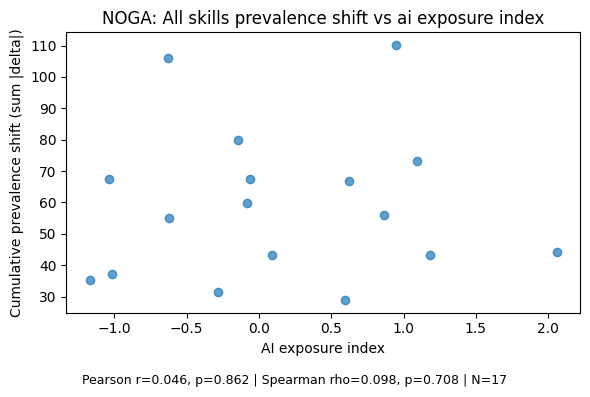

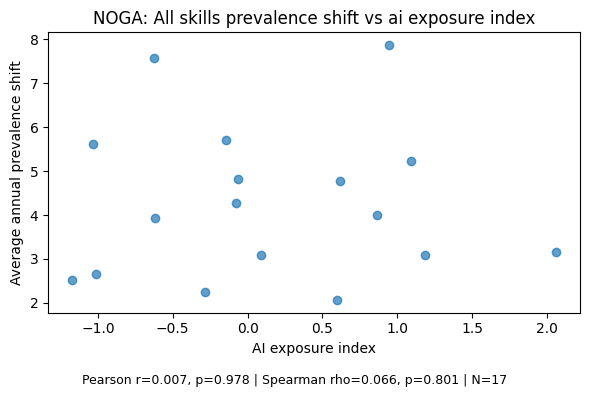

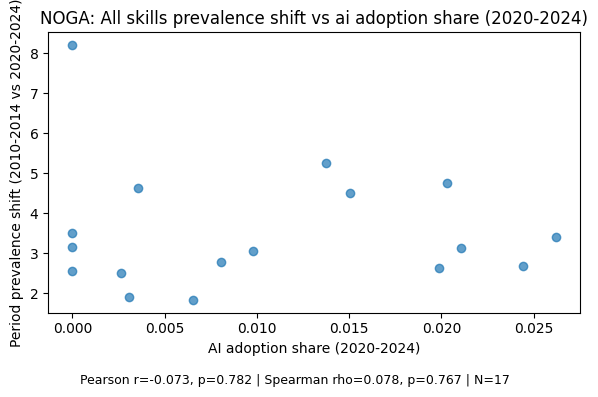

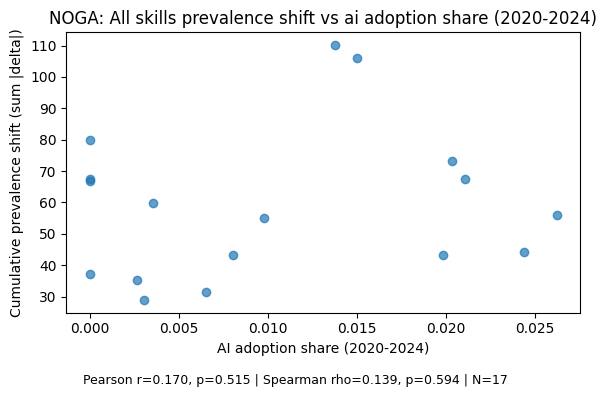

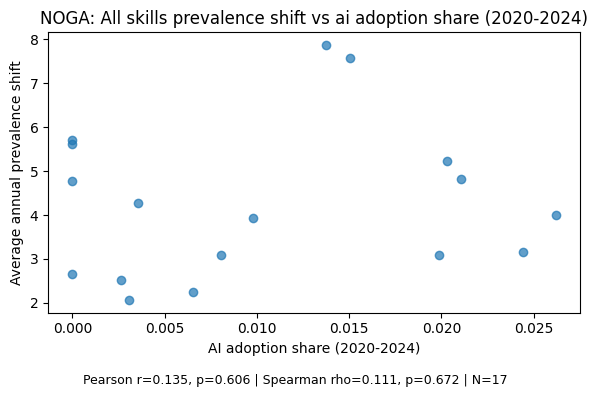

In [13]:
# --- All skills combined: prevalence shift

all_mentions = pd.concat([soski_mentions, ict_mentions, exp_mentions], ignore_index=True)
all_mentions = all_mentions.drop_duplicates(subset=['adve_iden_adve', 'category'])

for cfg in GROUP_CONFIGS:
    gtag = cfg['group_tag']
    gcol = cfg['group_col']
    axes_df = GROUP_AXES[gtag]
    threshold = _threshold_for_group_tag(gtag)

    prevalence_df, mention_weight_df, total_weight_df = _build_prevalence_tables(all_mentions, df_skill, gcol)
    if prevalence_df.empty:
        continue

    metrics_df = _prevalence_shift_metrics(
        prevalence_df,
        mention_weight_df,
        total_weight_df,
        gcol,
        min_total_weight=threshold,
        require_consecutive_years=True,
    )
    plot_df = metrics_df.merge(axes_df, on='group', how='left')

    for x_tag, x_col, x_label in X_AXES:
        for y_tag, y_label in PREV_Y_METRICS:
            out_name = f"{gtag}__allskills__prevalence_shift__x-{x_tag}__y-{y_tag}.png"
            out_path = OUT_PLOTS / out_name
            title = f"{cfg['label']}: All skills prevalence shift vs {x_label.lower()}"

            _scatter_with_corr_below(
                plot_df, x_col, y_tag, title, x_label, y_label, out_path
            )


# Run Everything

There is no single run-all cell. Run each section cell independently as needed.


/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))


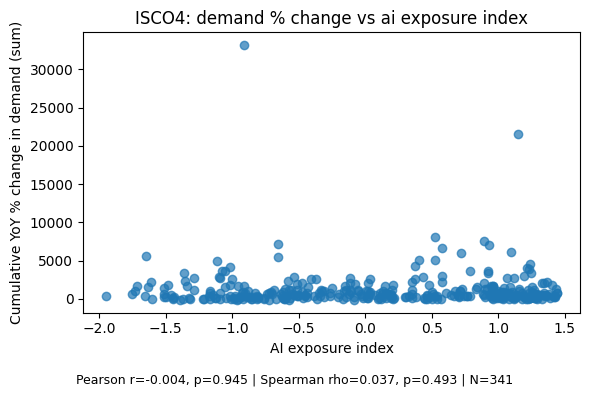

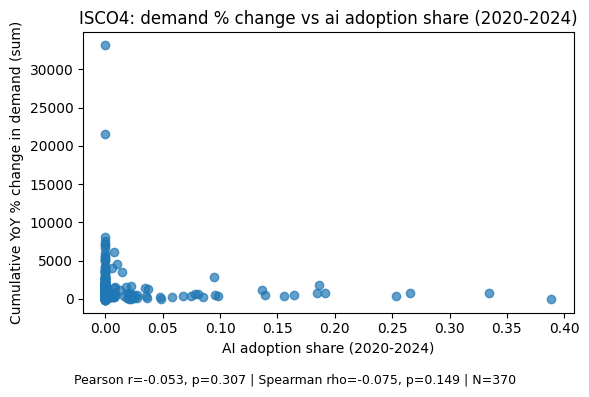

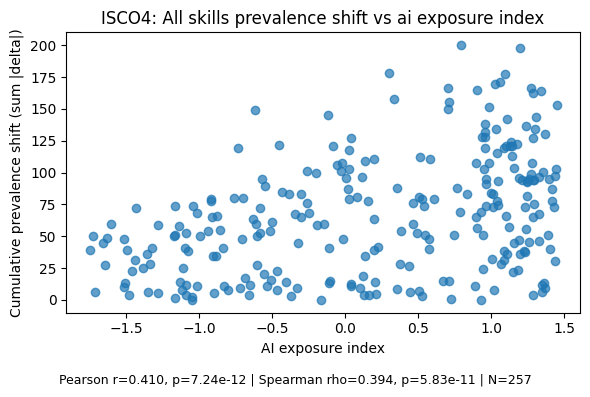

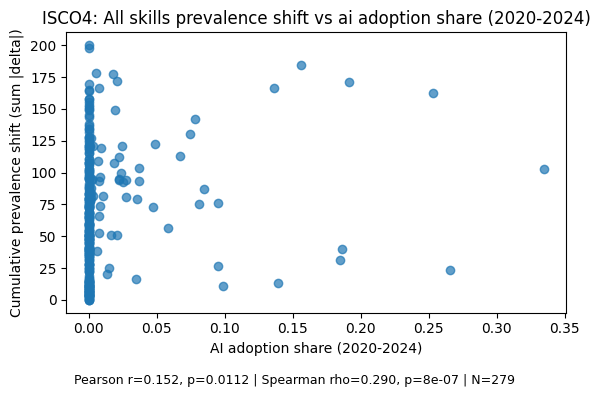

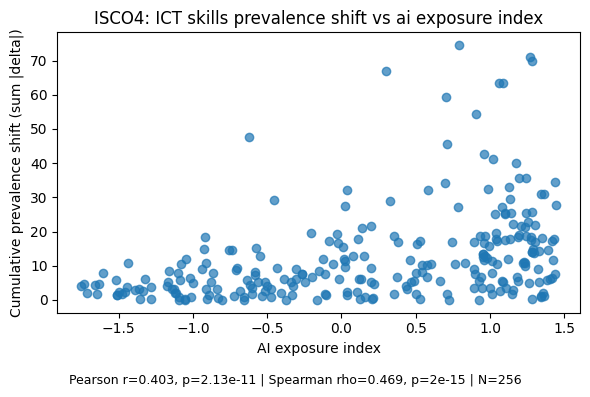

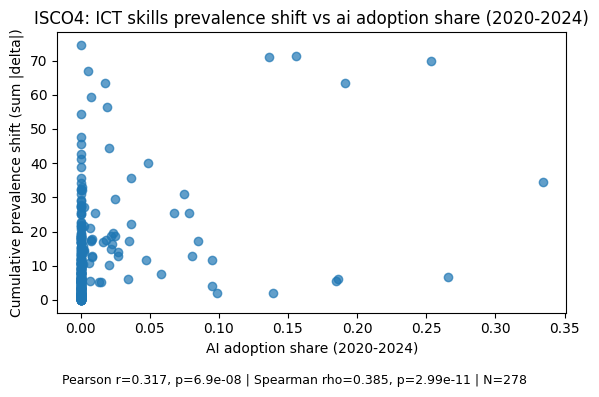

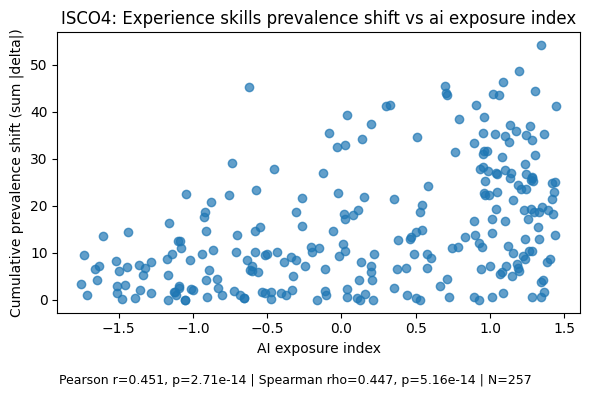

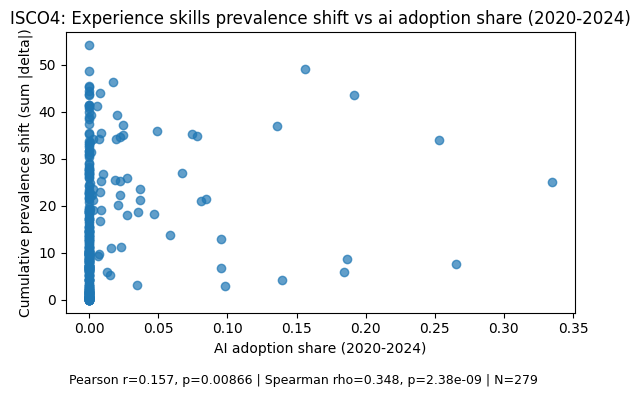

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


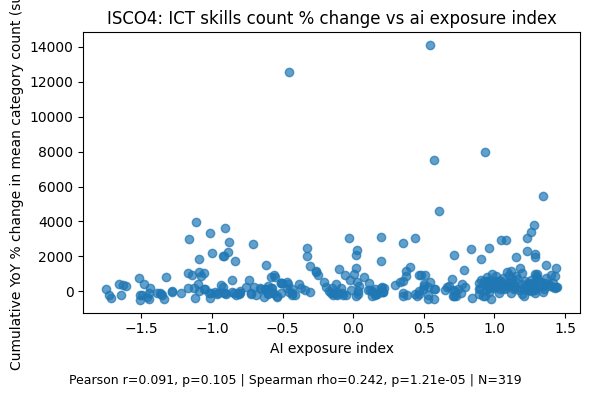

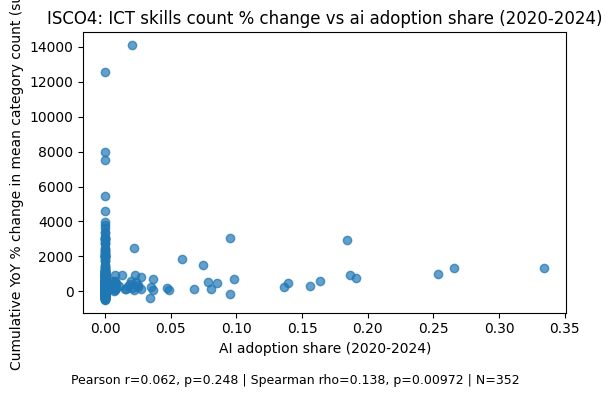

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


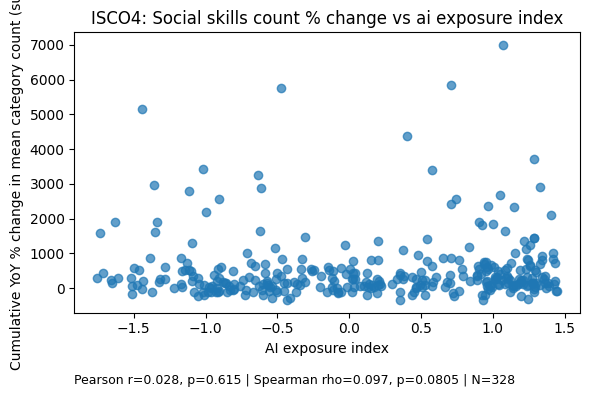

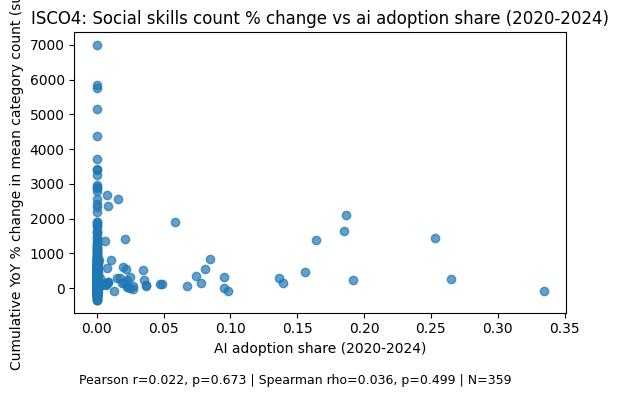

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))


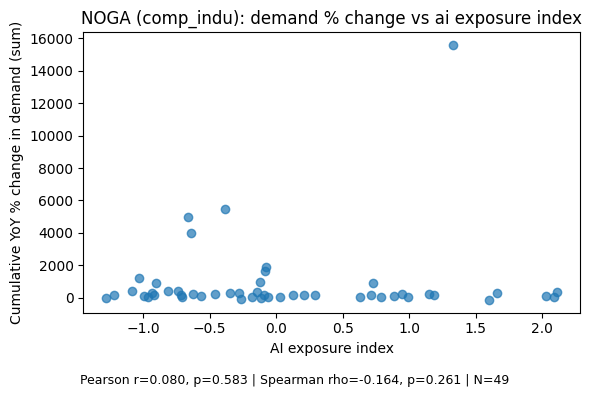

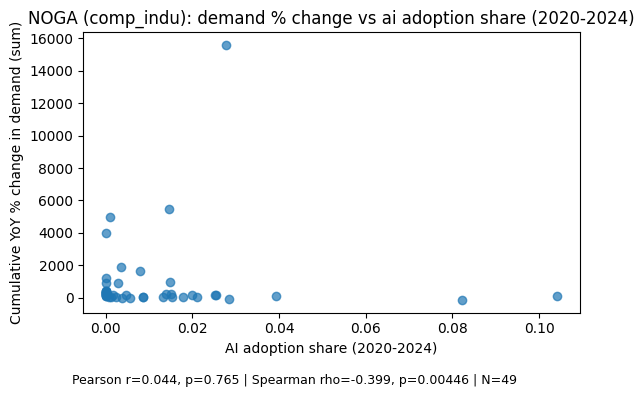

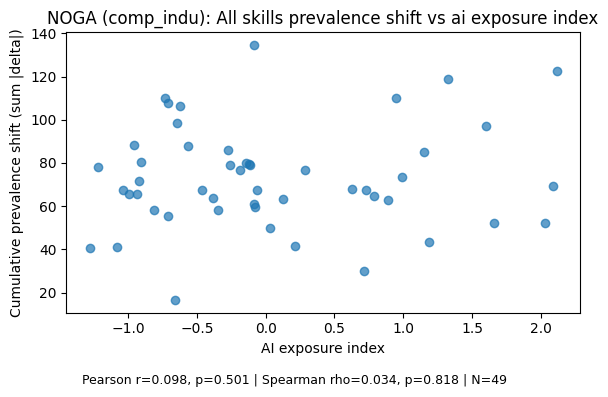

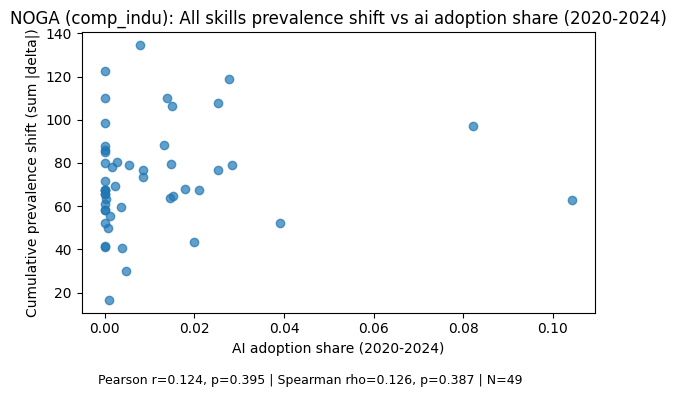

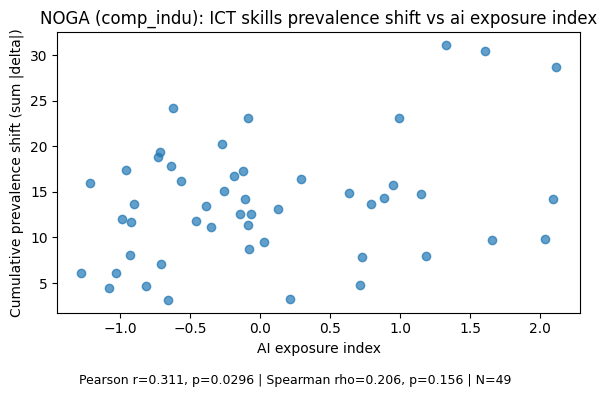

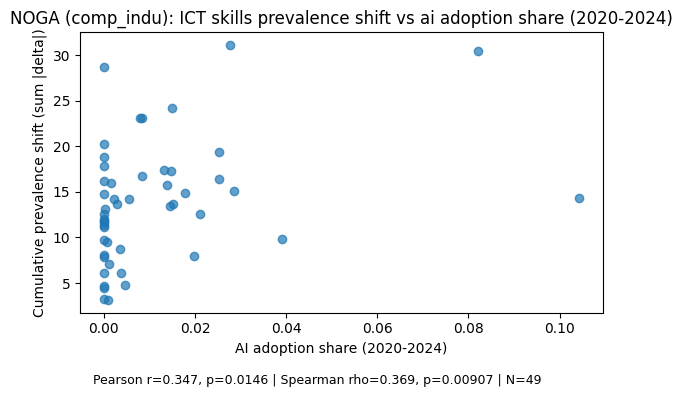

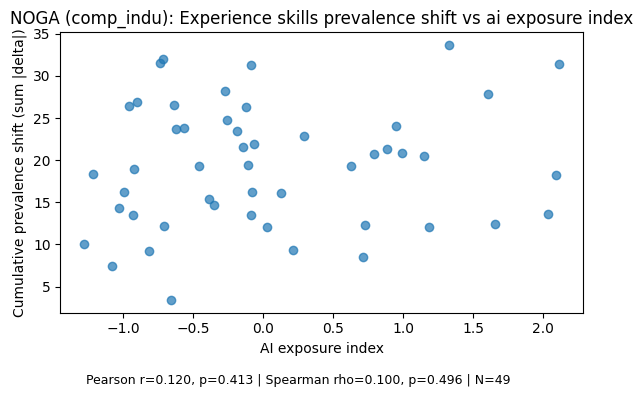

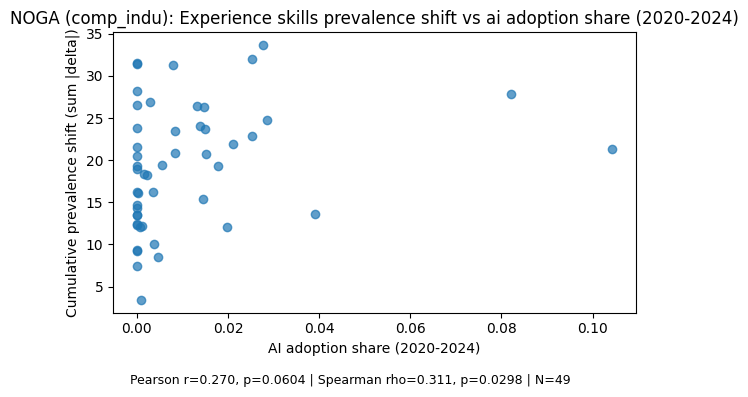

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


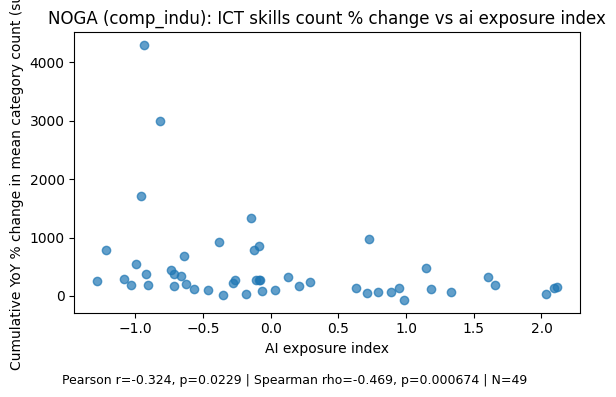

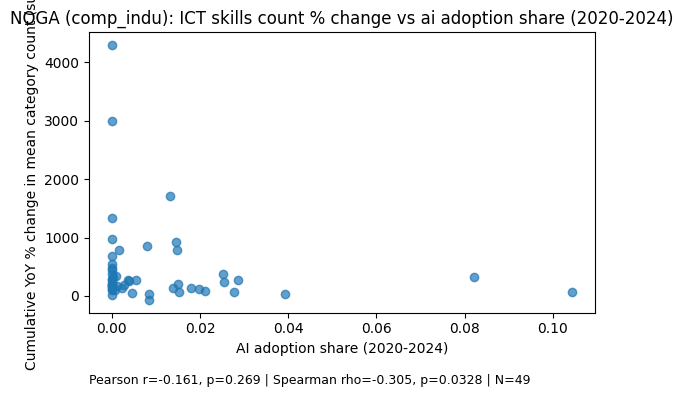

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


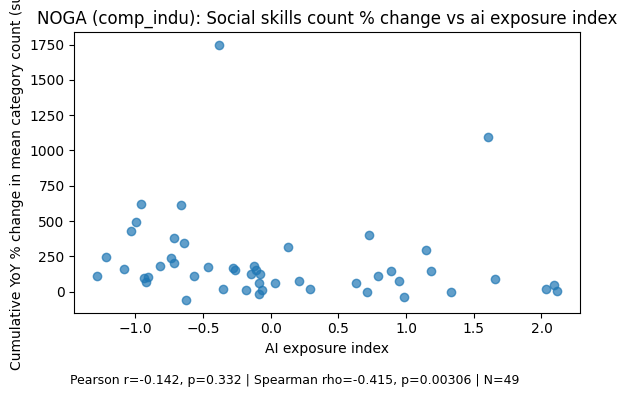

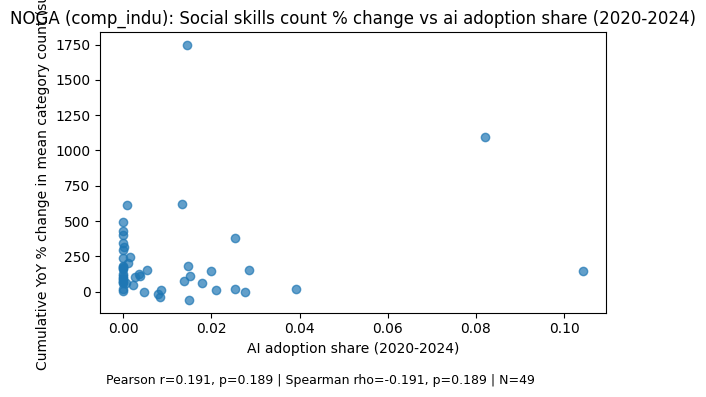

In [21]:
# --- ISCO4 + comp_indu NOGA: selected skill plots (exposure + adoption)

all_mentions = pd.concat([soski_mentions, ict_mentions, exp_mentions], ignore_index=True)
all_mentions = all_mentions.drop_duplicates(subset=['adve_iden_adve', 'category'])

comp_col = None
if 'comp_indu_noga_label' in df.columns:
    comp_col = 'comp_indu_noga_label'
elif 'comp_indu_noga' in df.columns:
    comp_col = 'comp_indu_noga'

groups = []
if 'occu_isco_2008' in df.columns:
    groups.append({'tag': 'isco4', 'gcol': 'occu_isco_2008', 'exp_col': 'occupation_exposure', 'label': 'ISCO4'})
else:
    print('Skipping ISCO4 plots: occu_isco_2008 not in df')

if comp_col:
    groups.append({'tag': 'comp_indu', 'gcol': comp_col, 'exp_col': 'industry_exposure_weighted', 'label': 'NOGA (comp_indu)'})
else:
    print('Skipping comp_indu NOGA plots: comp_indu_noga_label/comp_indu_noga not in df')


def _axes_for_group(gcol, exp_col):
    exp_df = _group_weighted_mean(df, gcol, exp_col)
    exp_df = exp_df.rename(columns={'value': 'mean_exposure'})

    ad_tmp = df.copy()
    ad_tmp['_adoption'] = ADOPTION_INDICATOR
    adoption_df = _group_weighted_mean(ad_tmp, gcol, '_adoption', year_filter=LATE_YEARS)
    adoption_df = adoption_df.rename(columns={'value': 'adoption_share'})

    return exp_df.merge(adoption_df, on='group', how='left')


def _plot_prev_shift_cum(mentions, base_df, gtag, gcol, axes_df, group_label, skill_tag, skill_label):
    prevalence_df, mention_weight_df, total_weight_df = _build_prevalence_tables(mentions, base_df, gcol)
    if prevalence_df.empty:
        print(f'Skipping {group_label} {skill_label} prevalence shift: no prevalence data')
        return

    threshold = THRESH_ISCO2 if gtag == 'isco4' else THRESH_NOGA
    metrics_df = _prevalence_shift_metrics(
        prevalence_df,
        mention_weight_df,
        total_weight_df,
        gcol,
        min_total_weight=threshold,
        require_consecutive_years=True,
    )
    plot_df = metrics_df.merge(axes_df, on='group', how='left')

    for x_tag, x_col, x_label in [
        ('exposure', 'mean_exposure', 'AI exposure index'),
        ('adoption', 'adoption_share', 'AI adoption share (2020-2024)'),
    ]:
        out_name = f"{gtag}__{skill_tag}__prevalence_shift__x-{x_tag}__y-cumulative_shift.png"
        out_path = OUT_PLOTS / out_name
        title = f"{group_label}: {skill_label} prevalence shift vs {x_label.lower()}"
        _scatter_with_corr_below(
            plot_df,
            x_col,
            'cumulative_shift',
            title,
            x_label,
            'Cumulative prevalence shift (sum |delta|)',
            out_path,
        )


def _plot_count_cum(mentions, base_df, gtag, gcol, axes_df, group_label, skill_tag, skill_label):
    value_df = _count_values_by_group_year_with_weight(mentions, base_df, gcol)
    metrics_df = _compute_relative_change_metrics(value_df)
    plot_df = metrics_df.merge(axes_df, on='group', how='left')

    for x_tag, x_col, x_label in [
        ('exposure', 'mean_exposure', 'AI exposure index'),
        ('adoption', 'adoption_share', 'AI adoption share (2020-2024)'),
    ]:
        out_name = f"{gtag}__{skill_tag}__count__rel_pct__x-{x_tag}__y-cumulative_pct_change.png"
        out_path = OUT_PLOTS / out_name
        title = f"{group_label}: {skill_label} count % change vs {x_label.lower()}"
        _scatter_with_corr_below(
            plot_df,
            x_col,
            'cumulative_pct_change',
            title,
            x_label,
            'Cumulative YoY % change in mean category count (sum)',
            out_path,
        )


def _plot_demand_cum(gcol, axes_df, group_label, gtag):
    value_df = _group_year_demand(df, gcol)
    metrics_df = _compute_relative_change_metrics(value_df)
    plot_df = metrics_df.merge(axes_df, on='group', how='left')

    for x_tag, x_col, x_label in [
        ('exposure', 'mean_exposure', 'AI exposure index'),
        ('adoption', 'adoption_share', 'AI adoption share (2020-2024)'),
    ]:
        out_name = f"{gtag}__demand__rel_pct__x-{x_tag}__y-cumulative_pct_change.png"
        out_path = OUT_PLOTS / out_name
        title = f"{group_label}: demand % change vs {x_label.lower()}"
        _scatter_with_corr_below(
            plot_df,
            x_col,
            'cumulative_pct_change',
            title,
            x_label,
            'Cumulative YoY % change in demand (sum)',
            out_path,
        )


for cfg in groups:
    gtag = cfg['tag']
    gcol = cfg['gcol']
    group_label = cfg['label']
    base_df = df_skill if gcol in df_skill.columns else df

    axes_df = _axes_for_group(gcol, cfg['exp_col'])

    # Demand % change (cumulative)
    _plot_demand_cum(gcol, axes_df, group_label, gtag)

    # Prevalence shifts (cumulative)
    _plot_prev_shift_cum(all_mentions, base_df, gtag, gcol, axes_df, group_label, 'allskills', 'All skills')
    _plot_prev_shift_cum(ict_mentions, base_df, gtag, gcol, axes_df, group_label, 'ict', 'ICT skills')
    _plot_prev_shift_cum(exp_mentions, base_df, gtag, gcol, axes_df, group_label, 'exp', 'Experience skills')

    # Count % change (cumulative)
    _plot_count_cum(ict_mentions, base_df, gtag, gcol, axes_df, group_label, 'ict', 'ICT skills')
    _plot_count_cum(soski_mentions, base_df, gtag, gcol, axes_df, group_label, 'soski', 'Social skills')


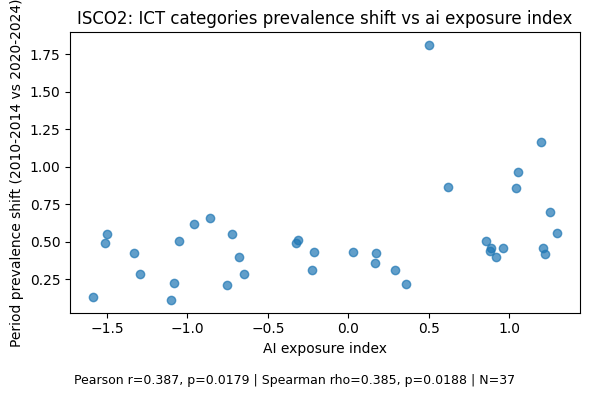

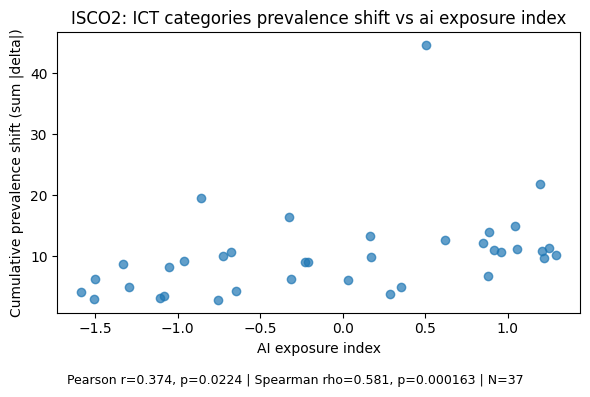

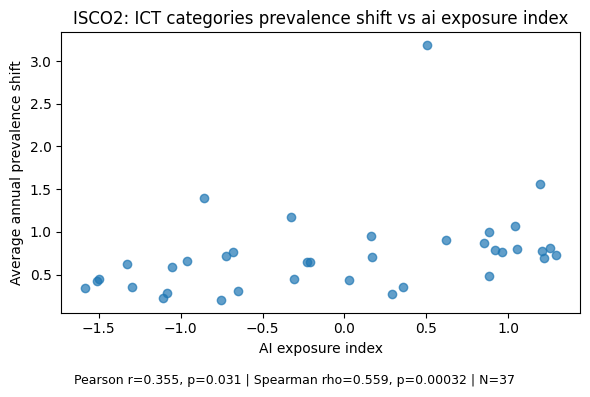

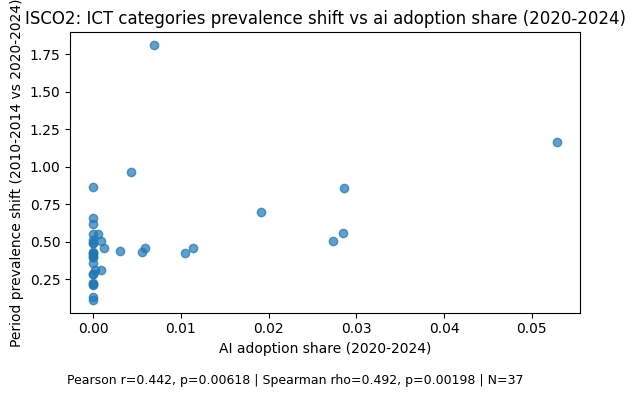

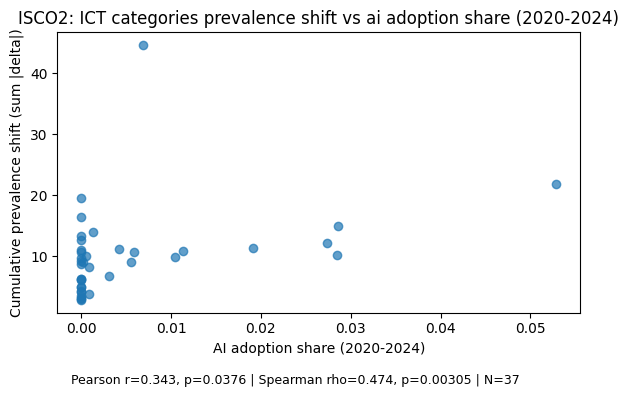

...

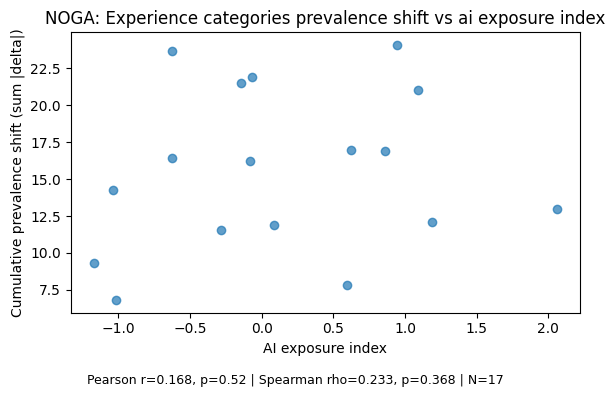

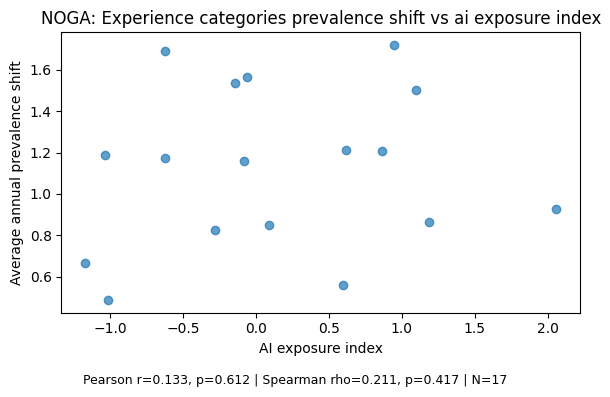

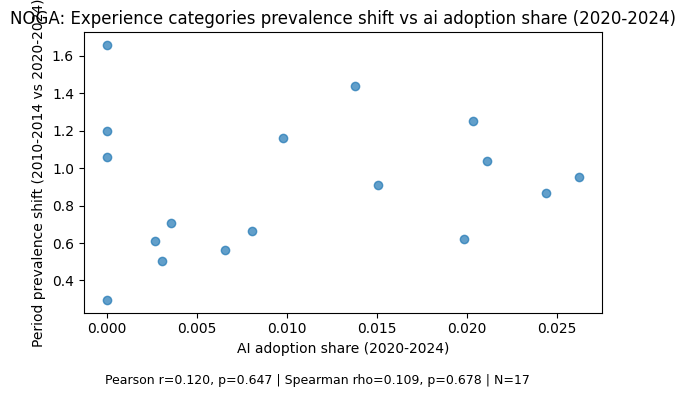

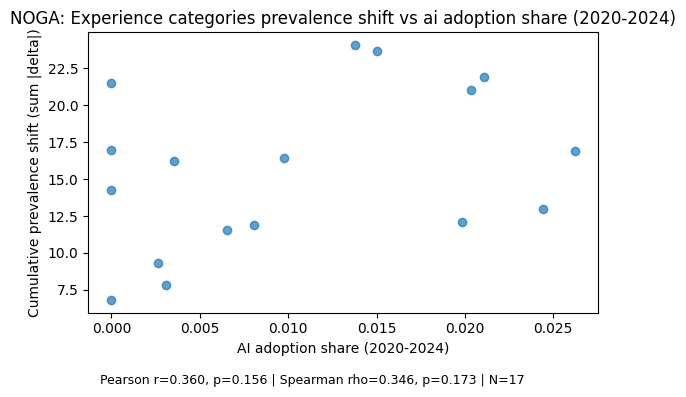

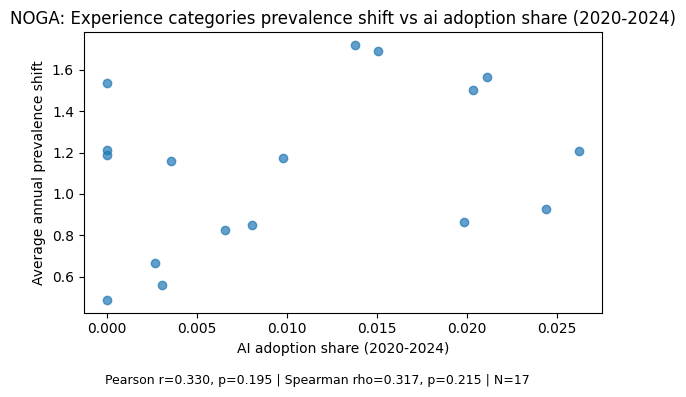

In [ ]:
PREV_Y_METRICS = [
    ('period_shift', 'Period prevalence shift (2010-2014 vs 2020-2024)'),
    ('cumulative_shift', 'Cumulative prevalence shift (sum |delta|)'),
    ('average_shift', 'Average annual prevalence shift'),
]

def _threshold_for_group_tag(tag):
    return THRESH_ISCO2 if tag == 'isco2' else THRESH_NOGA

for cfg in GROUP_CONFIGS:
    gtag = cfg['group_tag']
    gcol = cfg['group_col']
    axes_df = GROUP_AXES[gtag]
    threshold = _threshold_for_group_tag(gtag)

    for fam in FAMILIES:
        prevalence_df, mention_weight_df, total_weight_df = _build_prevalence_tables(fam['mentions'], df_skill, gcol)
        if prevalence_df.empty:
            continue

        metrics_df = _prevalence_shift_metrics(prevalence_df, mention_weight_df, total_weight_df, gcol, min_total_weight=threshold, require_consecutive_years=True)
        plot_df = metrics_df.merge(axes_df, on='group', how='left')

        for x_tag, x_col, x_label in X_AXES:
            for y_tag, y_label in PREV_Y_METRICS:
                out_name = f"{gtag}__{fam['tag']}__prevalence_shift__x-{x_tag}__y-{y_tag}.png"
                out_path = OUT_PLOTS / out_name
                title = f"{cfg['label']}: {fam['label']} prevalence shift vs {x_label.lower()}"

                _scatter_with_corr_below(
                    plot_df, x_col, y_tag, title, x_label, y_label, out_path
                )


Loading task 2010...
Loading task 2011...
Loading task 2012...
Loading task 2013...
Loading task 2014...
Loading task 2015...
Loading task 2016...
Loading task 2017...
Loading task 2018...
Loading task 2019...
Loading task 2020...
Loading task 2021...
Loading task 2022...
Loading task 2023...
Loading task 2024...


/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))


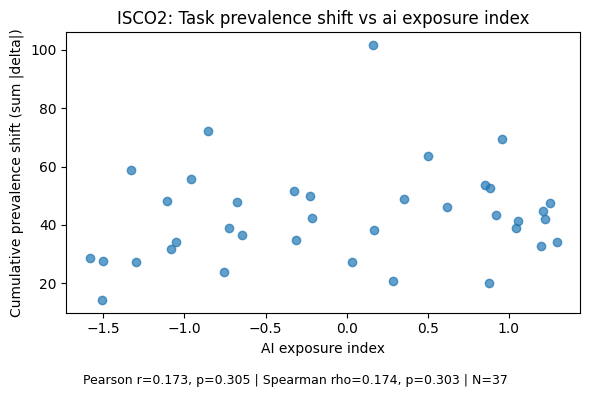

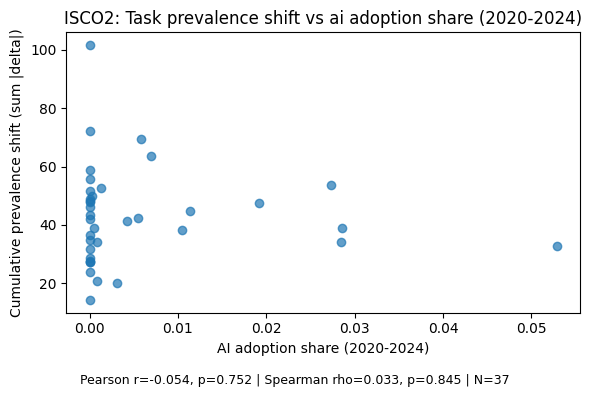

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


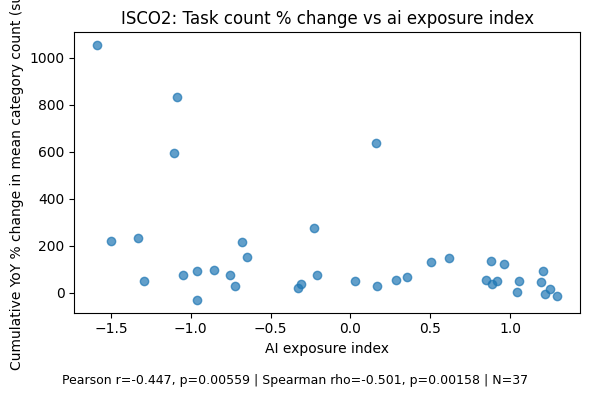

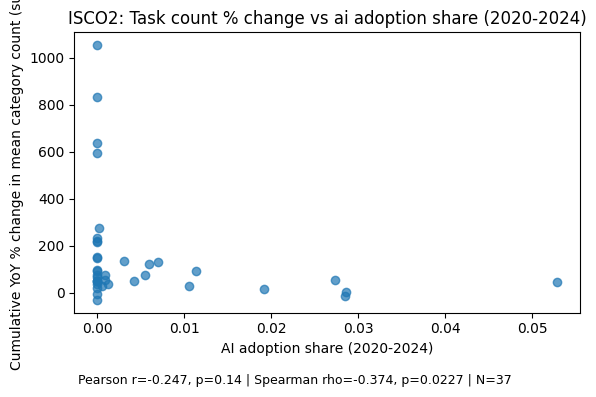

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))


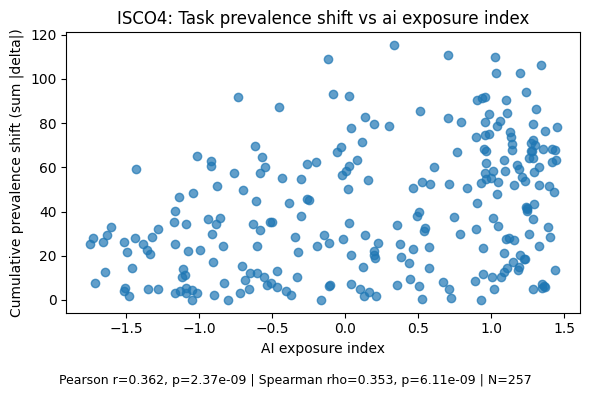

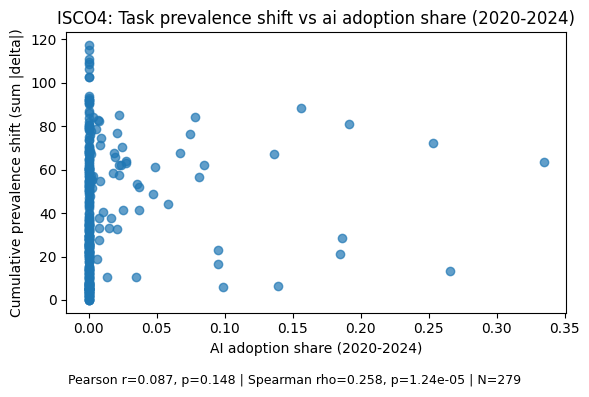

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


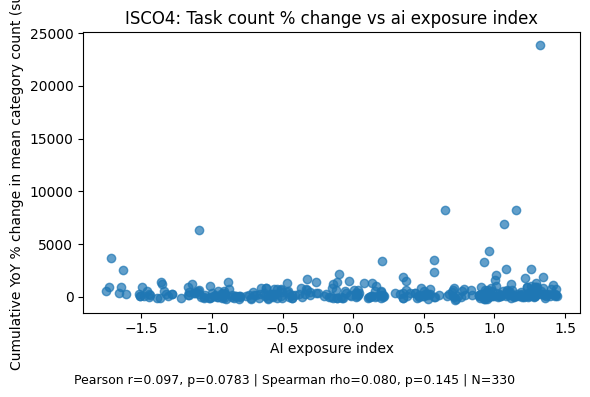

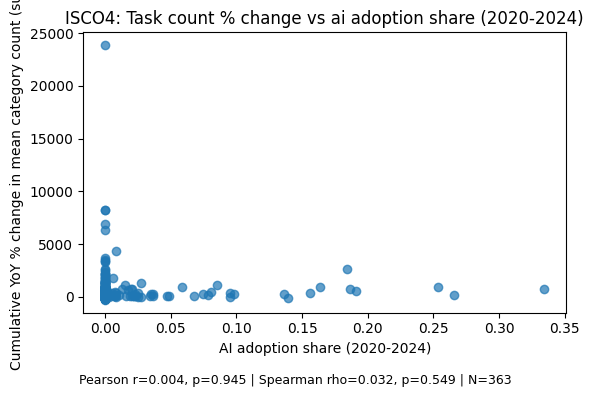

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))


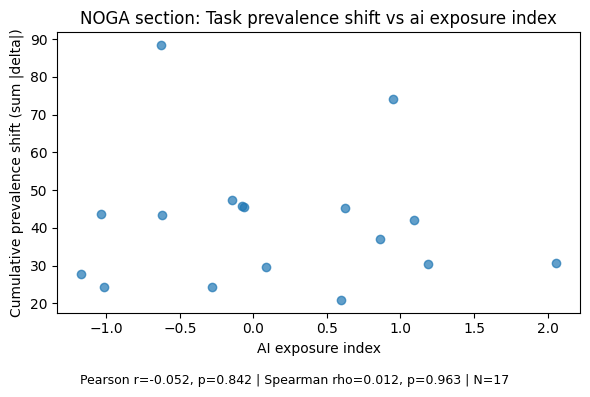

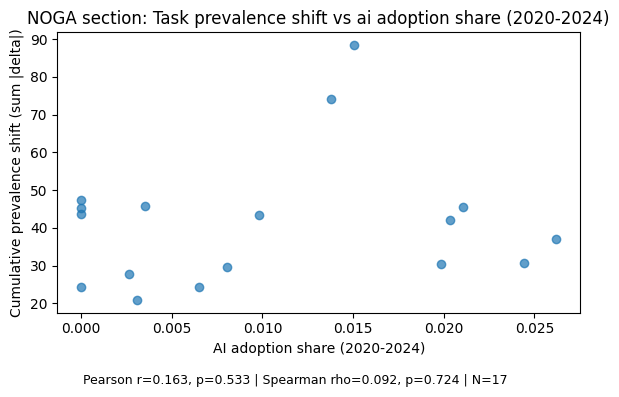

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


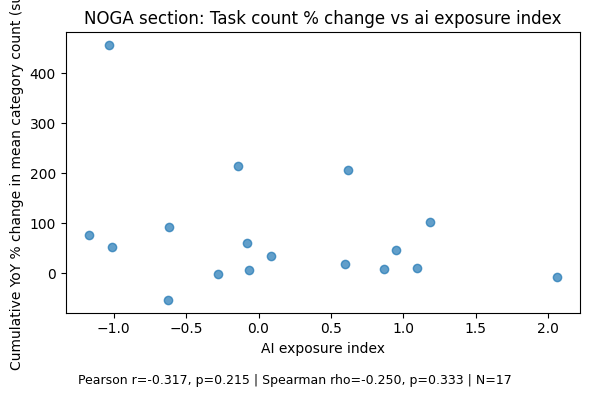

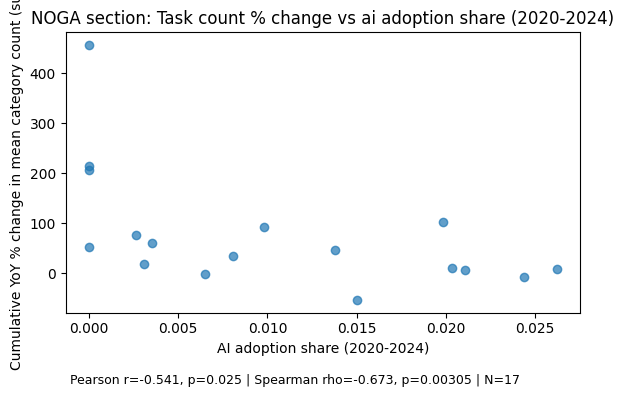

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))
/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/2069715096.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: _weighted_mean(g[value_col], g[WEIGHT]))


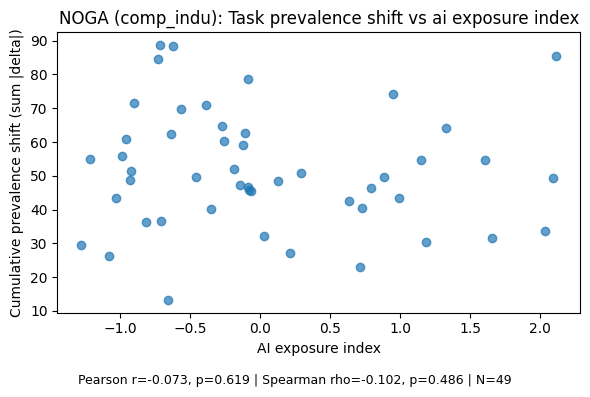

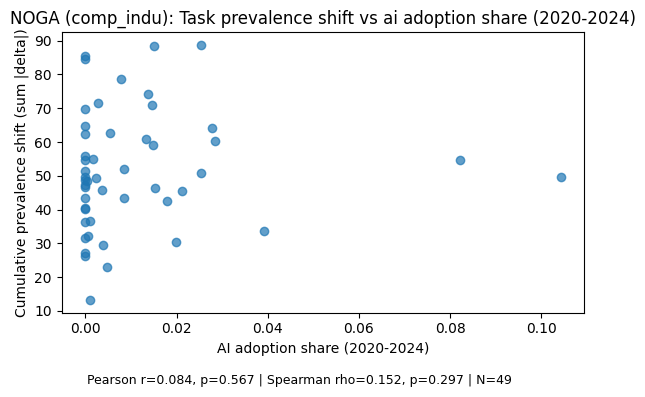

/var/folders/b8/xcnlw57x6_3gqylzftwx02tr0000gn/T/ipykernel_39959/3752023024.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: pd.Series({


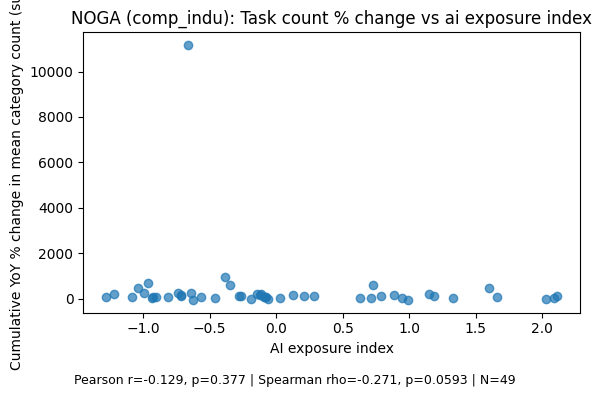

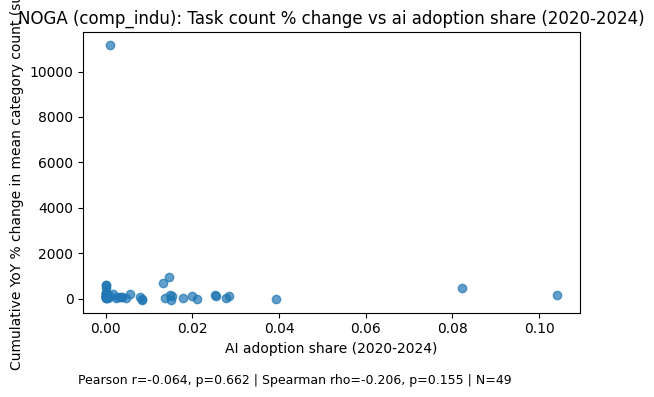

In [24]:
# --- Task categories: ISCO2 + ISCO4 + NOGA section + comp_indu (exposure + adoption)

# Define helper if missing
if '_count_values_by_group_year_with_weight' not in globals():
    def _count_values_by_group_year_with_weight(mentions_df, base_df, group_col):
        counts = mentions_df.groupby('adve_iden_adve')['category'].nunique().rename('cat_count')
        tmp = base_df[['adve_iden_adve', group_col, 'adve_time_year', WEIGHT]].dropna(subset=[group_col, 'adve_time_year'])
        tmp['adve_time_year'] = tmp['adve_time_year'].astype(int)
        tmp = tmp.merge(counts, on='adve_iden_adve', how='left')
        tmp['cat_count'] = tmp['cat_count'].fillna(0)
        out = (
            tmp.groupby([group_col, 'adve_time_year'])
               .apply(lambda g: pd.Series({
                   'value': _weighted_mean(g['cat_count'], g[WEIGHT]),
                   'total_weight': g[WEIGHT].sum(),
               }))
               .reset_index()
               .rename(columns={group_col: 'group'})
        )
        return out

# Load task mentions
ROOT = globals().get('ROOT', _find_root())
SKILL_BASE = ROOT / 'Base Dataset' / 'Data' / '699_SJMM_Data_TextualData_v10.0' / 'sjmm_suf_standoff'
TASK_DIR = SKILL_BASE / 'task-de'

if not TASK_DIR.exists():
    print(f'Skipping task plots: missing {TASK_DIR}')
else:
    YEARS_TASK = YEARS if 'YEARS' in globals() else sorted(df['adve_time_year'].dropna().astype(int).unique())
    YEARS_TASK = [y for y in YEARS_TASK if 2010 <= y <= 2024]
    ADVE_IDS = set(df_skill['adve_iden_adve'].dropna().unique())

    def _find_year_file_task(folder, prefix, year):
        for suffix in ['.jsonl.bz2', '.jsonl']:
            path = folder / f'{prefix}-{year}{suffix}'
            if path.exists():
                return path
        return None

    def _iter_jsonl_task(path):
        import bz2 as _bz2
        import json as _json
        opener = _bz2.open if path.suffix == '.bz2' else open
        with opener(path, 'rt', encoding='utf-8') as f:
            for line in f:
                line = line.strip()
                if not line:
                    continue
                yield _json.loads(line)

    def _best_label_from_mappings_task(mappings, target_ontology=None):
        if mappings:
            for mapping in mappings:
                if target_ontology and mapping.get('ontology') != target_ontology:
                    continue
                classes = mapping.get('classes') or []
                if classes:
                    best = max(classes, key=lambda c: c.get('score', 0))
                    return best.get('label')
        return None

    def _extract_task(obj):
        cats = set()
        for span in obj.get('spans', []) or []:
            label = _best_label_from_mappings_task(span.get('mappings', []), 'O*NET/IWA')
            if label:
                cats.add(label)
        return cats

    def _collect_task_categories(folder, prefix, years, id_set):
        ad_to_cats = {}
        for y in years:
            path = _find_year_file_task(folder, prefix, y)
            if path is None:
                print(f'Missing task file for {y}')
                continue
            print(f'Loading task {y}...')
            for obj in _iter_jsonl_task(path):
                adve = obj.get('adve_iden_adve')
                if adve not in id_set:
                    continue
                cats = _extract_task(obj)
                if cats:
                    ad_to_cats.setdefault(adve, set()).update(cats)
        rows = [{'adve_iden_adve': adve, 'category': cat} for adve, cats in ad_to_cats.items() for cat in cats]
        return pd.DataFrame(rows)

    task_mentions = _collect_task_categories(TASK_DIR, 'task-catg-de', YEARS_TASK, ADVE_IDS)

    comp_col = None
    if 'comp_indu_noga_label' in df.columns:
        comp_col = 'comp_indu_noga_label'
    elif 'comp_indu_noga' in df.columns:
        comp_col = 'comp_indu_noga'

    groups = []
    if 'occu_isco2_label' in df.columns:
        groups.append({'tag': 'isco2', 'gcol': 'occu_isco2_label', 'exp_col': 'occupation_exposure', 'label': 'ISCO2'})
    else:
        print('Skipping ISCO2 task plots: occu_isco2_label not in df')

    if 'occu_isco_2008' in df.columns:
        groups.append({'tag': 'isco4', 'gcol': 'occu_isco_2008', 'exp_col': 'occupation_exposure', 'label': 'ISCO4'})
    else:
        print('Skipping ISCO4 task plots: occu_isco_2008 not in df')

    if 'industry_section_label' in df.columns:
        groups.append({'tag': 'noga', 'gcol': 'industry_section_label', 'exp_col': 'industry_exposure_weighted', 'label': 'NOGA section'})
    elif 'noga_section_label' in df.columns:
        groups.append({'tag': 'noga', 'gcol': 'noga_section_label', 'exp_col': 'industry_exposure_weighted', 'label': 'NOGA section'})
    else:
        print('Skipping NOGA section task plots: no section label column')

    if comp_col:
        groups.append({'tag': 'comp_indu', 'gcol': comp_col, 'exp_col': 'industry_exposure_weighted', 'label': 'NOGA (comp_indu)'})
    else:
        print('Skipping comp_indu task plots: comp_indu_noga_label/comp_indu_noga not in df')

    def _axes_for_group_task(gcol, exp_col):
        exp_df = _group_weighted_mean(df, gcol, exp_col)
        exp_df = exp_df.rename(columns={'value': 'mean_exposure'})

        ad_tmp = df.copy()
        ad_tmp['_adoption'] = ADOPTION_INDICATOR
        adoption_df = _group_weighted_mean(ad_tmp, gcol, '_adoption', year_filter=LATE_YEARS)
        adoption_df = adoption_df.rename(columns={'value': 'adoption_share'})

        return exp_df.merge(adoption_df, on='group', how='left')

    for cfg in groups:
        gtag = cfg['tag']
        gcol = cfg['gcol']
        group_label = cfg['label']
        base_df = df_skill if gcol in df_skill.columns else df
        threshold = THRESH_ISCO2 if gtag in ('isco2', 'isco4') else THRESH_NOGA

        axes_df = _axes_for_group_task(gcol, cfg['exp_col'])

        # Prevalence shift (cumulative)
        prevalence_df, mention_weight_df, total_weight_df = _build_prevalence_tables(task_mentions, base_df, gcol)
        if prevalence_df.empty:
            print(f'Skipping {group_label} task prevalence shift: no prevalence data')
        else:
            metrics_df = _prevalence_shift_metrics(
                prevalence_df,
                mention_weight_df,
                total_weight_df,
                gcol,
                min_total_weight=threshold,
                require_consecutive_years=True,
            )
            plot_df = metrics_df.merge(axes_df, on='group', how='left')

            for x_tag, x_col, x_label in [
                ('exposure', 'mean_exposure', 'AI exposure index'),
                ('adoption', 'adoption_share', 'AI adoption share (2020-2024)'),
            ]:
                out_name = f"{gtag}__task__prevalence_shift__x-{x_tag}__y-cumulative_shift.png"
                out_path = OUT_PLOTS / out_name
                title = f"{group_label}: Task prevalence shift vs {x_label.lower()}"
                _scatter_with_corr_below(
                    plot_df,
                    x_col,
                    'cumulative_shift',
                    title,
                    x_label,
                    'Cumulative prevalence shift (sum |delta|)',
                    out_path,
                )

        # Count % change (cumulative)
        value_df = _count_values_by_group_year_with_weight(task_mentions, base_df, gcol)
        metrics_df = _compute_relative_change_metrics(value_df)
        plot_df = metrics_df.merge(axes_df, on='group', how='left')
        if gtag == 'isco2':
            plot_df = plot_df[plot_df['group'] != 'Agricultural, forestry and fishery labourers']

        for x_tag, x_col, x_label in [
            ('exposure', 'mean_exposure', 'AI exposure index'),
            ('adoption', 'adoption_share', 'AI adoption share (2020-2024)'),
        ]:
            out_name = f"{gtag}__task__count__rel_pct__x-{x_tag}__y-cumulative_pct_change.png"
            out_path = OUT_PLOTS / out_name
            title = f"{group_label}: Task count % change vs {x_label.lower()}"
            _scatter_with_corr_below(
                plot_df,
                x_col,
                'cumulative_pct_change',
                title,
                x_label,
                'Cumulative YoY % change in mean category count (sum)',
                out_path,
            )
